## Kidney Failure Risk Prediction in Intensive Care Unit (ICU) Patients

## Problem Statement
Acute Kidney Injury (AKI) complicates up to 15% of hospitalizations and can occur in 50–60% of critically ill patients and it has significant short-term and long-term implications. Studies have linked AKI to adverse long-term outcomes, including recurrent AKI episodes (25–30% of cases), hospital readmissions (up to 40% of patients), increased risk of cardiovascular events, progression of chronic kidney disease (CKD), and significantly elevated long-term mortality rates1. Therefore, the development of a predictive model for assessing the likelihood of intensive care unit (ICU) patients developing AKI is imperative for facilitating timely intervention and treatment, eventually leading to improved patient outcomes and survival rates. The objective of this project is to leverage machine learning (ML) techniques to develop a risk predictive model for AKI in ICU patients that could assist in clinical decision-making and clinical management


## Overview of Workflow

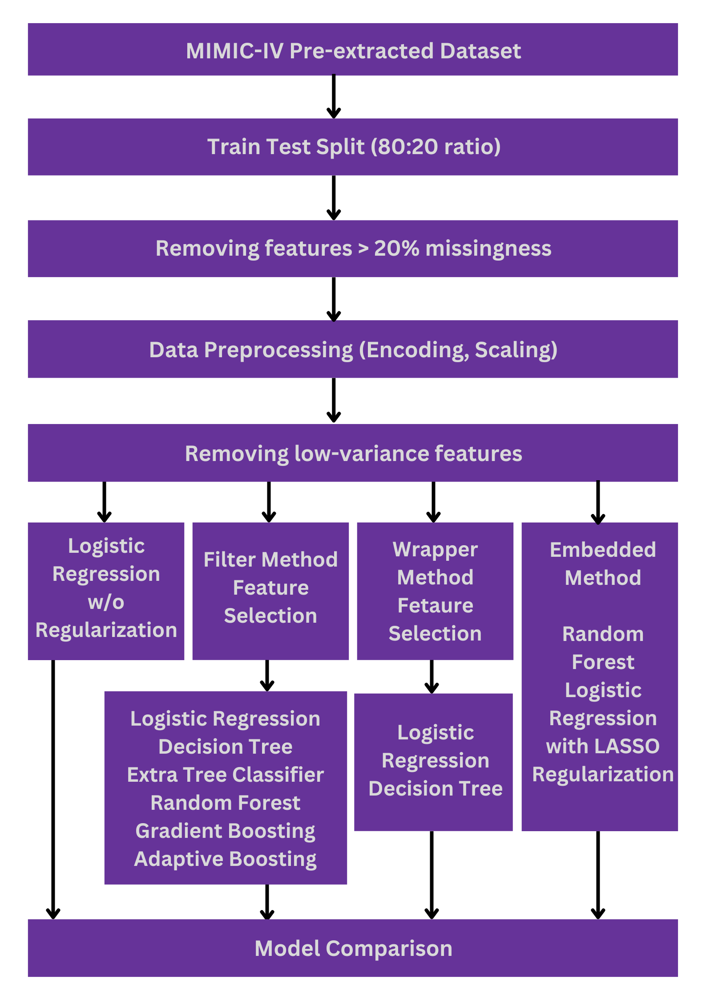

## Part 1 | Data Loading & Understanding

### 1.1 Import Essential Libraries

In [1]:
# import essential libraries for data analytics
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import helper

### 1.2 Load the Dataset & Basic Dataset Information

About the Dataset:

The dataset used in this project has been pre-extracted and pre-processed from the Medical Information Mart for Intensive Care-IV (MIMIC-IV) database by Professor Mengling and Mr. Daniel. Prior to obtaining the data, ‘CITI Data or Specimens Only Research’ training was completed, and a data use agreement was signed. The pre-extracted dataset consists of 50,920 observations and 162 columns, with one column designated for the target labels. There are four classes in the target labels: 0 for no acute kidney injury (AKI), and 1, 2, and 3 representing stages 1, 2, and 3 of AKI, respectively.


In [2]:
# load the dataset
data = pd.read_csv('data/sph6004_assignment1_data.csv')

# check the dimension of the dataset
num_row, num_col = data.shape
print('The dataset contains {} rows and {} columns.'.format(num_row, num_col))

# check the attributes in the dataset
print('Attributes in the dataset: ', data.columns.values)

# set the max column to view
pd.set_option('display.max_columns', data.shape[1]) # increase the total number of columns display on notebook
pd.set_option('display.max_rows', 200)              # increase the total number of rows display on notebook

# view the first 5 rows of the dataset
data.head()

The dataset contains 50920 rows and 162 columns.
Attributes in the dataset:  ['id' 'aki' 'gender' 'admission_age' 'race' 'heart_rate_min'
 'heart_rate_max' 'heart_rate_mean' 'sbp_min' 'sbp_max' 'sbp_mean'
 'dbp_min' 'dbp_max' 'dbp_mean' 'mbp_min' 'mbp_max' 'mbp_mean'
 'resp_rate_min' 'resp_rate_max' 'resp_rate_mean' 'temperature_min'
 'temperature_max' 'temperature_mean' 'spo2_min' 'spo2_max' 'spo2_mean'
 'glucose_min' 'glucose_max' 'glucose_mean' 'lactate_min' 'lactate_max'
 'ph_min' 'ph_max' 'so2_min' 'so2_max' 'po2_min' 'po2_max' 'pco2_min'
 'pco2_max' 'aado2_min' 'aado2_max' 'aado2_calc_min' 'aado2_calc_max'
 'pao2fio2ratio_min' 'pao2fio2ratio_max' 'baseexcess_min' 'baseexcess_max'
 'bicarbonate_min' 'bicarbonate_max' 'totalco2_min' 'totalco2_max'
 'hematocrit_min' 'hematocrit_max' 'hemoglobin_min' 'hemoglobin_max'
 'carboxyhemoglobin_min' 'carboxyhemoglobin_max' 'methemoglobin_min'
 'methemoglobin_max' 'temperature_min.1' 'temperature_max.1'
 'chloride_min' 'chloride_max' 'calcium

,id,aki,gender,admission_age,race,heart_rate_min,heart_rate_max,heart_rate_mean,sbp_min,sbp_max,sbp_mean,dbp_min,dbp_max,dbp_mean,mbp_min,mbp_max,mbp_mean,resp_rate_min,resp_rate_max,resp_rate_mean,temperature_min,temperature_max,temperature_mean,spo2_min,spo2_max,spo2_mean,glucose_min,glucose_max,glucose_mean,lactate_min,lactate_max,ph_min,ph_max,so2_min,so2_max,po2_min,po2_max,pco2_min,pco2_max,aado2_min,aado2_max,aado2_calc_min,aado2_calc_max,pao2fio2ratio_min,pao2fio2ratio_max,baseexcess_min,baseexcess_max,bicarbonate_min,bicarbonate_max,totalco2_min,totalco2_max,hematocrit_min,hematocrit_max,hemoglobin_min,hemoglobin_max,carboxyhemoglobin_min,carboxyhemoglobin_max,methemoglobin_min,methemoglobin_max,temperature_min.1,temperature_max.1,chloride_min,chloride_max,calcium_min,calcium_max,glucose_min.1,glucose_max.1,potassium_min,potassium_max,sodium_min,sodium_max,hematocrit_min.1,hematocrit_max.1,hemoglobin_min.1,hemoglobin_max.1,platelets_min,platelets_max,wbc_min,wbc_max,albumin_min,albumin_max,globulin_min,globulin_max,total_protein_min,total_protein_max,aniongap_min,aniongap_max,bicarbonate_min.1,bicarbonate_max.1,bun_min,bun_max,calcium_min.1,calcium_max.1,chloride_min.1,chloride_max.1,glucose_min.2,glucose_max.2,sodium_min.1,sodium_max.1,potassium_min.1,potassium_max.1,abs_basophils_min,abs_basophils_max,abs_eosinophils_min,abs_eosinophils_max,abs_lymphocytes_min,abs_lymphocytes_max,abs_monocytes_min,abs_monocytes_max,abs_neutrophils_min,abs_neutrophils_max,atyps_min,atyps_max,bands_min,bands_max,imm_granulocytes_min,imm_granulocytes_max,metas_min,metas_max,nrbc_min,nrbc_max,d_dimer_min,d_dimer_max,fibrinogen_min,fibrinogen_max,thrombin_min,thrombin_max,inr_min,inr_max,pt_min,pt_max,ptt_min,ptt_max,alt_min,alt_max,alp_min,alp_max,ast_min,ast_max,amylase_min,amylase_max,bilirubin_total_min,bilirubin_total_max,bilirubin_direct_min,bilirubin_direct_max,bilirubin_indirect_min,bilirubin_indirect_max,ck_cpk_min,ck_cpk_max,ck_mb_min,ck_mb_max,ggt_min,ggt_max,ld_ldh_min,ld_ldh_max,gcs_min,gcs_motor,gcs_verbal,gcs_eyes,gcs_unable,height,weight_admit
0,36570066,3,F,79.953141,BLACK/AFRICAN AMERICAN,96.0,104.0,100.083333,103.0,126.0,116.136364,40.0,58.0,47.863636,56.0,69.0,63.090909,13.0,24.0,16.833333,35.89,36.39,36.222000,96.0,100.0,98.916667,76.0,211.0,146.2,2.3,2.3,7.40,7.40,98.0,98.0,101.0,101.0,47.0,47.0,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,NaN,NaN,30.0,30.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,100.0,NaN,NaN,NaN,NaN,5.2,5.2,129.0,129.0,27.8,29.2,9.2,9.8,304.0,333.0,11.0,14.3,2.6,2.9,NaN,NaN,NaN,NaN,15.0,20.0,23.0,28.0,47.0,52.0,8.1,9.0,93.0,101.0,76.0,167.0,131.0,138.0,4.8,6.7,0.0000,0.0000,0.0000,0.3300,0.2200,0.8220,0.5480,0.8800,7.8100,10.5490,0.0,0.0,5.0,11.0,NaN,NaN,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.1,1.1,11.9,12.0,28.6,29.5,103.0,133.0,992.0,1199.0,106.0,196.0,NaN,NaN,6.8,17.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,236.0,318.0,15.0,6.0,5.0,4.0,0.0,157.0,110.0
1,39307659,0,F,78.194169,WHITE - RUSSIAN,72.0,134.0,97.263158,97.0,127.0,109.833333,56.0,89.0,70.166667,65.0,96.0,79.555556,17.0,38.0,29.611111,36.28,37.00,36.558000,91.0,98.0,95.444444,127.0,132.0,129.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36.3,39.5,12.1,13.0,199.0,247.0,12.0,14.9,3.7,3.9,NaN,NaN,NaN,NaN,13.0,22.0,19.0,29.0,23.0,30.0,7.9,8.4,89.0,93.0,127.0,143.0,126.0,132.0,2.9,4.5,0.0294,0.0294,0.0147,0.0147,1.5141,1.5141,0.5586,0.5586,12.5832,12.5832,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.9,2.3,20.0,24.7,28.4,150.0,272.0,384.0,282.0,331.0,183.0,356.0,NaN,NaN,1.9,2.9,NaN,NaN,NaN,NaN,175.0,175.0,8.0,8.0,NaN,NaN,NaN,NaN,15.0,6.0,5.0,4.0,0.0,NaN,82.0
2,38743306,2,F,65.602396,WHITE,60.0,97.0,84.166667,95.0,143.0,112.153846,56.0,99.0,73.307692,69.0,108.0,85.692308,14.0,19.0,16.000000,36.67,37.00,36.805000,94.0,100.0,97.166667,207.0,305.0,254.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [3]:
# set the maximum number of displayed columns to a high value
pd.set_option('display.max_info_columns', data.shape[1])

# summary of the dataframe
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50920 entries, 0 to 50919
Data columns (total 162 columns):
 #    Column                  Non-Null Count  Dtype  
---   ------                  --------------  -----  
 0    id                      50920 non-null  int64  
 1    aki                     50920 non-null  int64  
 2    gender                  50920 non-null  object 
 3    admission_age           50920 non-null  float64
 4    race                    50920 non-null  object 
 5    heart_rate_min          50841 non-null  float64
 6    heart_rate_max          50841 non-null  float64
 7    heart_rate_mean         50841 non-null  float64
 8    sbp_min                 50823 non-null  float64
 9    sbp_max                 50823 non-null  float64
 10   sbp_mean                50823 non-null  float64
 11   dbp_min                 50823 non-null  float64
 12   dbp_max                 50823 non-null  float64
 13   dbp_mean                50823 non-null  float64
 14   mbp_min             

### 1.3 Duplicate Records Inspection

In [4]:
# let's check if there is duplicate ID in the dataset
num_duplicates = data['id'].duplicated().sum()
print('There is/are {} duplicate records in the dataset.'.format(num_duplicates))

There is/are 0 duplicate records in the dataset.


In [5]:
# there is no duplicate data 
# exclude column 'id' from the following analysis
data.drop(columns=['id'], axis=1, inplace=True)

### 1.4 Train Test Split

A train-test split was executed with an 80:20 ratio (train: test). To ensure representative sampling, the dataset was stratified based on the distribution of target classes and shuffled prior to division into the training and test datasets. As a result, the training dataset comprises 40,736 rows and 161 columns, while the test dataset comprises 10,184 rows and 161 columns. 

In [6]:
# segregate the data into feature matrix and target vector
X_matrix = data.drop(columns=['aki'], axis=1)
y_vector = data['aki']

In [7]:
from sklearn.model_selection import train_test_split

Xtrain, Xtest, ytrain, ytest = train_test_split(X_matrix, y_vector, test_size=0.2, stratify=y_vector, shuffle=True, random_state=122)      # split the data into training and test dataset (8:2 ratio)
                                                                                                                                           # test dataset will be reserved as the unseen dataset for assessing the model performance

# check the dimension of the training and test dataset
print('Dimension of feature matrix of training set: ', Xtrain.shape)
print('Dimension of feature matrix of test set: ', Xtest.shape)

Dimension of feature matrix of training set:  (40736, 160)
Dimension of feature matrix of test set:  (10184, 160)


### 1.5 Class Distribution in Target Variable

In [8]:
import plotly.express as px

target = ytrain.value_counts()

labels = ['No AKI', 'AKI Stage II', 'AKI Stage I', 'AKI Stage III']

fig = px.pie(target, 
             values=target.values, 
             names=labels, 
             width=600,
             height=500,
             title='Distribution of Target Classes (Training Dataset)')
fig.show()

In [9]:
# this project will be focus on predicting AKI
# 2 classes: 0-No AKI, 1-AKI

# convert all classes 2 & 3 in training and test dataset into class 1
ytrain.replace({2:1,3:1}, inplace=True)
ytest.replace({2:1, 3:1}, inplace=True)

In [10]:
target = ytrain.value_counts()

labels = ['AKI', 'No AKI']

fig = px.pie(target, 
             values=target.values, 
             names=labels, 
             width=600,
             height=500,
             title='Distribution of Target Classes (Training Dataset)')
fig.show()

### 1.6 Missing Value Inspection

<Axes: >

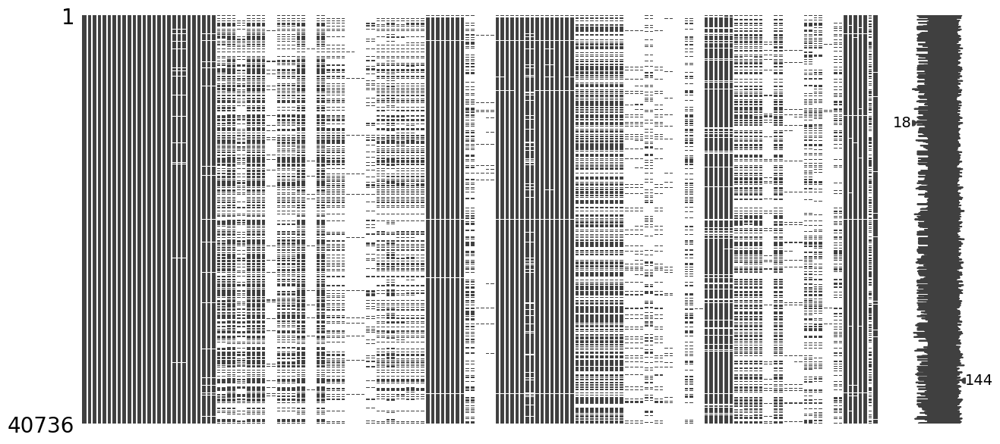

In [11]:
import missingno as msno

# visualize the pattern of missingness in the training dataset (feature matrix)
msno.matrix(Xtrain, figsize=(15,7))

In [12]:
# try with the straight forward approach to deal with missing value by removing all missing value in the dataset (ignoring and discarding the data)
# let's removing records that contain missing values in any of the attributes
train_copy = Xtrain.copy()
train_copy.dropna(inplace=True)

# check the dimension of the dataset after removing records contain missing values in any of the attributes
num_row = train_copy.shape[0]
print('By removing the records contain missing values in any of the attributes, there will be {} records remaining in the dataset.'.format(num_row))

By removing the records contain missing values in any of the attributes, there will be 0 records remaining in the dataset.


In [13]:
# create a dataframe for contains information of the missingness for each independent variable in the training dataset
missingValue_df = pd.DataFrame(Xtrain.isna().sum(), columns=['Num_Missing'])

# insert a new column to dataframe 'missingValue_df' - the percentage of missingness for each attribute in the dataset
missingValue_df['Percent_Missing'] = np.round((missingValue_df['Num_Missing'] / data.shape[0]) * 100, 2)

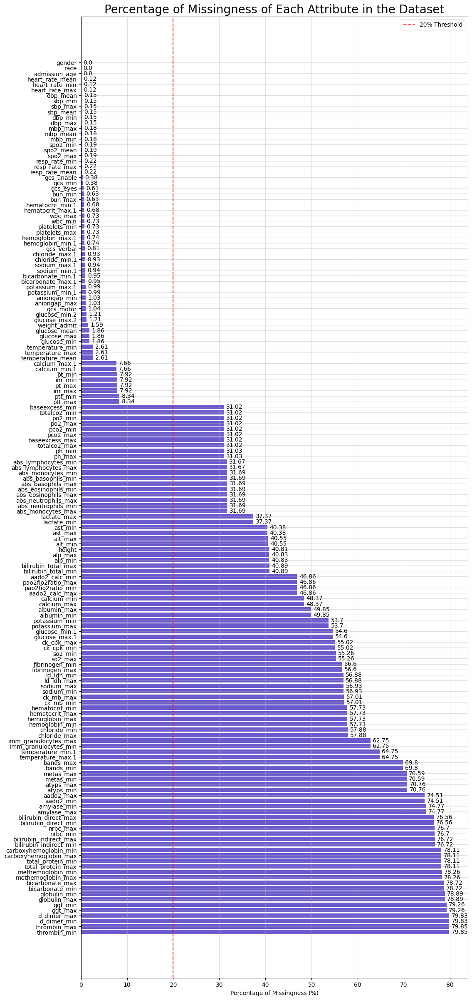

In [14]:
# visualize the percentage of missingness for each attribute in the dataset
missingPercentage = missingValue_df['Percent_Missing'].sort_values(ascending=False)

# plot a horizontal bar chart
plt.figure(figsize=(12,30))                                                                 # create a figure
plt.barh(y=missingPercentage.index, width=missingPercentage.values, color='slateblue')      # plot horizaontal bar chart
plt.axvline(x=20, color='red', linestyle='--', label='20% Threshold')                       # add a line for 30% threshold for the missingness %
plt.xlabel('Percentage of Missingness (%)')                                                 # add title to x-axis

for index, values in enumerate(missingPercentage):                                          # label the value for each bar in the plot
    plt.text(values+0.5, index, str(values), va='center')

plt.title('Percentage of Missingness of Each Attribute in the Dataset', fontsize=20)        # add plot title
plt.grid(alpha=0.4)                                                                         # add grid to the plot
plt.legend()                                                                                # add legend
plt.show()                                                                                  # display the plot

In [15]:
# extract the variables in the dataset with percentage of missingness greater than 20%
lessMissingFeats = missingValue_df[missingValue_df['Percent_Missing'] >= 20].index.to_list()

# check the total number of variables that has more than 20% of missing value
print('There are {} variables in the training dataset have more than 20% of missing data. \n\nThese attributes are: {}'.format(len(lessMissingFeats), lessMissingFeats))

There are 97 variables in the training dataset have more than 20% of missing data. 

These attributes are: ['lactate_min', 'lactate_max', 'ph_min', 'ph_max', 'so2_min', 'so2_max', 'po2_min', 'po2_max', 'pco2_min', 'pco2_max', 'aado2_min', 'aado2_max', 'aado2_calc_min', 'aado2_calc_max', 'pao2fio2ratio_min', 'pao2fio2ratio_max', 'baseexcess_min', 'baseexcess_max', 'bicarbonate_min', 'bicarbonate_max', 'totalco2_min', 'totalco2_max', 'hematocrit_min', 'hematocrit_max', 'hemoglobin_min', 'hemoglobin_max', 'carboxyhemoglobin_min', 'carboxyhemoglobin_max', 'methemoglobin_min', 'methemoglobin_max', 'temperature_min.1', 'temperature_max.1', 'chloride_min', 'chloride_max', 'calcium_min', 'calcium_max', 'glucose_min.1', 'glucose_max.1', 'potassium_min', 'potassium_max', 'sodium_min', 'sodium_max', 'albumin_min', 'albumin_max', 'globulin_min', 'globulin_max', 'total_protein_min', 'total_protein_max', 'abs_basophils_min', 'abs_basophils_max', 'abs_eosinophils_min', 'abs_eosinophils_max', 'abs_lym

In [16]:
# exclude the variables containing more than 20% of missing data in training and test dataset (feature matrix)
Xtrain.drop(columns=lessMissingFeats, axis=1, inplace=True)
Xtest.drop(columns=lessMissingFeats, axis=1, inplace=True)

# check the dimension of the training and test dataset
print('Dimension of training dataset: ', Xtrain.shape)
print('Dimension of test dataset: ', Xtest.shape)

Dimension of training dataset:  (40736, 63)
Dimension of test dataset:  (10184, 63)


<Axes: >

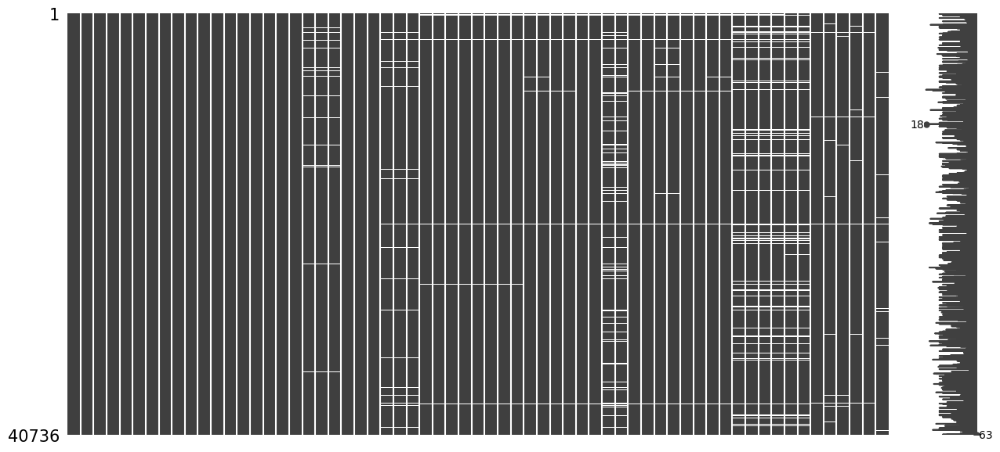

In [17]:
# visualize the pattern of the missingness for the remaining variables in training dataset
msno.matrix(Xtrain, figsize=(15,7), fontsize=12)

## Part 2 | Data Preprocessing

### 2.1 Re-categorization for Value in Variable 'Race'

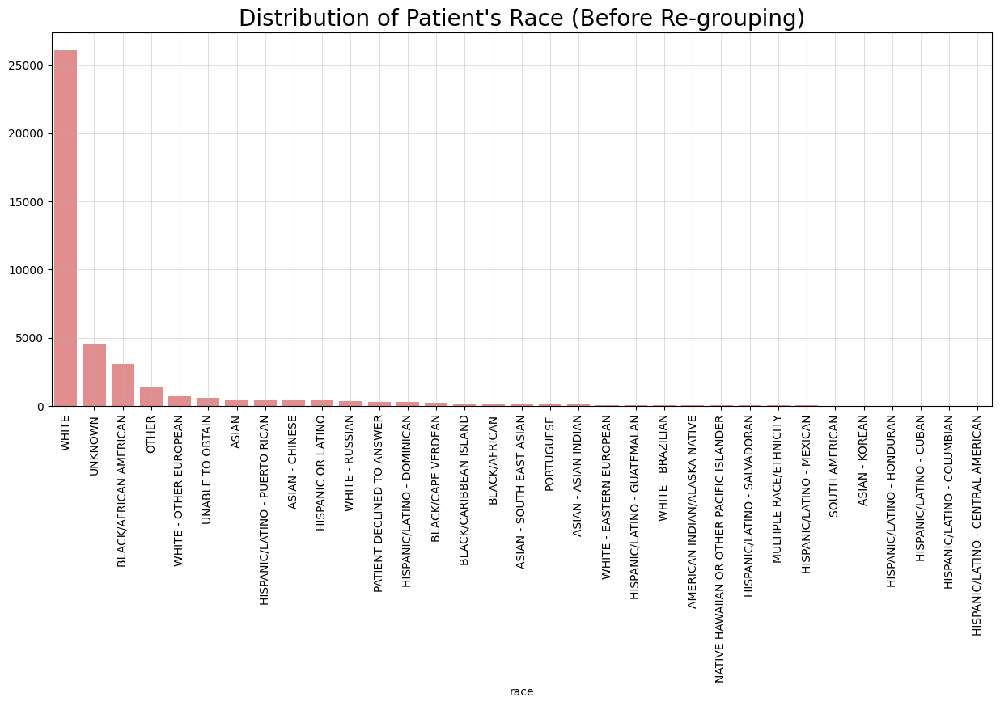

In [18]:
# distribution of patient's race before re-grouping
race_raw = Xtrain['race'].value_counts()

plt.figure(figsize=(15,6))                                                      # create a figure
sns.barplot(x=race_raw.index, y=race_raw.values, color='lightcoral')            # plot a bar chart
plt.xticks(rotation=90)                                                         # rotate the label on x-asis for better visualization
plt.grid(alpha=0.4)                                                             # add grid to the plot
plt.title('Distribution of Patient\'s Race (Before Re-grouping)', fontsize=20)  # add plot title
plt.show()                                                                      # display the plot

In [19]:
# grouping of race (training dataset)
Xtrain['race'].replace(to_replace=['UNABLE TO OBTAIN','PATIENT DECLINED TO ANSWER'], value='UNKNOWN', inplace=True)
Xtrain['race'].replace(to_replace=['HISPANIC/LATINO - PUERTO RICAN','HISPANIC OR LATINO','HISPANIC/LATINO - DOMINICAN',
                          'HISPANIC/LATINO - GUATEMALAN','HISPANIC/LATINO - SALVADORAN','HISPANIC/LATINO - MEXICAN',
                          'HISPANIC/LATINO - CUBAN','HISPANIC/LATINO - HONDURAN','HISPANIC/LATINO - COLUMBIAN',
                          'HISPANIC/LATINO - CENTRAL AMERICAN'], value='HISPANIC/LATINO', inplace=True)
Xtrain['race'].replace(to_replace=['ASIAN - CHINESE','ASIAN - SOUTH EAST ASIAN','ASIAN - ASIAN INDIAN',
                           'ASIAN - KOREAN'], value='ASIAN', inplace=True)
Xtrain['race'].replace(to_replace=['BLACK/AFRICAN AMERICAN','BLACK/CAPE VERDEAN','BLACK/CARIBBEAN ISLAND','BLACK/AFRICAN'],
                         value='BLACK', inplace=True)
Xtrain['race'].replace(to_replace=['WHITE - OTHER EUROPEAN','WHITE - RUSSIAN', 'WHITE - EASTERN EUROPEAN','WHITE - BRAZILIAN','PORTUGUESE'],
                         value='WHITE', inplace=True)
Xtrain['race'].replace(to_replace=['AMERICAN INDIAN/ALASKA NATIVE','NATIVE HAWAIIAN OR OTHER PACIFIC ISLANDER','SOUTH AMERICAN',
                          'MULTIPLE RACE/ETHNICITY'], value='OTHER', inplace=True)

C:\Users\65814\AppData\Local\Temp\ipykernel_28736\1097502696.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [20]:
# grouping of race (test dataset)
Xtest['race'].replace(to_replace=['UNABLE TO OBTAIN','PATIENT DECLINED TO ANSWER'], value='UNKNOWN', inplace=True)
Xtest['race'].replace(to_replace=['HISPANIC/LATINO - PUERTO RICAN','HISPANIC OR LATINO','HISPANIC/LATINO - DOMINICAN',
                          'HISPANIC/LATINO - GUATEMALAN','HISPANIC/LATINO - SALVADORAN','HISPANIC/LATINO - MEXICAN',
                          'HISPANIC/LATINO - CUBAN','HISPANIC/LATINO - HONDURAN','HISPANIC/LATINO - COLUMBIAN',
                          'HISPANIC/LATINO - CENTRAL AMERICAN'], value='HISPANIC/LATINO', inplace=True)
Xtest['race'].replace(to_replace=['ASIAN - CHINESE','ASIAN - SOUTH EAST ASIAN','ASIAN - ASIAN INDIAN',
                           'ASIAN - KOREAN'], value='ASIAN', inplace=True)
Xtest['race'].replace(to_replace=['BLACK/AFRICAN AMERICAN','BLACK/CAPE VERDEAN','BLACK/CARIBBEAN ISLAND','BLACK/AFRICAN'],
                         value='BLACK', inplace=True)
Xtest['race'].replace(to_replace=['WHITE - OTHER EUROPEAN','WHITE - RUSSIAN', 'WHITE - EASTERN EUROPEAN','WHITE - BRAZILIAN','PORTUGUESE'],
                         value='WHITE', inplace=True)
Xtest['race'].replace(to_replace=['AMERICAN INDIAN/ALASKA NATIVE','NATIVE HAWAIIAN OR OTHER PACIFIC ISLANDER','SOUTH AMERICAN',
                          'MULTIPLE RACE/ETHNICITY'], value='OTHER', inplace=True)

C:\Users\65814\AppData\Local\Temp\ipykernel_28736\3877034700.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





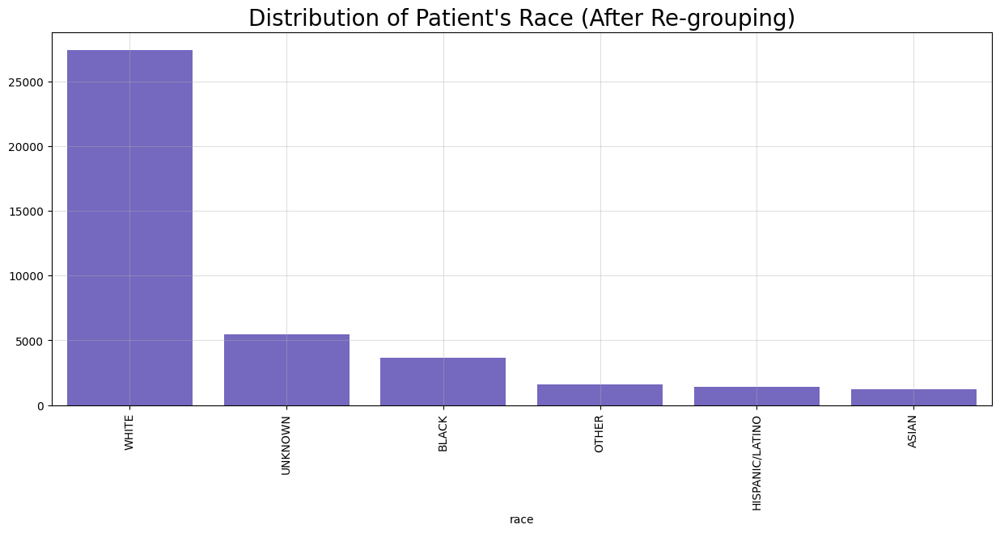

In [21]:
# distribution of patient's race after re-grouping
race_regroup = Xtrain['race'].value_counts()

plt.figure(figsize=(15,6))                                                     # create a figure
sns.barplot(x=race_regroup.index, y=race_regroup.values, color='slateblue')    # plot a bar chart
plt.xticks(rotation=90)                                                        # rotate the label of x-axis for better visualization
plt.grid(alpha=0.4)                                                            # add grid to the plot
plt.title('Distribution of Patient\'s Race (After Re-grouping)', fontsize=20)  # add plot title
plt.show()                                                                     # display the plot

### 2.2 Feature Engineering (Encoding, Scaling, Imputation)

One Hot Encoding:

As most machine learning algorithms can only process numerical inputs, converting relevant categorical variables into numerical formats is a crucial step in data pre-processing before model training. There are 2 categorical features in the dataset, which are race and gender. The One Hot Encoding technique was applied to encode the categorical features into numeric representations. This technique functions by assigning each unique category value as a binary vector, where all values are zero except for the index corresponding to the category, marked with a 1. However, when applying this technique to variables with diverse unique values, one should consider the potential issues such as increased data dimensionality and the creation of sparse matrices that may elevate training complexity. 

Inther dataset, the 'race' variable exhibits considerable diversity, making One Hot Encoding on it prone to substantially augmenting data dimensionality by introducing N number of columns equivalent to the unique values in the 'race' feature. To address this, we first conducted harmonization to re-categorize races into six groups: Asian, White, Black, Hispanic/Latino, Other, and Unknown. For instance, various Hispanic/Latino subcategories were grouped into a single category named 'Hispanic/Latino'. Subsequently, the re-categorized 'race' feature underwent One Hot Encoding. This approach increases data dimensionality by only six columns, as opposed to the potential 33 columns had each subcategory been encoded separately. 

In [22]:
from sklearn.preprocessing import OneHotEncoder

# encode the variable 'gender' in training and test dataset
gender_encoder = OneHotEncoder(sparse_output=False)
gender_train_encoded = gender_encoder.fit_transform(Xtrain['gender'].to_frame())
gender_test_encoded = gender_encoder.transform(Xtest['gender'].to_frame())

gender_train_df = pd.DataFrame(gender_train_encoded, columns=gender_encoder.get_feature_names_out())
gender_test_df = pd.DataFrame(gender_test_encoded, columns=gender_encoder.get_feature_names_out())

# encode the variable 'race' in training and test dataset
race_encoder = OneHotEncoder(sparse_output=False)
race_train_encoded = race_encoder.fit_transform(Xtrain['race'].to_frame())
race_test_encoded = race_encoder.transform(Xtest['race'].to_frame())

race_train_df = pd.DataFrame(race_train_encoded, columns=race_encoder.get_feature_names_out())
race_test_df = pd.DataFrame(race_test_encoded, columns=race_encoder.get_feature_names_out())

In [23]:
# drop the original columns and combined the dataframe with encoded variable to training dataset
Xtrain.drop(columns=['gender','race'], axis=1, inplace=True)
Xtrain.reset_index(drop=True, inplace=True)
Xtrain_processed = pd.concat([Xtrain, gender_train_df, race_train_df], axis=1)

# drop the original columns and combined the dataframe with encoded variable to test dataset
Xtest.drop(columns=['gender','race'], axis=1, inplace=True)
Xtest.reset_index(drop=True, inplace=True)
Xtest_processed = pd.concat([Xtest, gender_test_df, race_test_df], axis=1)

Normalization:

Various laboratory measurements with different ranges and units causing a significant scaling discrepancy in the dataset. Without appropriate normalization, features with larger scales may disproportionately influence the ML model's learning process, potentially introducing bias into the model parameters. To mitigate this, before model fitting, min-max normalization was executed. This process scales features to a consistent range, ensuring each feature contributes equally to the model's learning process. Data normalization is particularly crucial for algorithms utilizing gradient descent as an optimization technique, such as logistic regression and support vector machines, as well as distance-based algorithms like K-Nearest Neighbours (KNN). As gradient descent algorithms adjust step sizes based on feature ranges, thus scaling facilitates quicker convergence toward the minimum. Moreover, regularization techniques such as L1 and L2 assume feature uniformity in scale. Normalization satisfies these assumptions and prevents features with larger scales from unduly influencing the regularization process. In addition, outliers in each independent variable were not specifically addressed before fitting the data into the model. Scaling the features within a range of 0 to 1 may be beneficial in reducing the impact of outliers on model performance.

In [24]:
# normalize the dataset
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

# normalize the training dataset
Xtrain_scaled = scaler.fit_transform(Xtrain_processed)
Xtrain_scaled = pd.DataFrame(Xtrain_scaled, columns=Xtrain_processed.columns)

# normalize the test dataset
Xtest_scaled = scaler.transform(Xtest_processed)
Xtest_scaled = pd.DataFrame(Xtest_scaled, columns=Xtest_processed.columns)

Imputation:

There are various methods for handling missing values. In general, these methods can be broadly divided into three categories: ignoring and discarding the data, parameter estimation, and data imputation (Batista et al., 2003). In this project, imputation was adopted to handle missing values. Generally, imputation involves substituting missing values with estimated ones based on the information available in the dataset. Some widely used imputation methods include case substitution, mean or mode imputation, nearest neighbours imputation, and prediction models6. Since the unsupervised KNN algorithm can predict both qualitative attributes (the most frequent value among the k-nearest neighbours) and quantitative attributes (the mean among the k-nearest neighbours), we chose it to address the data gap in the dataset. Specifically, missing values for each observation in the dataset were imputed by calculating the mean value from the five nearest neighbours identified within the training set. Instead of simply imputing the missing value with the mean, median, or mode value, the KNN algorithm leverages the similarity between observations to estimate missing values more accurately. By identifying the nearest neighbours based on feature similarity, KNN imputation considers the local structure of the data, potentially resulting in more precise imputations.

Reference: Batista GEAPA, Monard MC. An analysis of four missing data treatment methods for supervised learning. Applied Artificial Intelligence. 2003;17(5-6):519-533. doi:10.1080/713827181

In [25]:
from sklearn.impute import KNNImputer

# define the imputer
imputer = KNNImputer(missing_values=np.nan, n_neighbors=5)

# impute the missing value in training dataset
Xtrain_imputed = imputer.fit_transform(Xtrain_scaled)
Xtest_imputed = imputer.transform(Xtest_scaled)

# impute the missing value in test dataset
Xtrain_imputed = pd.DataFrame(Xtrain_imputed, columns=Xtrain_scaled.columns)
Xtest_imputed = pd.DataFrame(Xtest_imputed, columns=Xtest_scaled.columns)

In [26]:
# reset the index for target to match with the feature matrix
ytrain.reset_index(drop=True, inplace=True)

### 2.3 Correlation Analysis

In [27]:
# get a list of the continuous variables in the dataset
catFeats = list(gender_encoder.get_feature_names_out()) + list(race_encoder.get_feature_names_out())
ordinalFeats = ['gcs_eyes','gcs_verbal','gcs_motor','gcs_min','gcs_unable']

nonContinuousfeats = catFeats + ordinalFeats
continuousFeats = [x for x in list(Xtrain_scaled.columns) if x not in nonContinuousfeats]

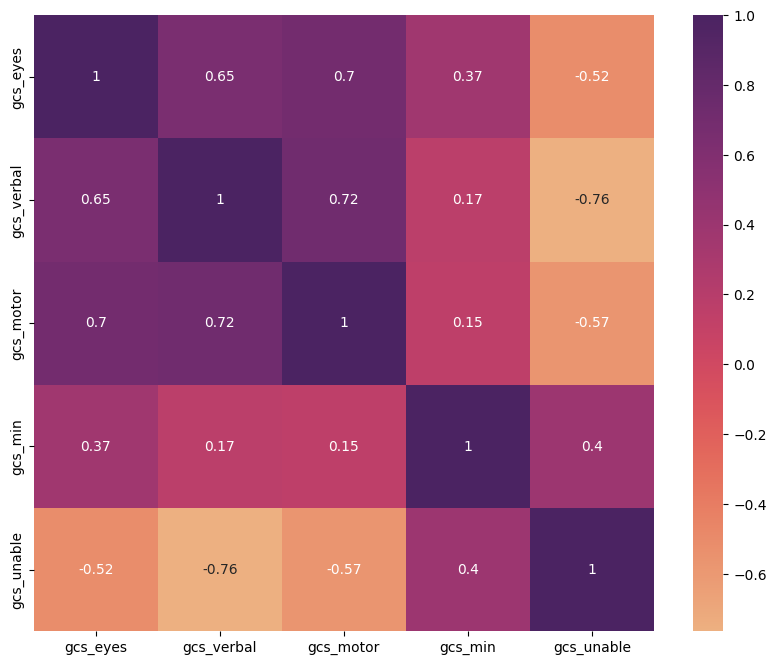

In [28]:
# calculate the Spearman's Rank correlation for ordinal independent variables
spearman_corr = Xtrain_imputed[ordinalFeats].corr(method='spearman')

# view the correlation in heatmap
plt.figure(figsize=(10,8))
sns.heatmap(spearman_corr, annot=True, cmap='flare', cbar=True)
plt.show()

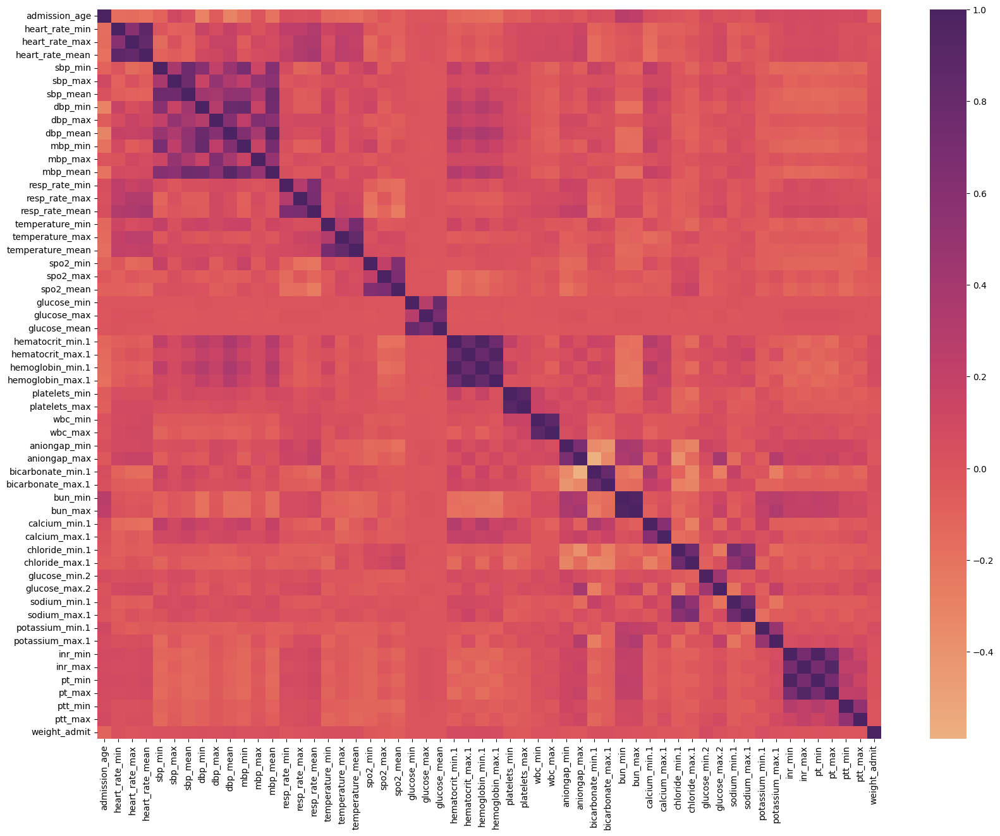

In [29]:
# calculate the Pearson's correlation for numerical independent variables
pearson_corr = Xtrain_imputed[continuousFeats].corr(method='pearson')

# view the correlation in heatmap
plt.figure(figsize=(20,15))
sns.heatmap(pearson_corr, cmap='flare', cbar=True)
plt.show()

In [30]:
# extracting the pairs of highly correlated continuous numerical features
correlated_features = []
for i in range(len(pearson_corr.columns)):
    for j in range(i):
        if abs(pearson_corr.iloc[i, j]) > 0.8:
            feat_pairs = (pearson_corr.columns[i], pearson_corr.columns[j])
            correlated_features.append(feat_pairs)
            
print('There are %d features pairs highly correlated to each other (Person\'s correlation coefficient > 0.8).'%len(correlated_features))
print('These feature pairs are:\n')
for pair in correlated_features:
    print(pair)

There are 15 features pairs highly correlated to each other (Person's correlation coefficient > 0.8).
These feature pairs are:

('heart_rate_mean', 'heart_rate_min')
('heart_rate_mean', 'heart_rate_max')
('mbp_min', 'dbp_min')
('mbp_mean', 'dbp_mean')
('temperature_mean', 'temperature_max')
('hematocrit_max.1', 'hematocrit_min.1')
('hemoglobin_min.1', 'hematocrit_min.1')
('hemoglobin_max.1', 'hematocrit_max.1')
('hemoglobin_max.1', 'hemoglobin_min.1')
('platelets_max', 'platelets_min')
('wbc_max', 'wbc_min')
('bicarbonate_max.1', 'bicarbonate_min.1')
('bun_max', 'bun_min')
('pt_min', 'inr_min')
('pt_max', 'inr_max')


### 2.4 Variance Inflation Factor (VIF) Analysis

In [31]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# compute the VIF score for each numerical independent variable in normalized data
vif_score_norm = []

for i, col in enumerate(Xtrain_imputed[continuousFeats].columns):
    vif_norm = variance_inflation_factor(Xtrain_imputed[continuousFeats], i)
    vif_score_norm.append(vif_norm)
    
vifNorm = pd.Series(vif_score_norm, index = Xtrain_imputed[continuousFeats].columns).sort_values(ascending=True)


# compute the VIF score for each numerical independent variable in unnormalized data
Xtrain_imputed_unnorm = scaler.inverse_transform(Xtrain_imputed)
Xtrain_imputed_unnorm = pd.DataFrame(Xtrain_imputed_unnorm, columns=Xtrain_imputed.columns)

vif_score_unnorm = []

for i, col in enumerate(Xtrain_imputed_unnorm[continuousFeats].columns):
    vif_unnorm = variance_inflation_factor(Xtrain_imputed_unnorm[continuousFeats], i)
    vif_score_unnorm.append(vif_unnorm)
    
vifUnnorm = pd.Series(vif_score_unnorm, index = Xtrain_imputed_unnorm[continuousFeats].columns).sort_values(ascending=True)

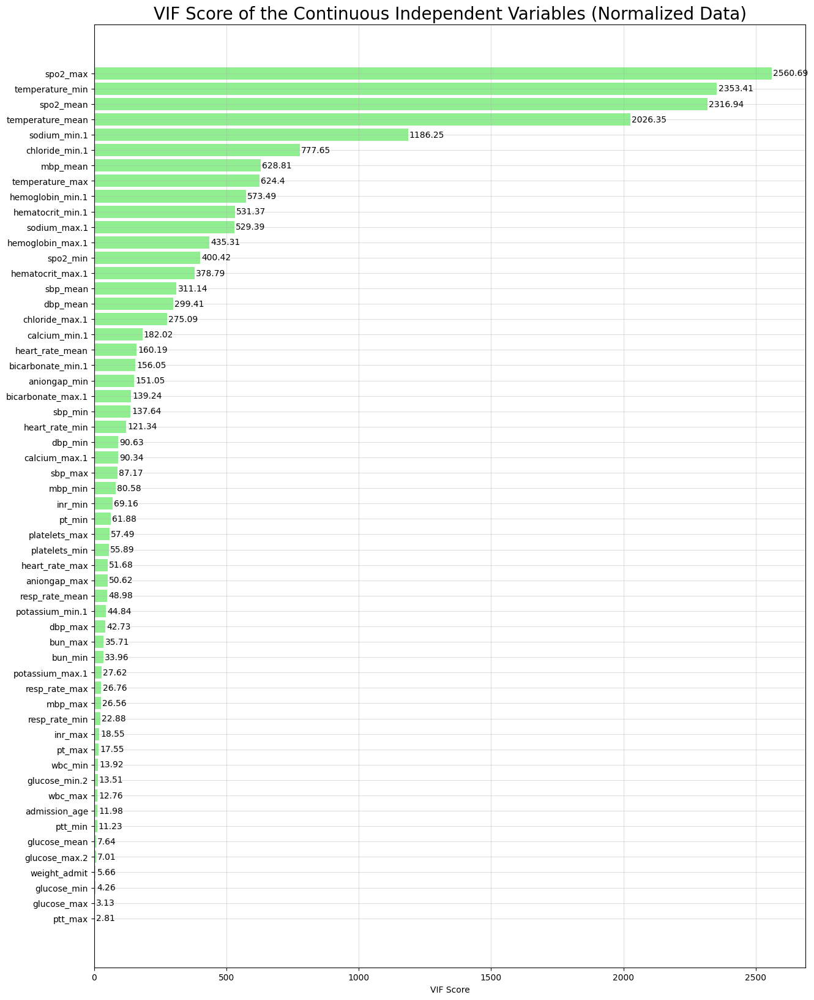

In [32]:
# visualize the VIF score of continuous independent variable (normalized dataset) in bar chart
plt.figure(figsize=(15,20))
plt.barh(y=vifNorm.index, width=vifNorm.values, color='lightgreen')
plt.xlabel('VIF Score')

for index, values in enumerate(vifNorm):
    plt.text(values+5, index, str(round(values, 2)), va='center')

plt.grid(alpha=0.4)
plt.title('VIF Score of the Continuous Independent Variables (Normalized Data)', fontsize=20)
plt.show()

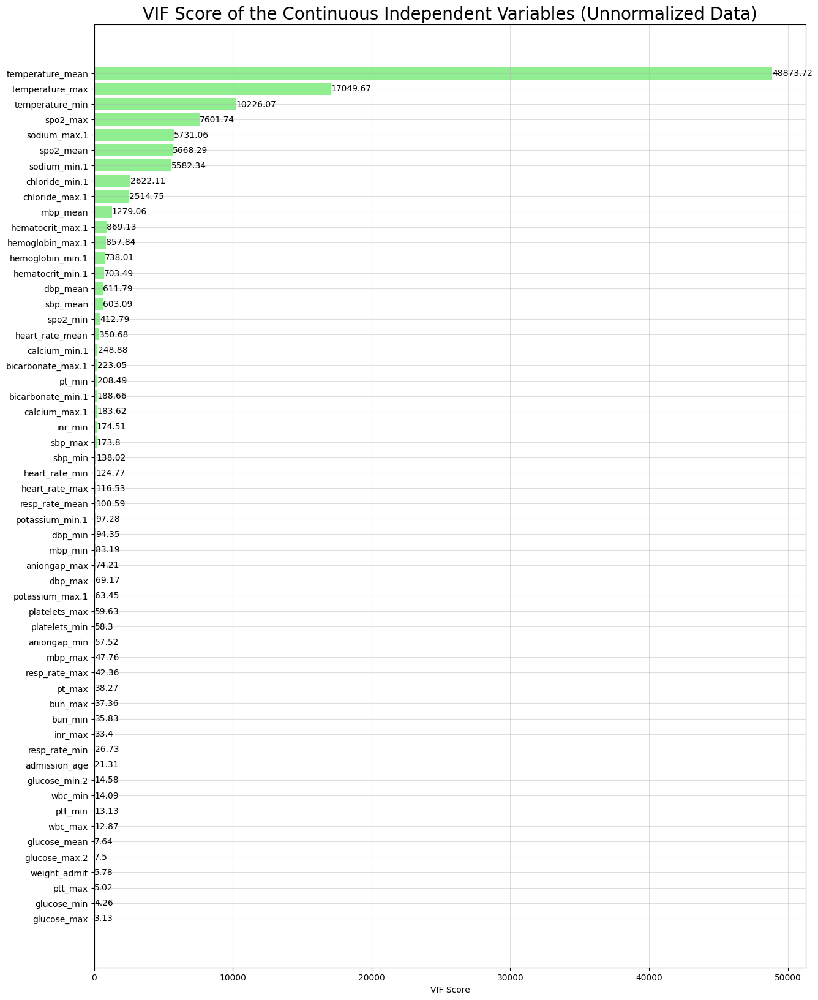

In [33]:
# visualize the VIF score of continuous independent variable (unnormalized dataset) in bar chart
plt.figure(figsize=(15,20))
plt.barh(y=vifUnnorm.index, width=vifUnnorm.values, color='lightgreen')
plt.xlabel('VIF Score')

for index, values in enumerate(vifUnnorm):
    plt.text(values+5, index, str(round(values, 2)), va='center')

plt.grid(alpha=0.4)
plt.title('VIF Score of the Continuous Independent Variables (Unnormalized Data)', fontsize=20)
plt.show()

### 2.5 Variances Analysis

Low variance features are characterized by minimal variation across all observations in the dataset. They may not provide meaningful discriminatory information for the predictive models but rather increase the model complexity. In this project, the variance of each numerical feature within the normalized dataset was computed. This process enabled us to identify features with extremely low variances in the dataset. These features exhibit nearly constant values across all observations, suggesting limited variability and potentially low predictive power.
We observed that several features exhibit extremely low variance in the dataset. These features may be suitable candidates for exclusion from the downstream ML tasks. Features with less than 5% of the maximum variance were defined as low-variance variables in this study. 16 low-variance variables were identified. Notably, variables such as 'glucose_min', 'weight_admit', and 'glucose_mean' have variances close to zero. After excluding the low variance variables, 53 variables remained in the dataset for subsequent analysis. 

C:\Users\65814\AppData\Local\Temp\ipykernel_28736\4104624040.py:5: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



There are 16 variables have variance less than the variance threshold (5% of the maximum variance in the dataset).
These features are: weight_admit, glucose_min, glucose_mean, calcium_max.1, wbc_max, wbc_min, inr_min, spo2_max, glucose_max, temperature_min, inr_max, platelets_max, spo2_mean, pt_min, glucose_max.2, calcium_min.1 



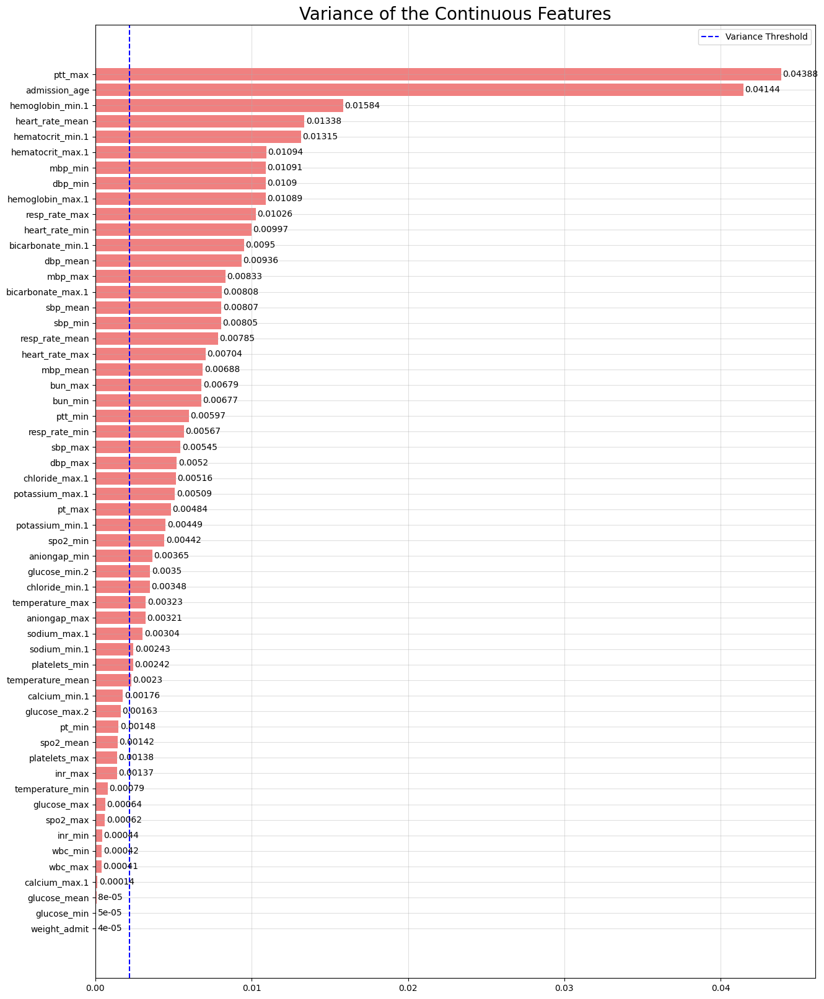

In [34]:
# compute the variance of continuous features 
contFeats_var = Xtrain_imputed[continuousFeats].var().sort_values(ascending=True)

# set variance threshold (5% of the maximum variance in the dataset)
varThreshold = round(contFeats_var[-1] * 0.05, 4)

# get a list of the feature has variance less than variance threshold
lowVarfeats = contFeats_var[contFeats_var.values < varThreshold]
lowVarfeats = list(lowVarfeats.index)

print('There are {} variables have variance less than the variance threshold (5% of the maximum variance in the dataset).'.format(len(lowVarfeats)))
print('These features are:',', '.join(lowVarfeats),'\n')

# visualize the variance of continuous features in bar chart
plt.figure(figsize=(15,20))
plt.barh(y=contFeats_var.index, width=contFeats_var.values, color='lightcoral')

for index, values in enumerate(contFeats_var):
    plt.text(values+0.0001, index, str(round(values, 5)), va='center')

# add a line for variance threshold 
plt.axvline(x=varThreshold, color='blue', linestyle='--', label='Variance Threshold')
plt.grid(alpha=0.4)
plt.title('Variance of the Continuous Features', fontsize=20)
plt.legend()
plt.show()

In [35]:
# remove the features with very low variances from the feature matrix and training and test datasets
Xtrain_imputed.drop(columns=lowVarfeats, axis=1, inplace=True)
Xtest_imputed.drop(columns=lowVarfeats, axis=1, inplace=True)

# check the dimension of the training and test feature matrix after removing low variance variables
print('Dimension of training feature matrix:', Xtrain_imputed.shape)
print('Dimension of test feature matrix:', Xtest_imputed.shape)

Dimension of training feature matrix: (40736, 53)
Dimension of test feature matrix: (10184, 53)


## Part 3 | Modelling

### 3.1 Sampling a Training Subset

In [36]:
# sampling 5000 records from training dataset 
# this subset of data is used for modelling for feature selection
# a balance subset (1:1) positive and negative data will be sampled
# run the following to do sampling for equal cases of positive and negative
df = Xtrain_imputed.copy()
df['Target'] = ytrain

neg = df[df['Target']==0]
neg.sample(2500)

pos = df[df['Target']==1]
pos.sample(2500)

combined = pd.concat([neg.sample(2500),pos.sample(2500)], axis=0)

X = combined.drop(columns=['Target'], axis=1)
y = combined['Target']

### 3.2 Base Model without Feature Selection

In [37]:
from sklearn.linear_model import LogisticRegression
# fit a model with the selected features and perform hyperparameter tuning
# define the base model for tuning
logreg_base = LogisticRegression(penalty=None,              # no penalty added 
                                 class_weight='balanced',   
                                 solver='saga', 
                                 max_iter=100000, 
                                 random_state=122)

logreg_base.fit(Xtrain_imputed, ytrain)           

LogisticRegression(class_weight='balanced', max_iter=100000, penalty=None,
                   random_state=122, solver='saga')

Classification report for training data:
              precision    recall  f1-score   support

      No AKI       0.49      0.68      0.57     13488
         AKI       0.81      0.65      0.72     27248

    accuracy                           0.66     40736
   macro avg       0.65      0.67      0.65     40736
weighted avg       0.70      0.66      0.67     40736

Classification report for test data:
              precision    recall  f1-score   support

      No AKI       0.50      0.69      0.58      3372
         AKI       0.81      0.66      0.73      6812

    accuracy                           0.67     10184
   macro avg       0.66      0.67      0.65     10184
weighted avg       0.71      0.67      0.68     10184



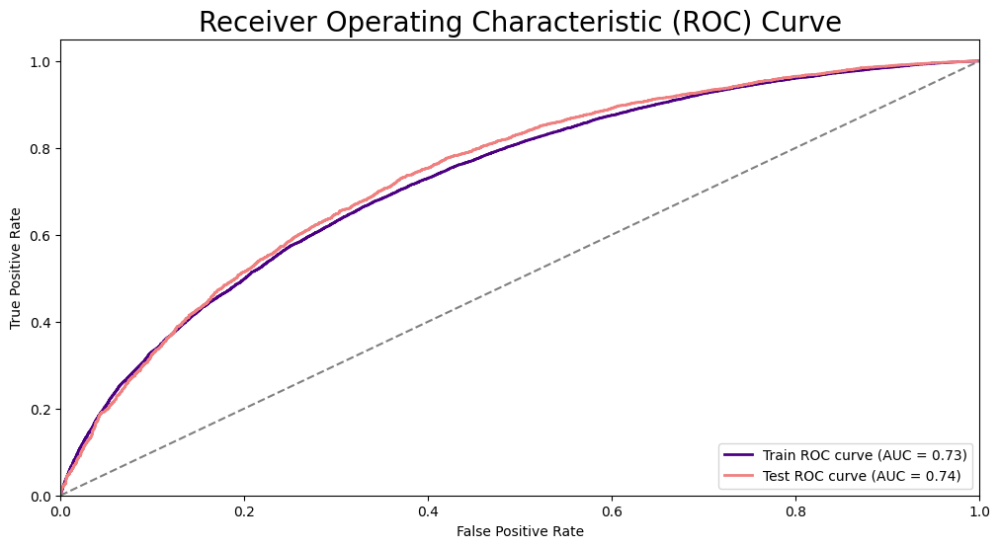

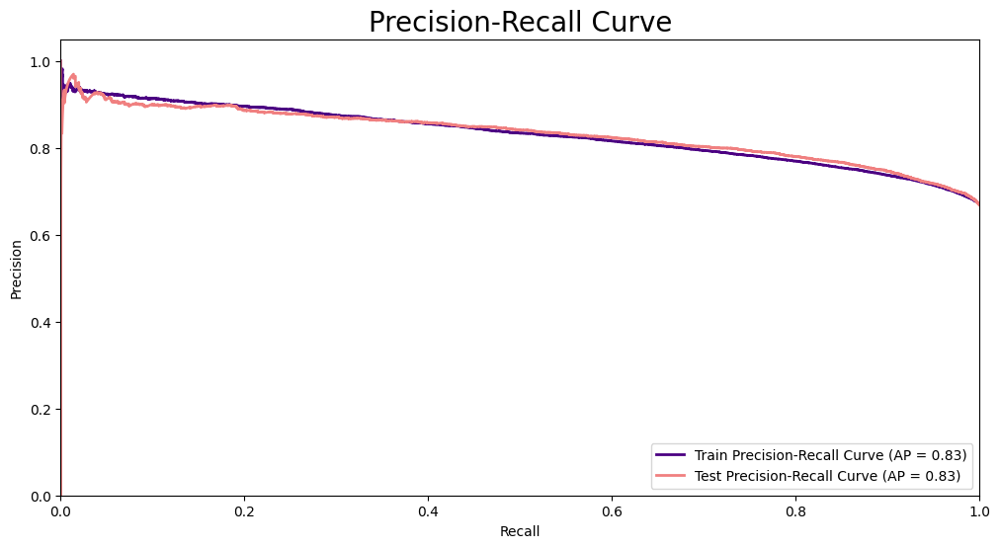

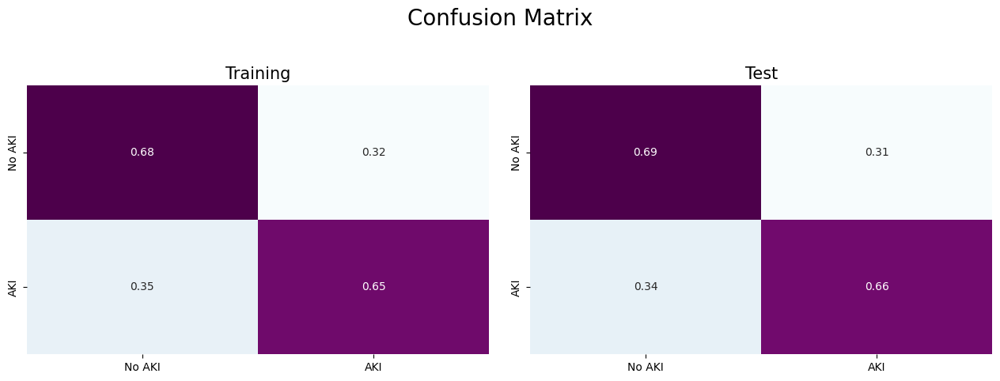

In [38]:
# evaluate the model performance
helper.modelPerformance(logreg_base, Xtrain_imputed, Xtest_imputed, ytrain, ytest)

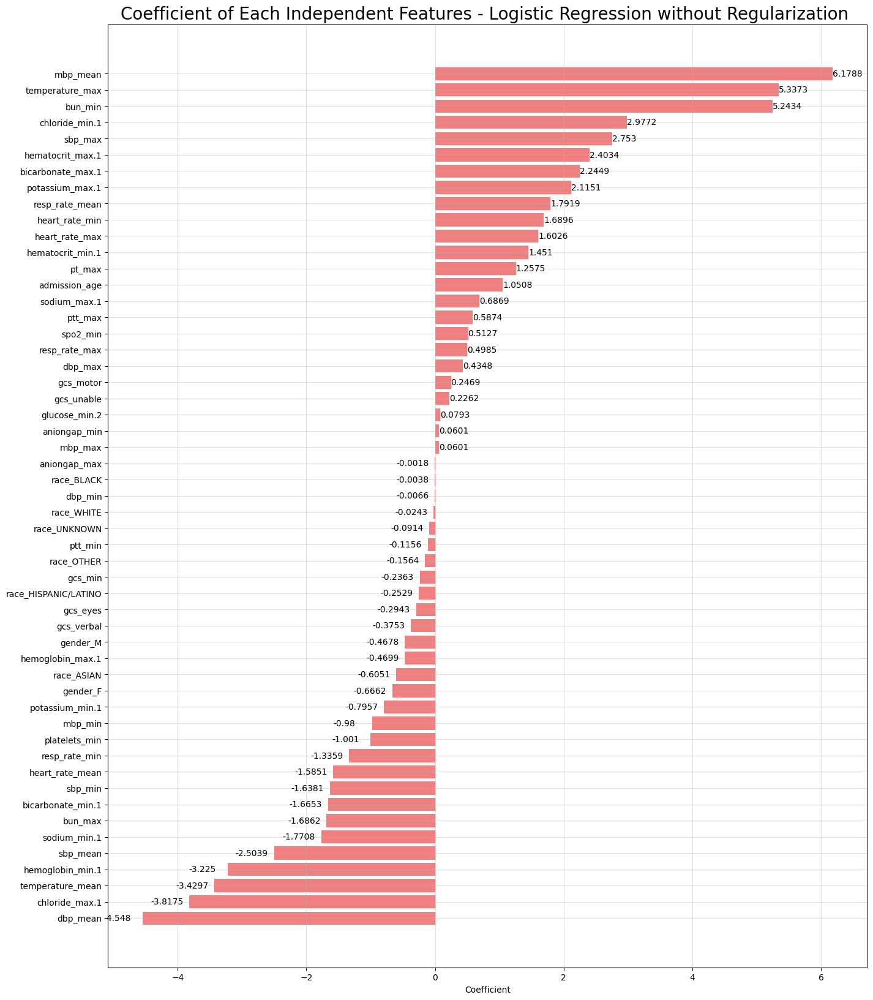

In [39]:
base_coef = logreg_base.coef_
logreg_base_coef = pd.Series(base_coef.flatten(), index=logreg_base.feature_names_in_).sort_values(ascending=True)


plt.figure(figsize=(16,20))
plt.barh(y=logreg_base_coef.index, width=logreg_base_coef.values, color='lightcoral')
plt.xlabel('Coefficient')

for index, value in enumerate(logreg_base_coef):
    x = value if value > 0 else value - 0.6  # Adjust the offset as needed
    plt.text(x, index, str(round(value,4)), va='center')


plt.grid(alpha=0.4)
plt.title('Coefficient of Each Independent Features - Logistic Regression without Regularization ', fontsize=20)
plt.show()

In [40]:
# performance summary by key metrics 
base_logreg = helper.eval_metrics(logreg_base, Xtest_imputed, ytest, 'LogisticRegression')

### 3.3 Feature Selection Method 1 |  Filter Method

Filter methods use feature ranking as the primary evaluation metric for feature selection. Features are ranked based on their scores derived from various statistical tests measuring their correlation with the class label. The selected feature set is more generalized and not specifically tailored to any classifier. One of the key advantages of filter methods over other feature selection techniques is their relatively lower computational demand (Pudjihartono et al., 2022).

In this study, we computed the mutual information between each independent variable and the target variable. Mutual information is mainly based on the concept of information entropy, which is a measure of uncertainty of the random variables. Instead of calculating Pearson’s or Spearman’s correlation, mutual information was utilized as it could capture any relationship between the variables, including both linear and non-linear relationshi (Cheng et al., 2022)9.To implement this, we first calculated the mutual information between each independent variable with the dependent variable using Scikit-Learn library. The variables were subsequently ranked according to their mutual information score. The mutual information between each independent variable and the dependent variable are comprehensively outlined in the following section. We observed that some features have very low mutual information with the dependent variable, for instance, variables 'race_UNKNOWN', 'heart_rate_max', 'race_OTHER', 'race_HISPANIC/LATINO', 'race_BLACK', 'race_ASIAN' have zero value of mutual information. This suggests that these features might not be very informative for predicting the target variable.

We experimented with different thresholds: 10%, 20%, 30%, 40%, and 50% of the maximum mutual information score, in order to determine the minimum mutual information value needed to filter out less informative independent variables. We then iteratively fitted a classifier algorithm with features selected above each threshold. To find the feature set with the capabilities optimally in distinguish between 2 classes, the AUROC score was used to evaluate the performance. In the case of logistic regression, we observed a decrease in the AUC score as the exclusion threshold increased, declining from 0.736 to 0.710. 10% threshold was identified for selecting the best feature set that optimally differentiates between AKI and No AKI classes. A total of 41 features were selected at this threshold. 

Subsequently, we trained a logistic regression model with the selected features by using all available training data. Hyperparameter tuning was applied, involving adjustments to the inverse of regularization strength, C parameter. The tuned model achieved an AUC score of 0.74 on the test dataset. In addition, to evaluate how well the model is detecting the AKI cases, a precision-recall curve was plotted, and average precision (AP) was computed. The logistic regression achieved an AP of 0.83 on the test dataset
.
The same procedure for determining the mutual information threshold was repeated with a decision tree classifier. Intriguingly, only minimal changes were observed in the AUC score across varying exclusion thresholds (ranging from 0.742 to 0.735). 10% and 20% exclusion thresholds yielding similar AUC score, thus we opted for 20% and total of 32 features were selected. Similarly, we utilized all available training data along with the selected features, subsequently conducting hyperparameter tuning to optimize the decision tree model. This involves adjustment of the maximum depth of the tree (ranging from 5 to 15). The refined model achieved an AUC score of 0.69 and an AP of 0.80 on the test dataset
. 
Given that decision tree is the foundation component of other tree-based learning algorithms, the same feature subset derived from decision tree was used to train models employing the extra tree classifier, random forest classifier, gradient boosting classifier and adaptive boosting classifier. The performance of these modewas summarized and the ROC and Precision-Recall Curve were illustratin the following section.





Reference:
- Pudjihartono N, Fadason T, Kempa-Liehr AW, O’Sullivan JM. A Review of Feature Selection Methods for Machine Learning-Based Disease Risk Prediction. Frontiers in Bioinformatics. 2022;2. doi:10.3389/fbinf.2022.927312- 	Cheng J, Sun J, Yao K, Xu M, Cao Y. A variable selection method based on mutual information and variance inflation factor. Spectrochim Acta A Mol Biomol Spectrosc. 2022;268:120652. doi:10.1016/j.saa.2021.10652
 

#### 3.3.1 Information Gain between Independent Variable & Target

In [41]:
from sklearn.feature_selection import mutual_info_classif

# calculate the mutual information score for each independent variable with dependent variable
info = mutual_info_classif(Xtrain_imputed, ytrain, random_state=122)

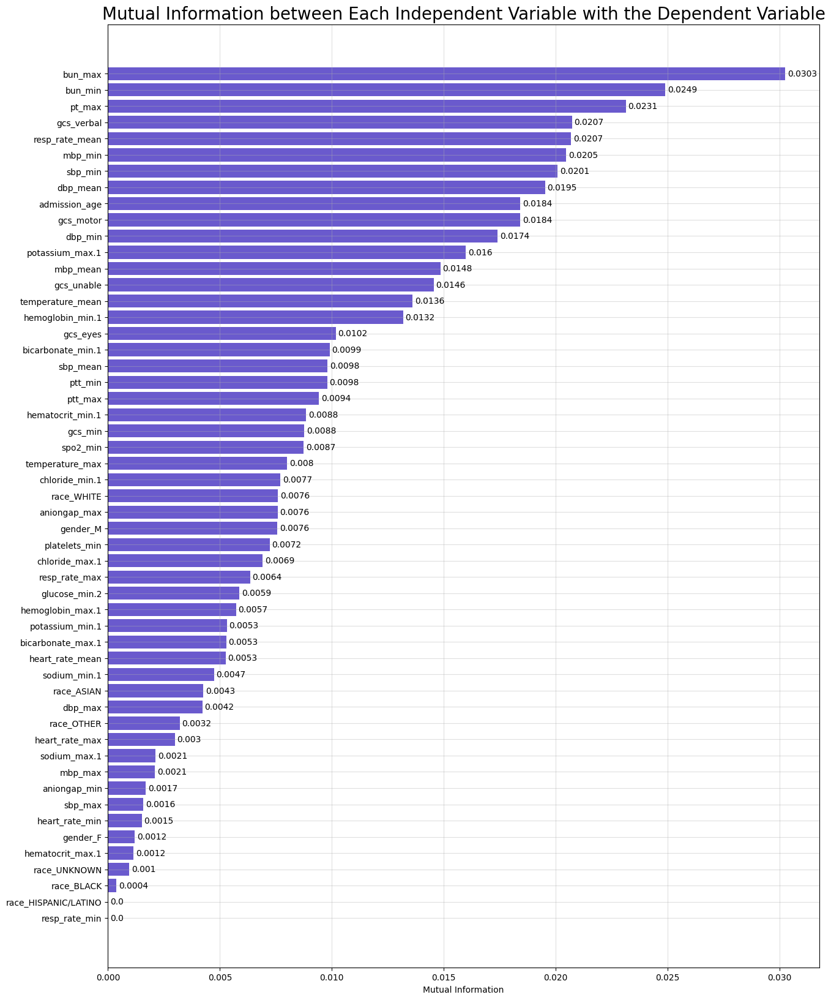

In [42]:
mutualInfo = pd.Series(info, index=Xtrain_imputed.columns).sort_values(ascending=True)

# visualize the mutual information of each independent variable with the dependent variable 
plt.figure(figsize=(15,20))
plt.barh(y=mutualInfo.index, width=mutualInfo.values, color='slateblue')
plt.xlabel('Mutual Information')

for index, values in enumerate(mutualInfo):
    plt.text(values+0.0001, index, str(round(values,4)), va='center')

plt.grid(alpha=0.4)
plt.title('Mutual Information between Each Independent Variable with the Dependent Variable', fontsize=20)
plt.show()

##### Classifier 1 | Logistic Regression

In [43]:
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression

# define a threshold to investigated
thresholds = np.arange(start=0.1,stop=0.6,step=0.1)

# define a base estimator to fit with the feature selected from forward feature selection
base_estimator = LogisticRegression(max_iter=100000, n_jobs=-1, random_state=122)

scores = []
feature_set = []

for threshold in thresholds:
    selected_threshold = mutualInfo.values.max()*threshold
    featureSet = mutualInfo[mutualInfo.values > selected_threshold].index
    feature_set.append(featureSet)
    base_estimator.fit(X[featureSet],y)
    ypred_proba = base_estimator.predict_proba(X[featureSet])
    auroc = roc_auc_score(y,ypred_proba[:,1])
    scores.append(auroc)

,Filter Threshold,Selected Features,AUROC Scores
0,0.1,"Index(['race_OTHER', 'dbp_max', 'race_ASIAN', ...",0.720711
1,0.2,"Index(['resp_rate_max', 'chloride_max.1', 'pla...",0.714865
2,0.3,"Index(['ptt_max', 'ptt_min', 'sbp_mean', 'bica...",0.707149
3,0.4,"Index(['hemoglobin_min.1', 'temperature_mean',...",0.705463
4,0.5,"Index(['potassium_max.1', 'dbp_min', 'gcs_moto...",0.701939


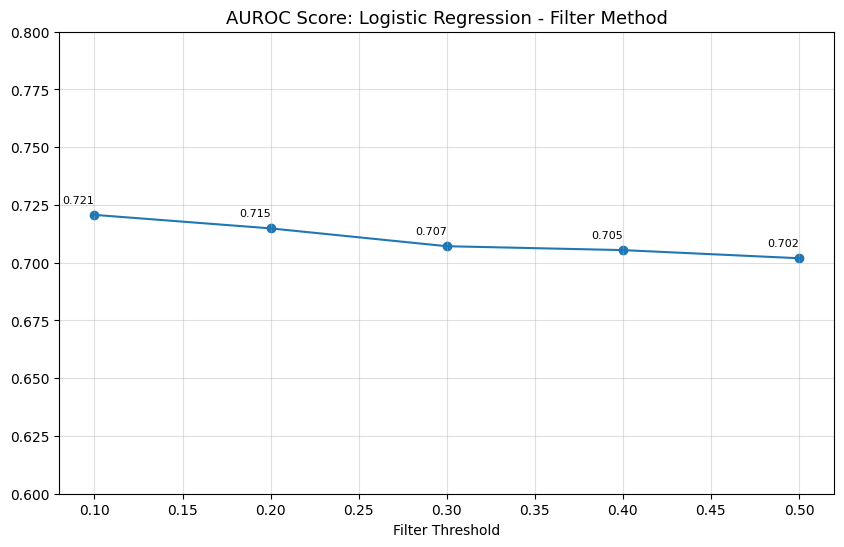

In [44]:
# visualize the AUROC score for various number of features selected
univariate_score_lr = pd.DataFrame([thresholds,feature_set,scores]).T
univariate_score_lr.columns = ['Filter Threshold', 'Selected Features', 'AUROC Scores']
display(univariate_score_lr)
print()

# plot a line chart
plt.figure(figsize=(10,6))
plt.plot(univariate_score_lr['Filter Threshold'], univariate_score_lr['AUROC Scores'])
plt.xlabel('Filter Threshold')
plt.grid(alpha=0.4)
plt.ylim(0.6,0.8)
plt.title('AUROC Score: Logistic Regression - Filter Method',fontsize=13)

# overlay points
plt.scatter(univariate_score_lr['Filter Threshold'], univariate_score_lr['AUROC Scores'])

# annotate points with values
for i, txt in enumerate(univariate_score_lr['AUROC Scores']):
    plt.text(univariate_score_lr['Filter Threshold'][i], txt+0.005, f"{txt:.3f}", ha='right', fontsize=8, color='black')

plt.show()

In [45]:
# use features selected at 10% threshold for the subsequent modelling
filterFeats_lr = univariate_score_lr['Selected Features'][0]
print('Number of feature selected at 10% Threshold Maximum Mutual Information Score:', len(filterFeats_lr))
print(filterFeats_lr)

Number of feature selected at 10% Threshold Maximum Mutual Information Score: 41
Index(['race_OTHER', 'dbp_max', 'race_ASIAN', 'sodium_min.1',
       'heart_rate_mean', 'bicarbonate_max.1', 'potassium_min.1',
       'hemoglobin_max.1', 'glucose_min.2', 'resp_rate_max', 'chloride_max.1',
       'platelets_min', 'gender_M', 'aniongap_max', 'race_WHITE',
       'chloride_min.1', 'temperature_max', 'spo2_min', 'gcs_min',
       'hematocrit_min.1', 'ptt_max', 'ptt_min', 'sbp_mean',
       'bicarbonate_min.1', 'gcs_eyes', 'hemoglobin_min.1', 'temperature_mean',
       'gcs_unable', 'mbp_mean', 'potassium_max.1', 'dbp_min', 'gcs_motor',
       'admission_age', 'dbp_mean', 'sbp_min', 'mbp_min', 'resp_rate_mean',
       'gcs_verbal', 'pt_max', 'bun_min', 'bun_max'],
      dtype='object')


Best Hyperparameters from Grid Search :  {'C': 11.999999999999996}
Best Weighted F1 Score:  0.7247286877790959

Classification report for training data:
              precision    recall  f1-score   support

      No AKI       0.49      0.68      0.57     13488
         AKI       0.80      0.65      0.72     27248

    accuracy                           0.66     40736
   macro avg       0.65      0.66      0.64     40736
weighted avg       0.70      0.66      0.67     40736

Classification report for test data:
              precision    recall  f1-score   support

      No AKI       0.50      0.69      0.58      3372
         AKI       0.81      0.66      0.73      6812

    accuracy                           0.67     10184
   macro avg       0.65      0.67      0.65     10184
weighted avg       0.71      0.67      0.68     10184



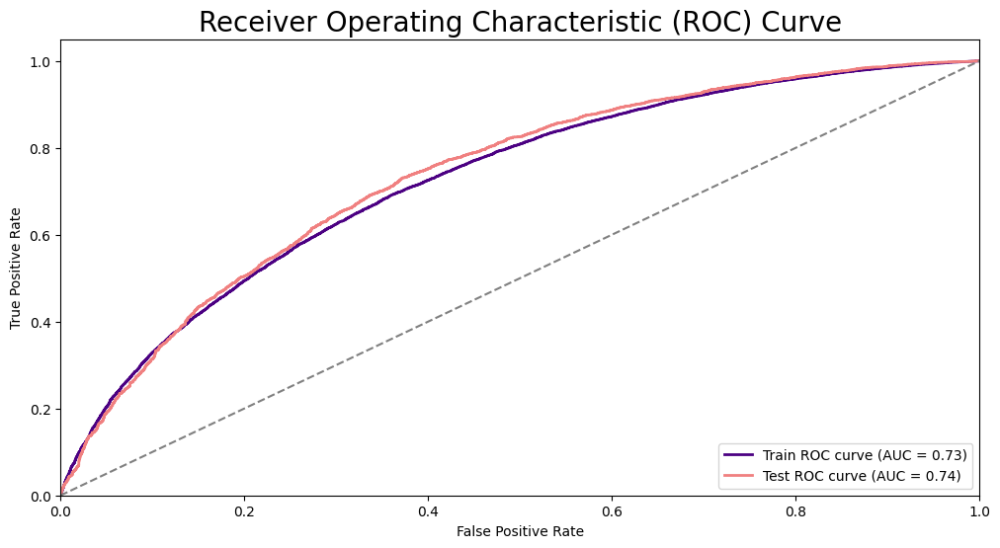

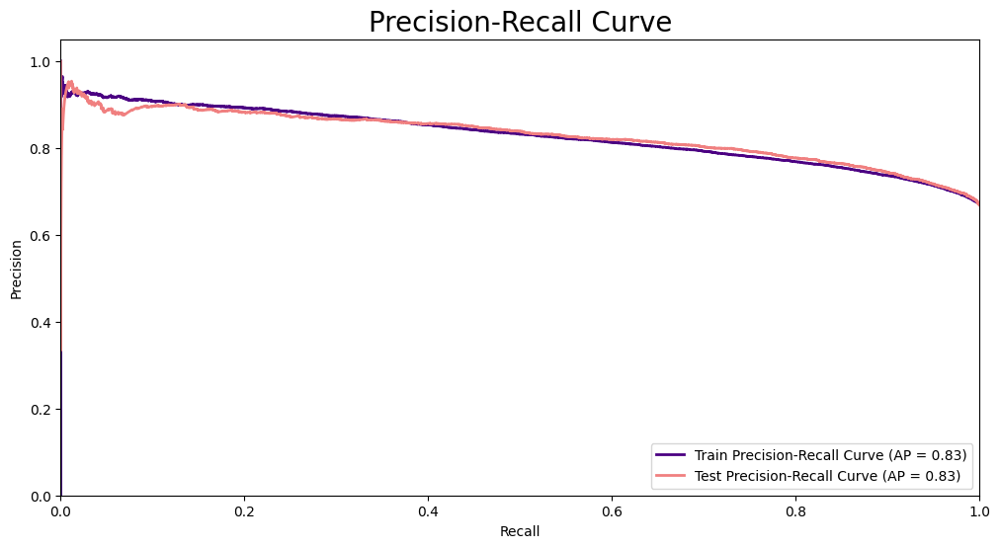

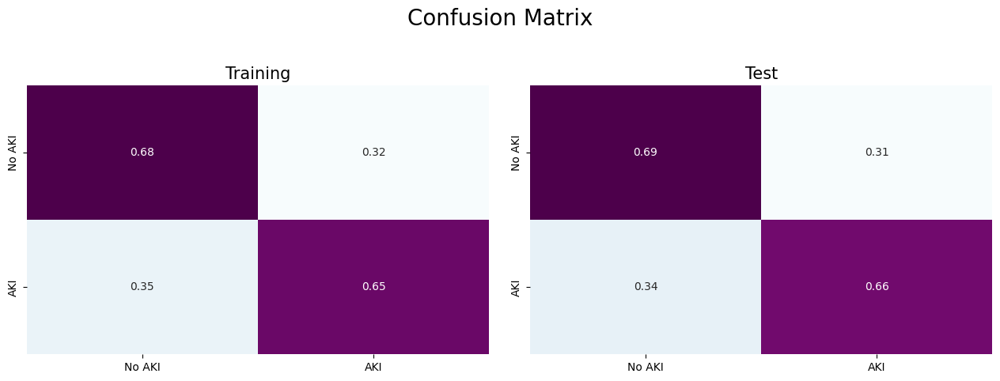

In [46]:
# fit a model with the selected features and perform hyperparameter tuning
# define the base model for tuning
logreg = LogisticRegression(penalty='l2', random_state=122, class_weight='balanced', solver='saga', max_iter=100000)

# define the hyperparameter grid
param_grid = {
    'C': np.arange(start=11, stop=12.1, step=0.1)
}

# hyperparameter tuning via grid search
logreg_filter = helper.hyperparameterTuning(logreg, param_grid, filterFeats_lr, Xtrain_imputed, ytrain)

# model performance
helper.modelPerformance(logreg_filter, Xtrain_imputed[filterFeats_lr], Xtest_imputed[filterFeats_lr], ytrain, ytest)

In [47]:
# performance summary by key metrics 
lr_filter = helper.eval_metrics(logreg_filter, Xtest_imputed[filterFeats_lr], ytest, 'LogisticRegression-FilterMethod')

##### Classifier 2 | Decision Tree

In [48]:
from sklearn.tree import DecisionTreeClassifier

# define a threshold to investigated
thresholds = np.arange(start=0.1,stop=0.6,step=0.1)

# define a base estimator to fit with feature selected at different threshold
base_estimator = DecisionTreeClassifier(max_depth=5, random_state=122)

scores = []
feature_set = []

# iteratively fit the base_estimator with features selected at different threshold and compute the AUC score
for threshold in thresholds:
    selected_threshold = mutualInfo.values.max()*threshold
    featureSet = mutualInfo[mutualInfo.values > selected_threshold].index
    feature_set.append(featureSet)
    base_estimator.fit(X[featureSet],y)
    ypred = base_estimator.predict_proba(X[featureSet])
    auroc = roc_auc_score(y,ypred[:, 1])
    scores.append(auroc)

,Filter Threshold,Selected Features,AUROC Scores
0,0.1,"Index(['race_OTHER', 'dbp_max', 'race_ASIAN', ...",0.736445
1,0.2,"Index(['resp_rate_max', 'chloride_max.1', 'pla...",0.735219
2,0.3,"Index(['ptt_max', 'ptt_min', 'sbp_mean', 'bica...",0.735596
3,0.4,"Index(['hemoglobin_min.1', 'temperature_mean',...",0.734366
4,0.5,"Index(['potassium_max.1', 'dbp_min', 'gcs_moto...",0.732146


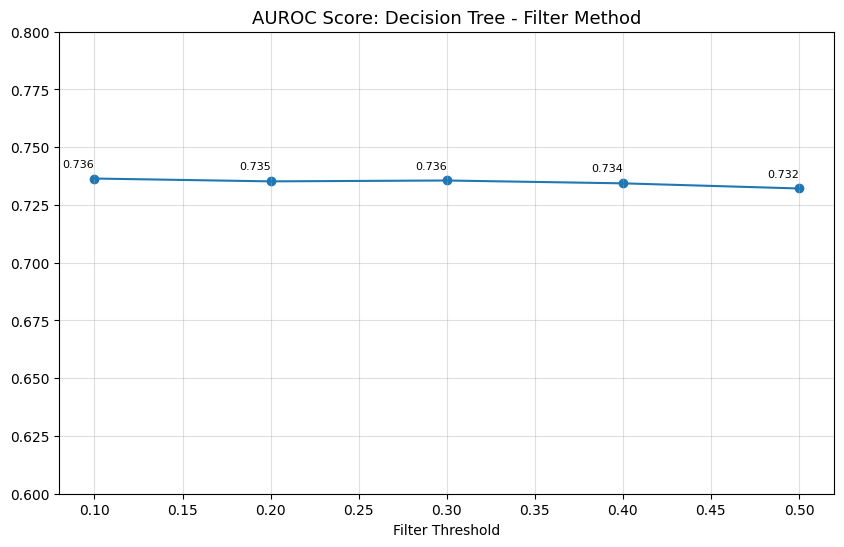

In [49]:
# visualize the AUROC score for various number of features selected
univariate_score_tree = pd.DataFrame([thresholds,feature_set,scores]).T
univariate_score_tree.columns = ['Filter Threshold', 'Selected Features', 'AUROC Scores']
display(univariate_score_tree)
print()

# plot a line chart
plt.figure(figsize=(10,6))
plt.plot(univariate_score_tree['Filter Threshold'], univariate_score_tree['AUROC Scores'])
plt.xlabel('Filter Threshold')
plt.grid(alpha=0.4)
plt.ylim(0.6,0.8)
plt.title('AUROC Score: Decision Tree - Filter Method',fontsize=13)

# overlay points
plt.scatter(univariate_score_tree['Filter Threshold'], univariate_score_tree['AUROC Scores'])

# annotate points with values
for i, txt in enumerate(univariate_score_tree['AUROC Scores']):
    plt.text(univariate_score_tree['Filter Threshold'][i], txt+0.005, f"{txt:.3f}", ha='right', fontsize=8, color='black')

plt.show()

In [50]:
# feature subset used for subsequent mdelling
filterFeats_tree = univariate_score_tree['Selected Features'][1]
print('Number of feature selected at 20% Threshold Maximum Mutual Information Score:', len(filterFeats_tree))
print(filterFeats_tree)

Number of feature selected at 20% Threshold Maximum Mutual Information Score: 32
Index(['resp_rate_max', 'chloride_max.1', 'platelets_min', 'gender_M',
       'aniongap_max', 'race_WHITE', 'chloride_min.1', 'temperature_max',
       'spo2_min', 'gcs_min', 'hematocrit_min.1', 'ptt_max', 'ptt_min',
       'sbp_mean', 'bicarbonate_min.1', 'gcs_eyes', 'hemoglobin_min.1',
       'temperature_mean', 'gcs_unable', 'mbp_mean', 'potassium_max.1',
       'dbp_min', 'gcs_motor', 'admission_age', 'dbp_mean', 'sbp_min',
       'mbp_min', 'resp_rate_mean', 'gcs_verbal', 'pt_max', 'bun_min',
       'bun_max'],
      dtype='object')


Best Hyperparameters from Grid Search :  {'max_depth': 5}
Best Weighted F1 Score:  0.6966906087927509

Classification report for training data:
              precision    recall  f1-score   support

      No AKI       0.50      0.63      0.55     13488
         AKI       0.79      0.68      0.73     27248

    accuracy                           0.67     40736
   macro avg       0.64      0.66      0.64     40736
weighted avg       0.69      0.67      0.67     40736

Classification report for test data:
              precision    recall  f1-score   support

      No AKI       0.48      0.62      0.54      3372
         AKI       0.78      0.67      0.72      6812

    accuracy                           0.65     10184
   macro avg       0.63      0.64      0.63     10184
weighted avg       0.68      0.65      0.66     10184



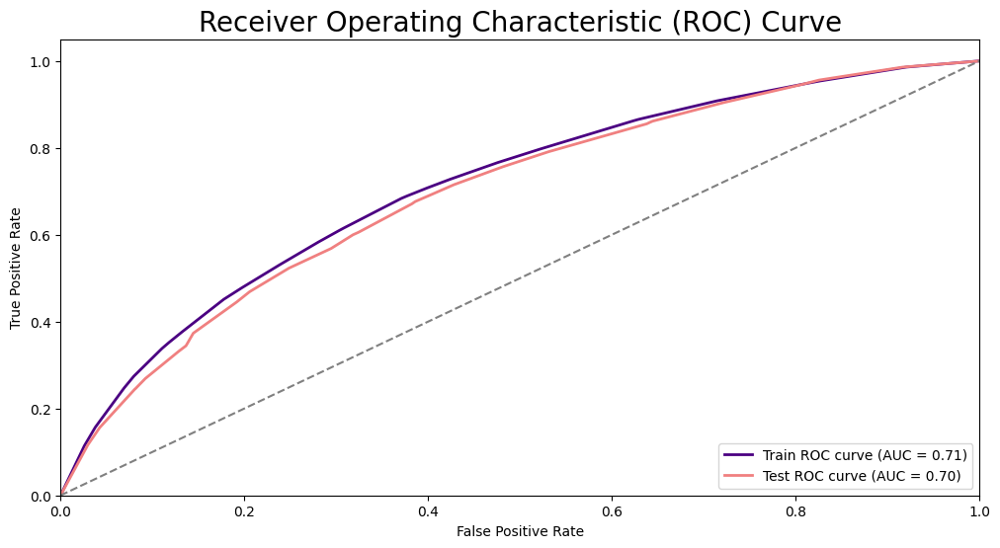

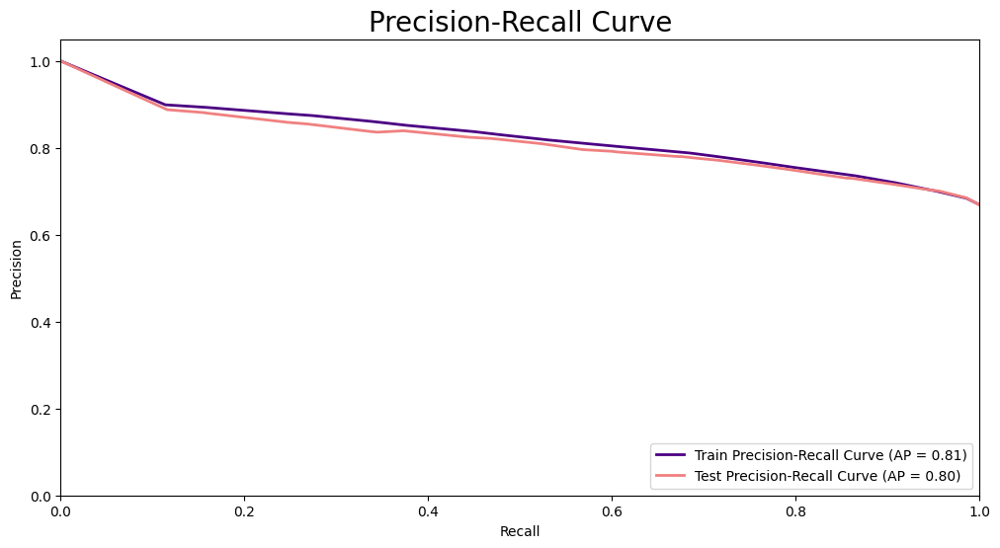

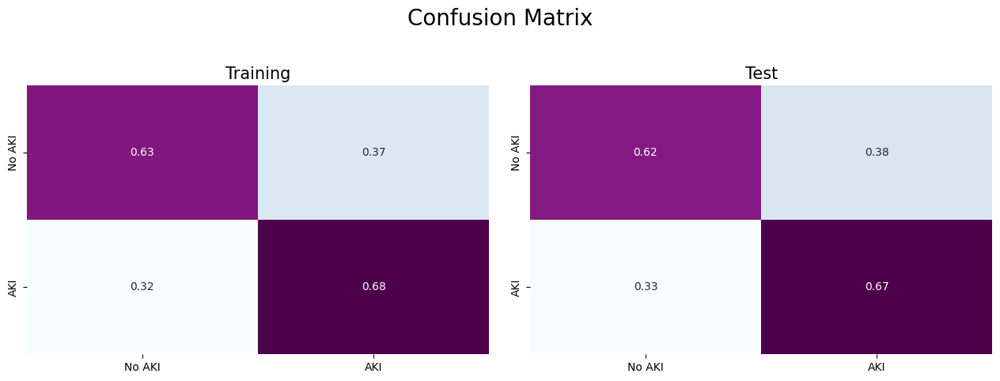

In [51]:
# fit a model with the selected features and perform hyperparameter tuning
# define the base model for tuning
tree = DecisionTreeClassifier(class_weight='balanced',random_state=122)

# define the hyperparameter grid
param_grid = {
    'max_depth': [5,10,15]
}

# hyperparameter tuning via grid search
tree_filter = helper.hyperparameterTuning(tree, param_grid, filterFeats_tree, Xtrain_imputed, ytrain)

# model performance
helper.modelPerformance(tree_filter, Xtrain_imputed[filterFeats_tree], Xtest_imputed[filterFeats_tree], ytrain, ytest)

In [52]:
# performance summary by key metrics 
dtree_filter = helper.eval_metrics(tree_filter, Xtest_imputed[filterFeats_tree], ytest, 'DecisionTree-FilterMethod')

##### Classifier 3 | Extra Trees

Classification report for training data:
              precision    recall  f1-score   support

      No AKI       0.51      0.72      0.60     13488
         AKI       0.82      0.66      0.73     27248

    accuracy                           0.68     40736
   macro avg       0.67      0.69      0.66     40736
weighted avg       0.72      0.68      0.69     40736

Classification report for test data:
              precision    recall  f1-score   support

      No AKI       0.49      0.68      0.57      3372
         AKI       0.80      0.65      0.71      6812

    accuracy                           0.66     10184
   macro avg       0.64      0.66      0.64     10184
weighted avg       0.70      0.66      0.67     10184



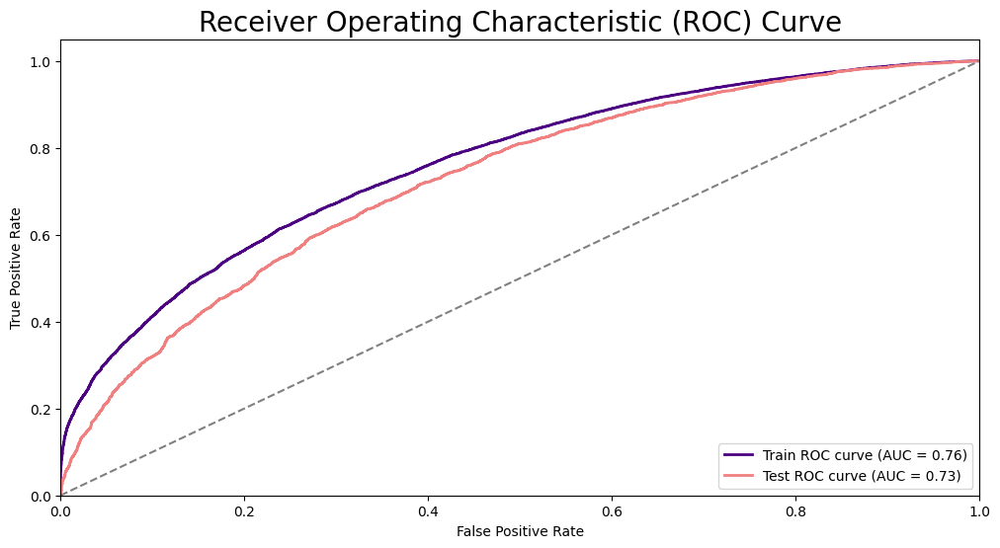

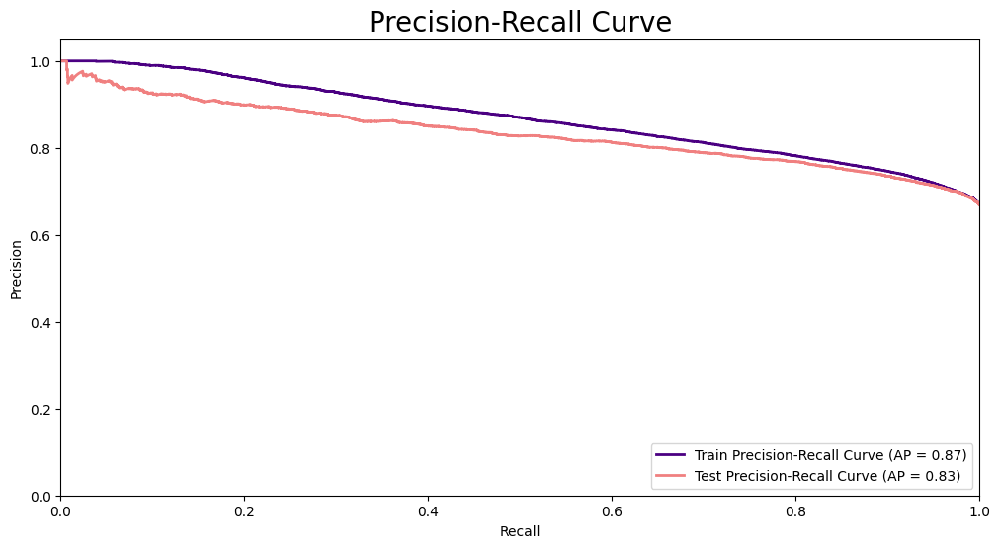

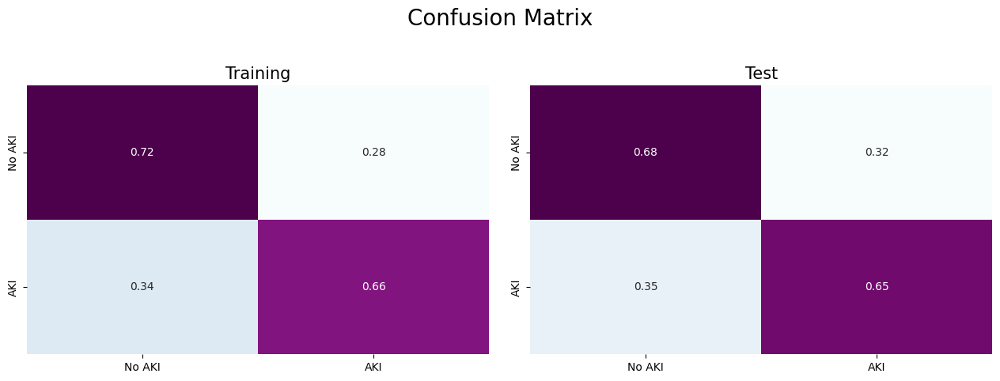

In [53]:
from sklearn.ensemble import ExtraTreesClassifier

# define the etc model
etc_filter = ExtraTreesClassifier(max_depth=10, class_weight='balanced', n_jobs=-1, random_state=122)
etc_filter.fit(Xtrain_imputed[filterFeats_tree], ytrain)

helper.modelPerformance(etc_filter, Xtrain_imputed[filterFeats_tree], Xtest_imputed[filterFeats_tree], ytrain, ytest)

In [54]:
# performance summary by key metrics 
extratree_filter = helper.eval_metrics(etc_filter, Xtest_imputed[filterFeats_tree], ytest, 'ExtraTree-FilterMethod')

##### Classifier 4 | Random Forest

Classification report for training data:
              precision    recall  f1-score   support

      No AKI       0.62      0.75      0.68     13488
         AKI       0.86      0.77      0.81     27248

    accuracy                           0.76     40736
   macro avg       0.74      0.76      0.75     40736
weighted avg       0.78      0.76      0.77     40736

Classification report for test data:
              precision    recall  f1-score   support

      No AKI       0.52      0.62      0.57      3372
         AKI       0.79      0.72      0.76      6812

    accuracy                           0.69     10184
   macro avg       0.66      0.67      0.66     10184
weighted avg       0.70      0.69      0.69     10184



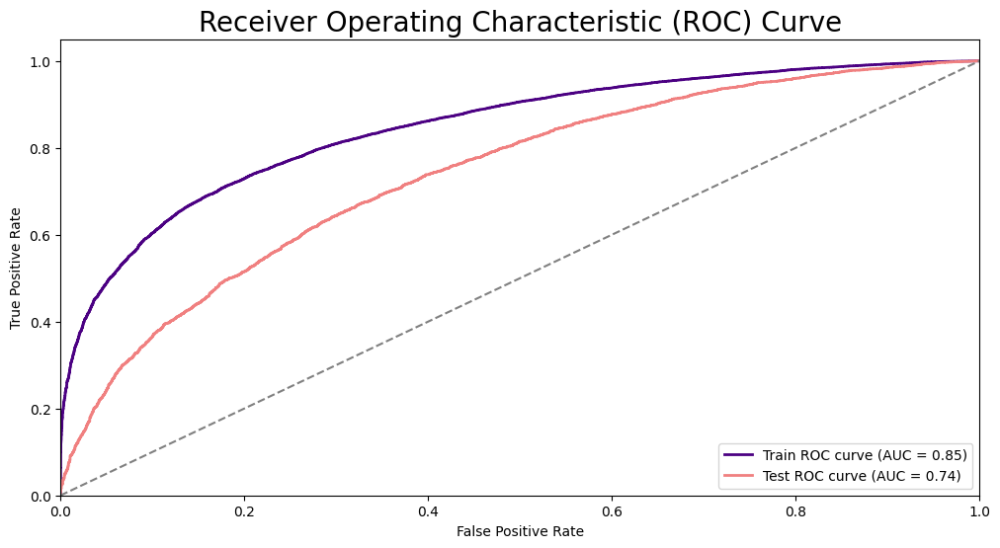

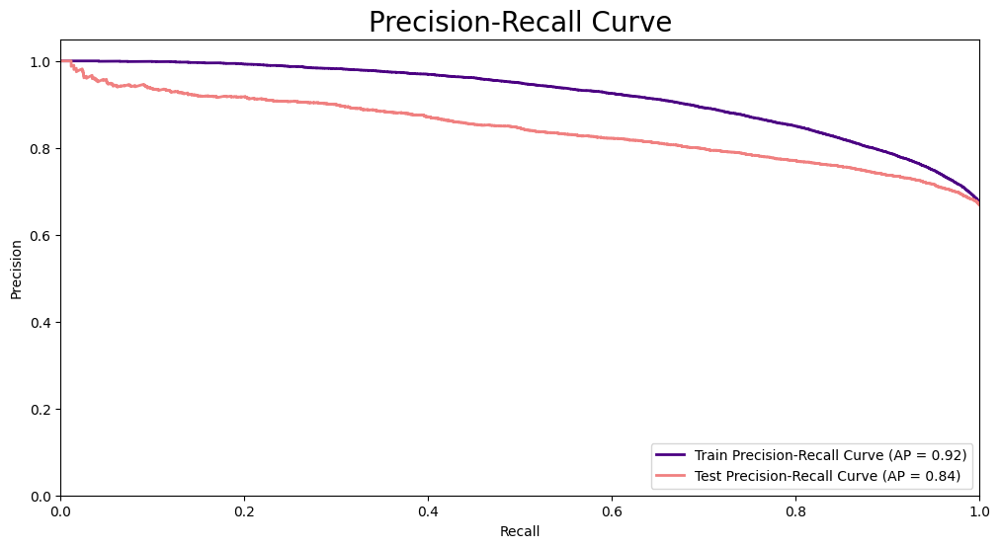

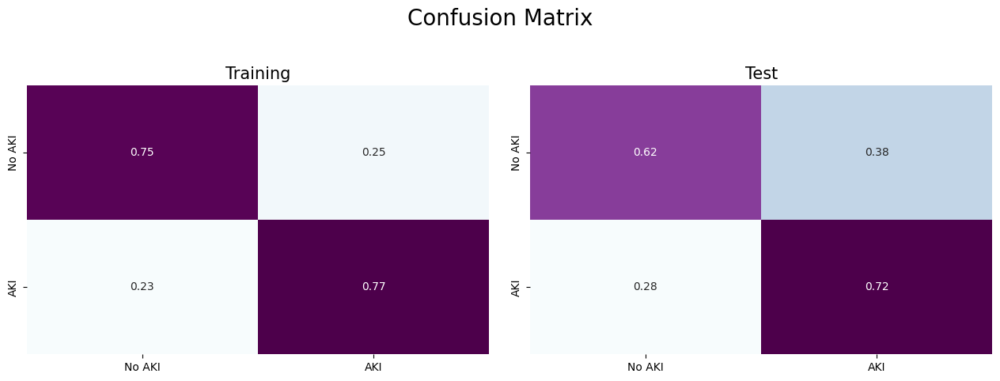

In [55]:
from sklearn.ensemble import RandomForestClassifier

# define the etc model
forest_filter = RandomForestClassifier(max_depth=10, class_weight='balanced', n_jobs=-1, random_state=122)
forest_filter.fit(Xtrain_imputed[filterFeats_tree], ytrain)

helper.modelPerformance(forest_filter, Xtrain_imputed[filterFeats_tree], Xtest_imputed[filterFeats_tree], ytrain, ytest)

In [56]:
# performance summary by key metrics 
rf_filter = helper.eval_metrics(forest_filter, Xtest_imputed[filterFeats_tree], ytest, 'RandomForest-FilterMethod')

##### Classifier 5 | Gradient Boosting

Classification report for training data:
              precision    recall  f1-score   support

      No AKI       0.66      0.37      0.48     13488
         AKI       0.75      0.91      0.82     27248

    accuracy                           0.73     40736
   macro avg       0.70      0.64      0.65     40736
weighted avg       0.72      0.73      0.71     40736

Classification report for test data:
              precision    recall  f1-score   support

      No AKI       0.66      0.37      0.47      3372
         AKI       0.74      0.91      0.82      6812

    accuracy                           0.73     10184
   macro avg       0.70      0.64      0.65     10184
weighted avg       0.72      0.73      0.70     10184



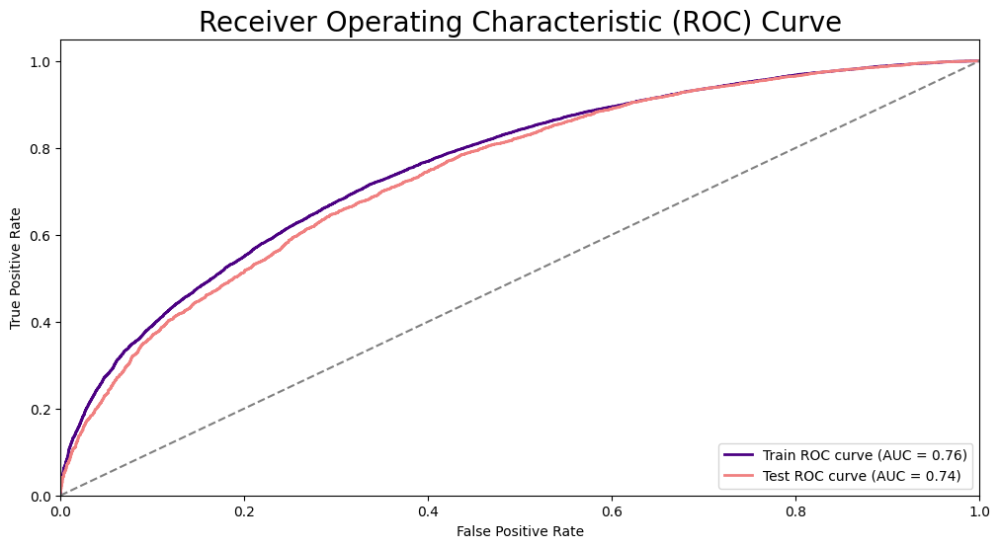

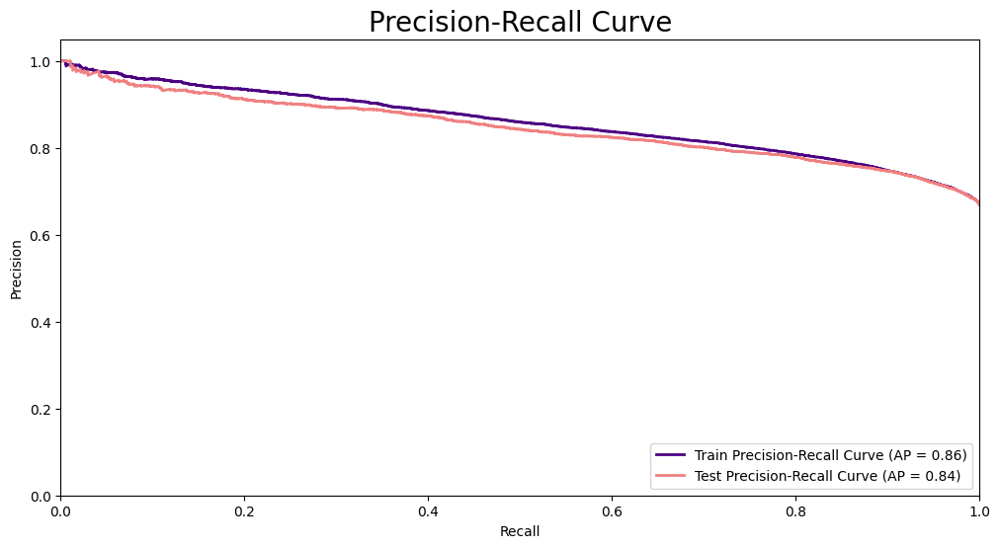

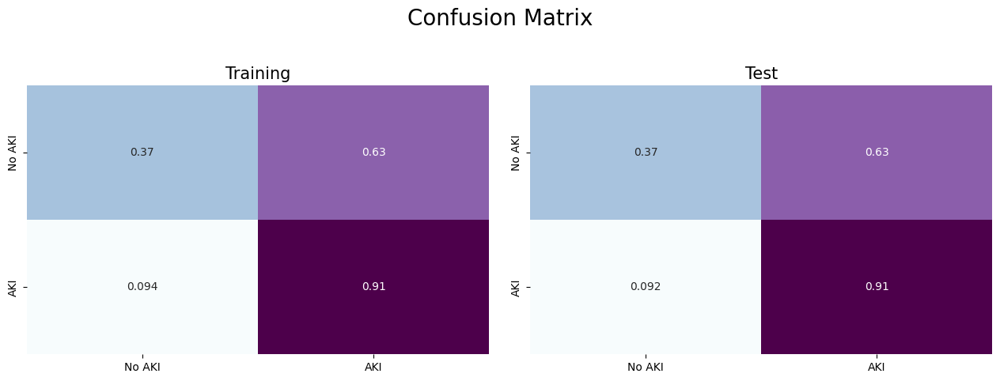

In [57]:
from sklearn.ensemble import GradientBoostingClassifier

# define the GBC model
gbc_filter = GradientBoostingClassifier(random_state=122)
gbc_filter.fit(Xtrain_imputed[filterFeats_tree], ytrain)

helper.modelPerformance(gbc_filter, Xtrain_imputed[filterFeats_tree], Xtest_imputed[filterFeats_tree], ytrain, ytest)

In [58]:
# performance summary by key metrics 
gradboost_filter = helper.eval_metrics(gbc_filter, Xtest_imputed[filterFeats_tree], ytest, 'GradientBoosting-FilterMethod')

##### Classifier 6 | Adaptive Boosting (AdaBoost)

Classification report for training data:
              precision    recall  f1-score   support

      No AKI       0.60      0.35      0.44     13488
         AKI       0.73      0.88      0.80     27248

    accuracy                           0.71     40736
   macro avg       0.66      0.62      0.62     40736
weighted avg       0.69      0.71      0.68     40736

Classification report for test data:
              precision    recall  f1-score   support

      No AKI       0.59      0.35      0.44      3372
         AKI       0.73      0.88      0.80      6812

    accuracy                           0.70     10184
   macro avg       0.66      0.61      0.62     10184
weighted avg       0.69      0.70      0.68     10184



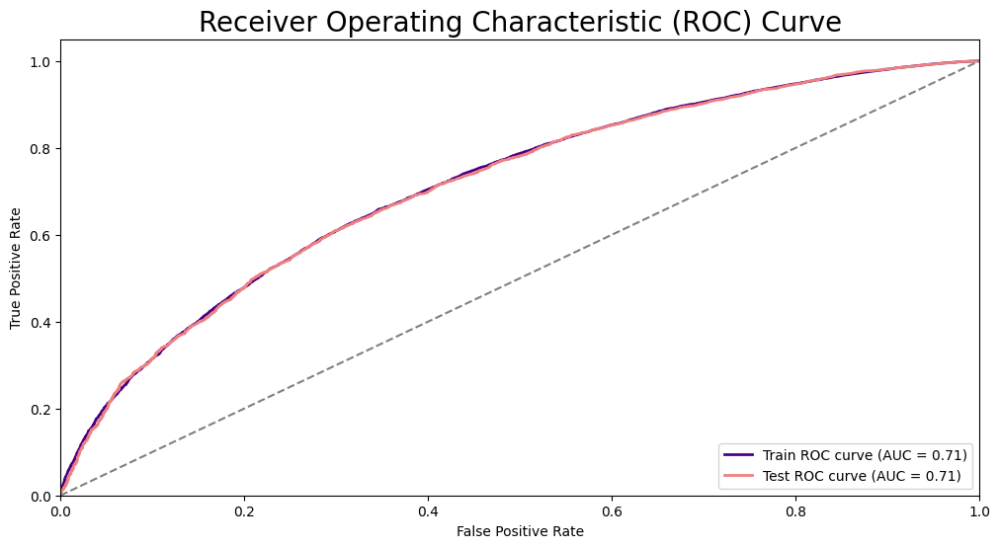

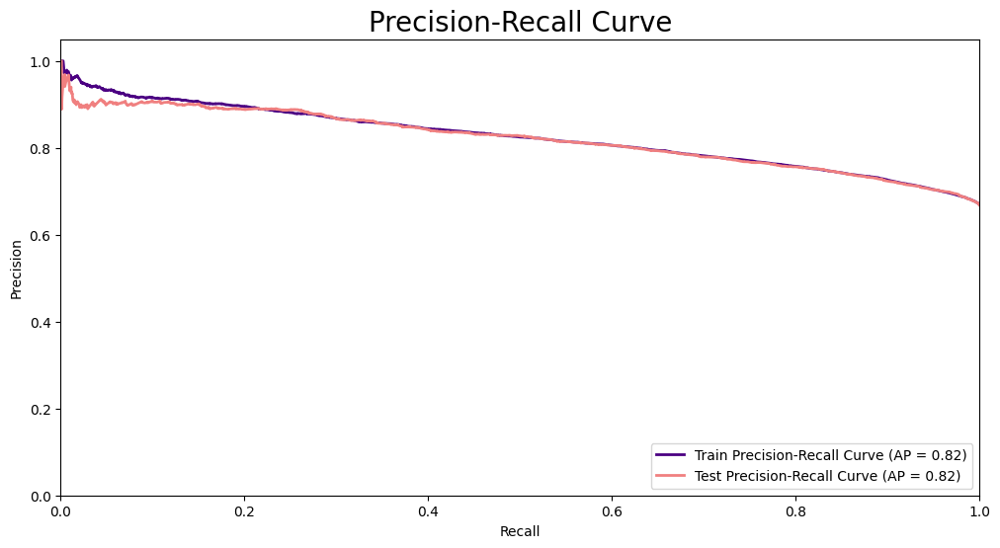

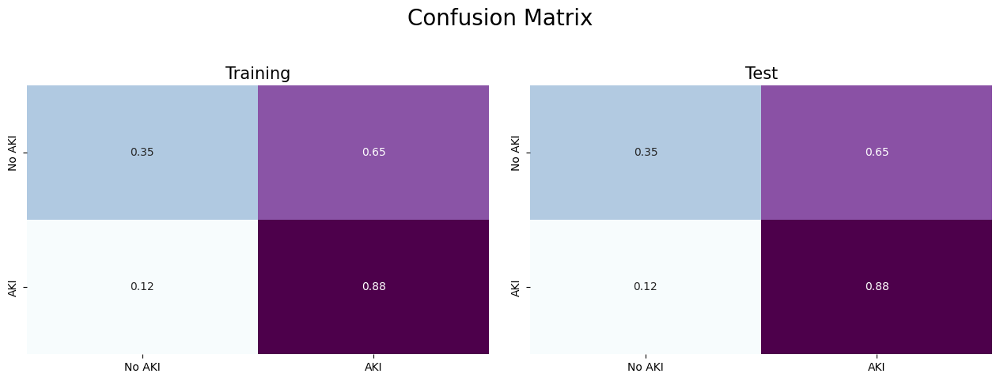

In [59]:
from sklearn.ensemble import AdaBoostClassifier

# define the GBC model
adaboost_filter = AdaBoostClassifier(algorithm='SAMME',random_state=122)
adaboost_filter.fit(Xtrain_imputed[filterFeats_tree], ytrain)

helper.modelPerformance(adaboost_filter, Xtrain_imputed[filterFeats_tree], Xtest_imputed[filterFeats_tree], ytrain, ytest)

In [60]:
# performance summary by key metrics 
ab_filter = helper.eval_metrics(adaboost_filter, Xtest_imputed[filterFeats_tree], ytest, 'AdaBoost-FilterMethod')

##### Result Summary

In [61]:
# summary result for filter method feature selection
filterResult = pd.concat([lr_filter, dtree_filter, extratree_filter, rf_filter, gradboost_filter, ab_filter], axis=0)
filterResult

,AUROC,Average_Precision,Precision,Recall,F1 score,False Positive Rate
LogisticRegression-FilterMethod,0.735465,0.828037,0.654865,0.673587,0.652479,0.309609
DecisionTree-FilterMethod,0.696076,0.801800,0.630882,0.644378,0.631377,0.382266
ExtraTree-FilterMethod,0.725210,0.831534,0.643258,0.660746,0.639940,0.323547
RandomForest-FilterMethod,0.738328,0.842473,0.657469,0.669105,0.660609,0.384045
GradientBoosting-FilterMethod,0.744003,0.844829,0.703988,0.638069,0.645765,0.631673
AdaBoost-FilterMethod,0.711631,0.819874,0.661547,0.614330,0.618662,0.652432


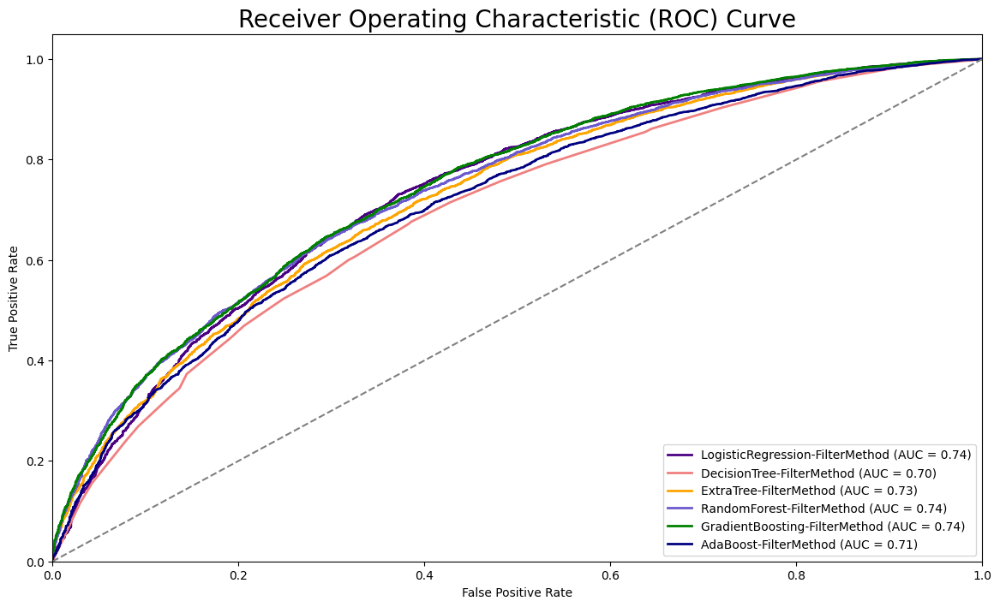

In [63]:
from sklearn.metrics import recall_score, precision_score, f1_score, precision_recall_curve, average_precision_score, roc_curve, auc, confusion_matrix

lr_filter_proba = logreg_filter.predict_proba(Xtest_imputed[filterFeats_lr])
dtree_filter_proba = tree_filter.predict_proba(Xtest_imputed[filterFeats_tree])
extratree_filter_proba = etc_filter.predict_proba(Xtest_imputed[filterFeats_tree])
rf_filter_proba = forest_filter.predict_proba(Xtest_imputed[filterFeats_tree])
gradboost_filter_proba = gbc_filter.predict_proba(Xtest_imputed[filterFeats_tree])
adaboost_filter_proba = adaboost_filter.predict_proba(Xtest_imputed[filterFeats_tree])

# plot the ROC curve
fpr_lr_filter, tpr_lr_filter, threshold = roc_curve(ytest, lr_filter_proba[:,1])
roc_auc_lr_filter = auc(fpr_lr_filter, tpr_lr_filter)

fpr_dtree_filter, tpr_dtree_filter, threshold = roc_curve(ytest, dtree_filter_proba[:,1])
roc_auc_dtree_filter = auc(fpr_dtree_filter, tpr_dtree_filter)

fpr_extree_filter, tpr_extree_filter, threshold = roc_curve(ytest, extratree_filter_proba[:,1])
roc_auc_extree_filter = auc(fpr_extree_filter, tpr_extree_filter)

fpr_rf_filter, tpr_rf_filter, threshold = roc_curve(ytest, rf_filter_proba[:,1])
roc_auc_rf_filter = auc(fpr_rf_filter, tpr_rf_filter)

fpr_gb_filter, tpr_gb_filter, threshold = roc_curve(ytest, gradboost_filter_proba[:,1])
roc_auc_gb_filter = auc(fpr_gb_filter, tpr_gb_filter)

fpr_ab_filter, tpr_ab_filter, threshold = roc_curve(ytest, adaboost_filter_proba[:,1])
roc_auc_ab_filter = auc(fpr_ab_filter, tpr_ab_filter)


plt.figure(figsize=(14, 8))
plt.plot(fpr_lr_filter, tpr_lr_filter, color='indigo', lw=2, label=f'LogisticRegression-FilterMethod (AUC = {roc_auc_lr_filter:.2f})')
plt.plot(fpr_dtree_filter, tpr_dtree_filter, color='lightcoral', lw=2, label=f'DecisionTree-FilterMethod (AUC = {roc_auc_dtree_filter:.2f})')
plt.plot(fpr_extree_filter, tpr_extree_filter, color='orange', lw=2, label=f'ExtraTree-FilterMethod (AUC = {roc_auc_extree_filter:.2f})')
plt.plot(fpr_rf_filter, tpr_rf_filter, color='slateblue', lw=2, label=f'RandomForest-FilterMethod (AUC = {roc_auc_rf_filter:.2f})')
plt.plot(fpr_gb_filter, tpr_gb_filter, color='green', lw=2, label=f'GradientBoosting-FilterMethod (AUC = {roc_auc_gb_filter:.2f})')
plt.plot(fpr_ab_filter, tpr_ab_filter, color='navy', lw=2, label=f'AdaBoost-FilterMethod (AUC = {roc_auc_ab_filter:.2f})')


plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=20)
plt.legend(loc='lower right')
plt.show()

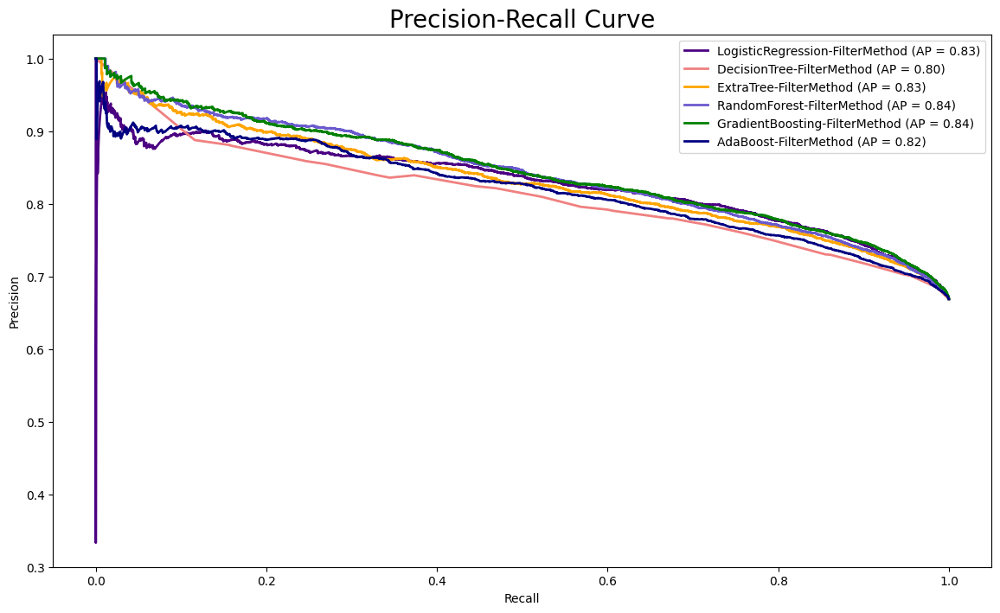

In [64]:
# precision-recall curve
precision_lr_filter, recall_lr_filter, thresholds_lr = precision_recall_curve(ytest, lr_filter_proba[:,1])
precision_dtree_filter, recall_dtree_filter, thresholds_dtree = precision_recall_curve(ytest, dtree_filter_proba[:,1])
precision_extree_filter, recall_extree_filter, thresholds_extree = precision_recall_curve(ytest, extratree_filter_proba[:,1])
precision_rf_filter, recall_rf_filter, thresholds_rf = precision_recall_curve(ytest, rf_filter_proba[:,1])
precision_gb_filter, recall_gb_filter, thresholds_gb = precision_recall_curve(ytest, gradboost_filter_proba[:,1])
precision_ab_filter, recall_ab_filter, thresholds_ab = precision_recall_curve(ytest, adaboost_filter_proba[:,1])

# compute average precision 
ap_lr_filter = average_precision_score(ytest, lr_filter_proba[:, 1])
ap_dtree_filter = average_precision_score(ytest, dtree_filter_proba[:, 1])
ap_extree_filter = average_precision_score(ytest, extratree_filter_proba[:, 1])
ap_rf_filter = average_precision_score(ytest, rf_filter_proba[:, 1])
ap_gb_filter = average_precision_score(ytest, gradboost_filter_proba[:, 1])
ap_ab_filter = average_precision_score(ytest, adaboost_filter_proba[:, 1])

plt.figure(figsize=(14, 8))
plt.plot(recall_lr_filter, precision_lr_filter, color='indigo', lw=2, label=f'LogisticRegression-FilterMethod (AP = {ap_lr_filter:.2f})')
plt.plot(recall_dtree_filter, precision_dtree_filter, color='lightcoral', lw=2, label=f'DecisionTree-FilterMethod (AP = {ap_dtree_filter:.2f})')
plt.plot(recall_extree_filter, precision_extree_filter, color='orange', lw=2, label=f'ExtraTree-FilterMethod (AP = {ap_extree_filter:.2f})')
plt.plot(recall_rf_filter, precision_rf_filter, color='slateblue', lw=2, label=f'RandomForest-FilterMethod (AP = {ap_rf_filter:.2f})')
plt.plot(recall_gb_filter, precision_gb_filter, color='green', lw=2, label=f'GradientBoosting-FilterMethod (AP = {ap_gb_filter:.2f})')
plt.plot(recall_ab_filter, precision_ab_filter, color='navy', lw=2, label=f'AdaBoost-FilterMethod (AP = {ap_ab_filter:.2f})')



plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve', fontsize=20)
plt.legend(loc='best')
plt.show()

### 3.4 Feature Selection Method 2 | Wrapper Method

Unlike filter methods, wrapper methods utilize the performance of the selected classifier algorithm as a metric to guide the selection of the optimal feature subset. Consequently, wrapper methods identify the feature subset that yields the highest performance for the chosen classifier (Pudjihartono et al., 2022). Sequential forward and backward selection, genetic algorithms, and recursive feature elimination (RFE) are some commonly used wrapper methods for feature selection. It is worth noting that wrapper methods are dependent on the classifier used. Thus, the same set of selected features may not remain optimum if another classifier is employed. In this project, we performed RFE with different learning algorithms using the ‘Scikit-Learn’ library. Briefly, a supervised learning algorithm will be used to assign weights (coefficient or feature importance) to each independent variable. The number of features to be selected can be specified through the ‘n_features_to_select’ parameter. Similarly, without sufficient clinical background, we experimented with a different number (ranging from 5 to 50) and assessed the model performance using the AUC metric to find the optimal number of features to be selected. The number of features that yielded the highest AUC will be chosen for further model tuning. 


Reference: Pudjihartono N, Fadason T, Kempa-Liehr AW, O’Sullivan JM. A Review of Feature Selection Methods for Machine Learning-Based Disease Risk Prediction. Frontiers in Bioinformatics. 2022;2. doi:10.3389/fbinf.2022.927312

#### 3.4.1 Recursive Feature Elimination (RFE)

In [65]:
# get the total number of variables
totalVar = len(Xtrain_imputed.columns)

# list of feature sequence to be studied
numFeats = np.arange(start=5,stop=totalVar,step=5)

In [66]:
from sklearn.feature_selection import RFE

# helper function to perform recursive feature elimination
# function take in 4 arguments, X=feature matrix, y=target, RFE_estimator=learning model to provide feature importance (weights, feature importance)
# num_feats=number of features return (default 10 features)
def recursiveFeatureSelection(X,y,RFE_estimator,num_feats=10,verbose=True):
    selector = RFE(estimator=RFE_estimator, n_features_to_select=num_feats)
    selector.fit(X,y)
    selected_feats = selector.get_feature_names_out()
    if verbose:
        print('Features selected via recursive feature elimination approach:',', '.join(selected_feats))
    return selected_feats

##### Classifier 1 | Logistic Regression

In [67]:
# define a RFE_estimator and base estimator 
RFE_estimator = LogisticRegression(solver='saga', max_iter=100000, n_jobs=-1, random_state=122)
base_estimator = LogisticRegression(solver='saga', max_iter=100000, n_jobs=-1, random_state=122)

scores = []
feature_set = []

for num in numFeats:
    featureSet = helper.recursiveFeatureSelection(X,y,RFE_estimator,num_feats=num,verbose=False)
    feature_set.append(featureSet)
    base_estimator.fit(X[featureSet],y)
    ypred = base_estimator.predict_proba(X[featureSet])
    auroc = roc_auc_score(y,ypred[:, 1])
    scores.append(auroc)

,Number of Features,Selected Features,AUROC Scores
0,5,"[sbp_min, sbp_max, temperature_max, bun_min, p...",0.68955
1,10,"[sbp_min, sbp_max, dbp_mean, resp_rate_mean, t...",0.702677
2,15,"[heart_rate_max, sbp_min, sbp_max, dbp_mean, r...",0.707508
3,20,"[admission_age, heart_rate_max, sbp_min, sbp_m...",0.712295
4,25,"[admission_age, heart_rate_max, sbp_min, sbp_m...",0.722501
5,30,"[admission_age, heart_rate_max, sbp_min, sbp_m...",0.723276
6,35,"[admission_age, heart_rate_min, heart_rate_max...",0.724588
7,40,"[admission_age, heart_rate_min, heart_rate_max...",0.725514
8,45,"[admission_age, heart_rate_min, heart_rate_max...",0.726327
9,50,"[admission_age, heart_rate_min, heart_rate_max...",0.72638


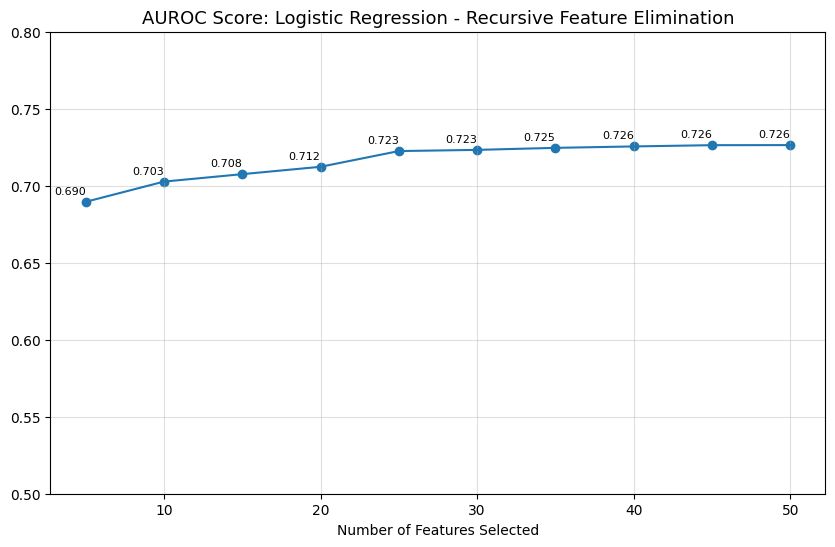

In [68]:
# visualize the AUROC score for various number of features selected
rfe_score_lr = pd.DataFrame([numFeats,feature_set,scores]).T
rfe_score_lr.columns = ['Number of Features', 'Selected Features', 'AUROC Scores']
display(rfe_score_lr)
print()

# plot a line chart
plt.figure(figsize=(10,6))
plt.plot(rfe_score_lr['Number of Features'], rfe_score_lr['AUROC Scores'])
plt.xlabel('Number of Features Selected')
plt.grid(alpha=0.4)
plt.ylim(0.5,0.8)
plt.title('AUROC Score: Logistic Regression - Recursive Feature Elimination',fontsize=13)

# overlay points
plt.scatter(rfe_score_lr['Number of Features'], rfe_score_lr['AUROC Scores'])

# annotate points with values
for i, txt in enumerate(rfe_score_lr['AUROC Scores']):
    plt.text(rfe_score_lr['Number of Features'][i], txt+0.005, f"{txt:.3f}", ha='right', fontsize=8, color='black')


plt.show()

In [69]:
# features used for the subsequent modelling
rfeFeats_lr = rfe_score_lr['Selected Features'][4]
print(rfeFeats_lr)

['admission_age' 'heart_rate_max' 'sbp_min' 'sbp_max' 'sbp_mean' 'dbp_max'
 'dbp_mean' 'mbp_mean' 'resp_rate_min' 'resp_rate_max' 'resp_rate_mean'
 'temperature_max' 'spo2_min' 'hematocrit_max.1' 'hemoglobin_min.1'
 'platelets_min' 'aniongap_min' 'bun_min' 'bun_max' 'chloride_max.1'
 'glucose_min.2' 'potassium_max.1' 'pt_max' 'gcs_min' 'gcs_unable']


Best Hyperparameters from Grid Search :  {'C': 1.3000000000000003}
Best Weighted F1 Score:  0.7203360840167239

Classification report for training data:
              precision    recall  f1-score   support

      No AKI       0.48      0.68      0.56     13488
         AKI       0.80      0.64      0.71     27248

    accuracy                           0.65     40736
   macro avg       0.64      0.66      0.64     40736
weighted avg       0.70      0.65      0.66     40736

Classification report for test data:
              precision    recall  f1-score   support

      No AKI       0.49      0.68      0.57      3372
         AKI       0.80      0.64      0.71      6812

    accuracy                           0.66     10184
   macro avg       0.65      0.66      0.64     10184
weighted avg       0.70      0.66      0.67     10184



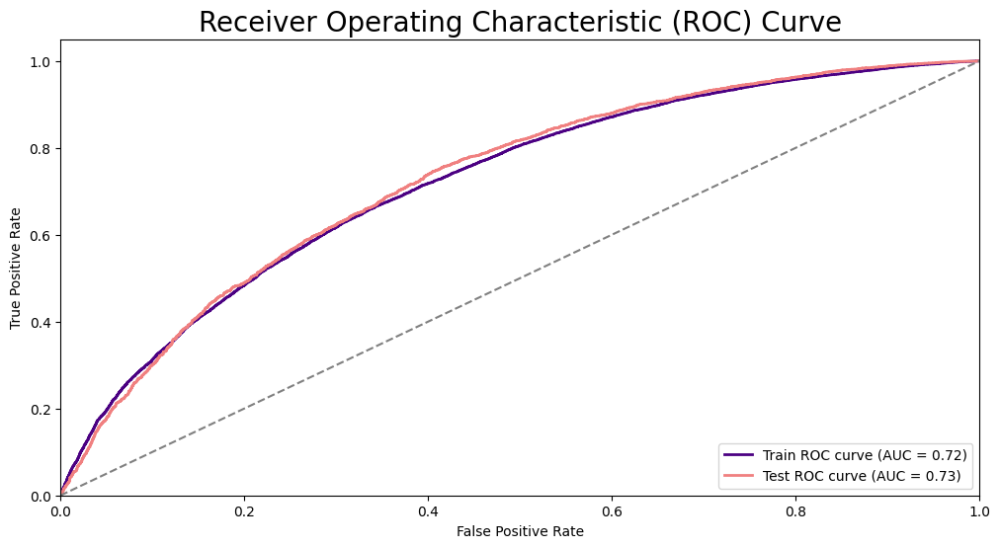

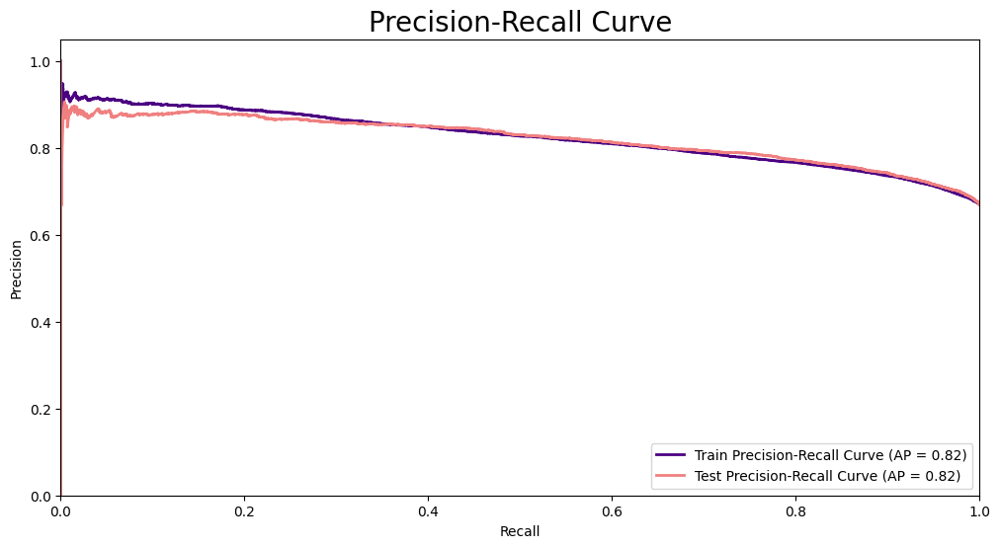

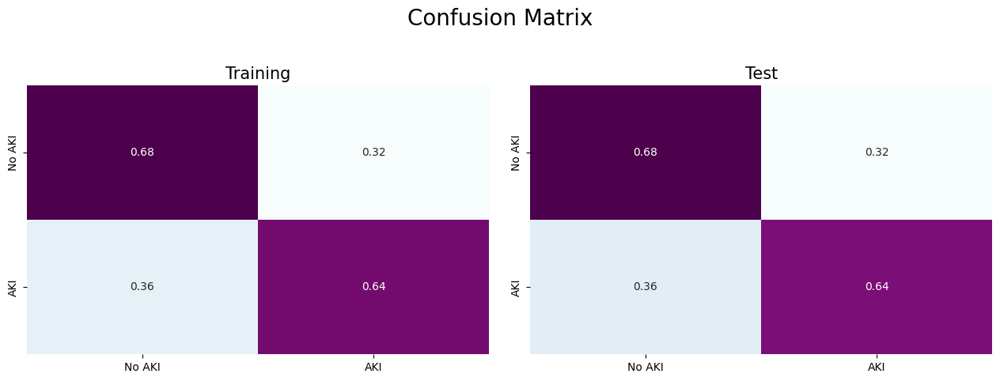

In [70]:
# fit a model with the selected features and perform hyperparameter tuning
# define the base model for tuning
logreg = LogisticRegression(penalty='l2',              # add l2 regularization - also default parameter
                            class_weight='balanced',   # uses the values of y to automatically adjust weights inversely proportional to class frequencies (assigns higher weights to the minority class; lower weights to the majority class)
                            solver='saga', 
                            max_iter=100000, 
                            random_state=122)

# define the search grid
param_grid = {
    'C': np.arange(start=1.0, stop=1.3, step=0.05)
}

# hyperparameter tuning via grid search approach
logreg_rfe = helper.hyperparameterTuning(logreg, param_grid, rfeFeats_lr, Xtrain_imputed, ytrain)

# model performance
helper.modelPerformance(logreg_rfe, Xtrain_imputed[rfeFeats_lr], Xtest_imputed[rfeFeats_lr], ytrain, ytest)

In [71]:
# performance summary by key metrics 
lr_rfe = helper.eval_metrics(logreg_rfe, Xtest_imputed[rfeFeats_lr], ytest, 'LogisticRegression-WrapperMethodRFE')

##### Classifier 2 | Decision Tree

In [72]:
# define the RFE_estimator and base_estimator
RFE_estimator = DecisionTreeClassifier(random_state=122)
base_estimator = DecisionTreeClassifier(max_depth=10, random_state=122)

scores = []
feature_set = []

for num in numFeats:
    featureSet = helper.recursiveFeatureSelection(X,y,RFE_estimator,num_feats=num,verbose=False)
    feature_set.append(featureSet)
    base_estimator.fit(X[featureSet],y)
    ypred = base_estimator.predict_proba(X[featureSet])
    auroc = roc_auc_score(y,ypred[:, 1])
    scores.append(auroc)

,Number of Features,Selected Features,AUROC Scores
0,5,"[admission_age, dbp_mean, hematocrit_max.1, pt...",0.834932
1,10,"[admission_age, sbp_min, sbp_max, dbp_mean, re...",0.886426
2,15,"[admission_age, sbp_min, sbp_max, sbp_mean, db...",0.892604
3,20,"[admission_age, heart_rate_mean, sbp_min, sbp_...",0.903527
4,25,"[admission_age, heart_rate_max, heart_rate_mea...",0.904404
5,30,"[admission_age, heart_rate_max, heart_rate_mea...",0.912047
6,35,"[admission_age, heart_rate_max, heart_rate_mea...",0.912987
7,40,"[admission_age, heart_rate_min, heart_rate_max...",0.914982
8,45,"[admission_age, heart_rate_min, heart_rate_max...",0.919642
9,50,"[admission_age, heart_rate_min, heart_rate_max...",0.919745


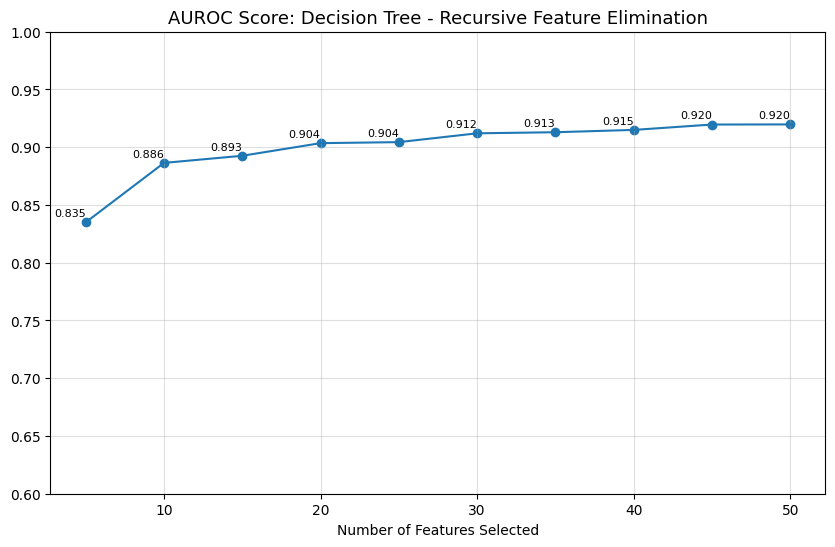

In [73]:
# visualize the AUROC score for various number of features selected
rfe_score_tree = pd.DataFrame([numFeats,feature_set,scores]).T
rfe_score_tree.columns = ['Number of Features', 'Selected Features', 'AUROC Scores']
display(rfe_score_tree)
print()

# plot a line chart
plt.figure(figsize=(10,6))
plt.plot(rfe_score_tree['Number of Features'], rfe_score_tree['AUROC Scores'])
plt.xlabel('Number of Features Selected')
plt.grid(alpha=0.4)
plt.ylim(0.6,1)
plt.title('AUROC Score: Decision Tree - Recursive Feature Elimination',fontsize=13)

# overlay points
plt.scatter(rfe_score_tree['Number of Features'], rfe_score_tree['AUROC Scores'])

# annotate points with values
for i, txt in enumerate(rfe_score_tree['AUROC Scores']):
    plt.text(rfe_score_tree['Number of Features'][i], txt+0.005, f"{txt:.3f}", ha='right', fontsize=8, color='black')

plt.show()

In [74]:
# features used for the subsequent modelling
rfeFeats_tree = rfe_score_tree['Selected Features'][4]
print(rfeFeats_tree)

['admission_age' 'heart_rate_max' 'heart_rate_mean' 'sbp_min' 'sbp_max'
 'sbp_mean' 'dbp_mean' 'mbp_mean' 'resp_rate_max' 'resp_rate_mean'
 'temperature_max' 'temperature_mean' 'hematocrit_min.1'
 'hematocrit_max.1' 'platelets_min' 'bicarbonate_max.1' 'bun_min'
 'bun_max' 'chloride_max.1' 'sodium_min.1' 'potassium_min.1' 'pt_max'
 'ptt_min' 'ptt_max' 'gcs_verbal']


Best Hyperparameters from Grid Search :  {'max_depth': 6, 'min_samples_leaf': 3}
Best Weighted F1 Score:  0.69537396995972

Classification report for training data:
              precision    recall  f1-score   support

      No AKI       0.50      0.63      0.56     13488
         AKI       0.79      0.69      0.74     27248

    accuracy                           0.67     40736
   macro avg       0.64      0.66      0.65     40736
weighted avg       0.69      0.67      0.68     40736

Classification report for test data:
              precision    recall  f1-score   support

      No AKI       0.48      0.61      0.54      3372
         AKI       0.78      0.68      0.72      6812

    accuracy                           0.65     10184
   macro avg       0.63      0.64      0.63     10184
weighted avg       0.68      0.65      0.66     10184



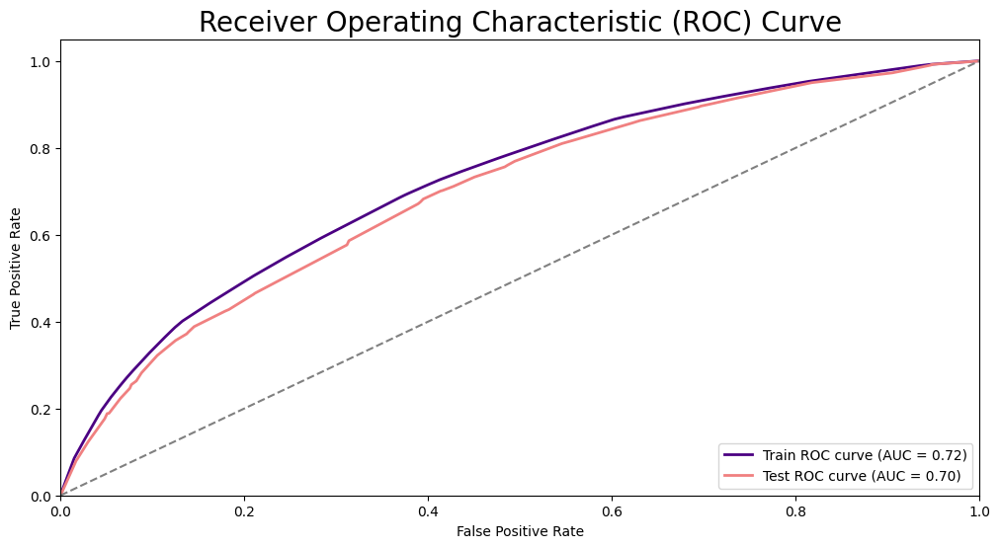

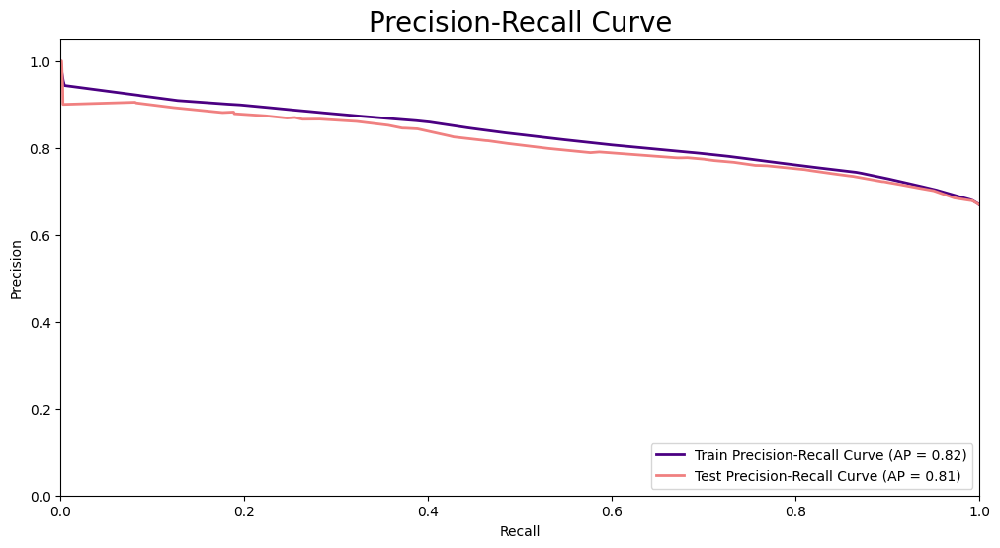

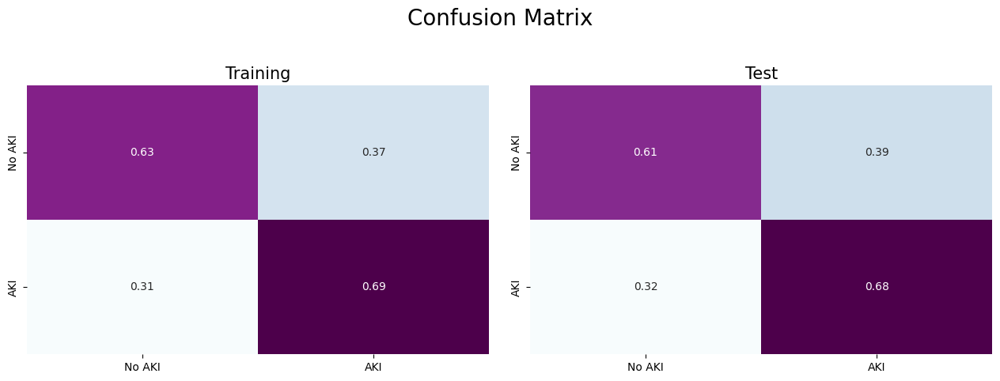

In [75]:
# fit a model with the selected features and perform hyperparameter tuning
# define the base model for tuning
tree = DecisionTreeClassifier(class_weight='balanced',
                              random_state=122)

# define the search grid
param_grid = {
    'max_depth': [3,4,5,6,7],
    'min_samples_leaf': [2,3,4]
}

# hyperparameter tuning via grid search approach
tree_rfe = helper.hyperparameterTuning(tree, param_grid, rfeFeats_tree, Xtrain_imputed, ytrain)

# model performance
helper.modelPerformance(tree_rfe, Xtrain_imputed[rfeFeats_tree], Xtest_imputed[rfeFeats_tree], ytrain, ytest)

In [77]:
# performance summary by key metrics 
dtree_rfe = helper.eval_metrics(tree_rfe, Xtest_imputed[rfeFeats_tree], ytest, 'DecisionTree-WrapperMethodRFE')

##### Result Summary

In [78]:
# summary result for filter method feature selection
wrapperResult = pd.concat([lr_rfe, dtree_rfe], axis=0)
wrapperResult

,AUROC,Average_Precision,Precision,Recall,F1 score,False Positive Rate
LogisticRegression-WrapperMethodRFE,0.727097,0.819970,0.645184,0.663134,0.641193,0.315540
DecisionTree-WrapperMethodRFE,0.697572,0.807405,0.629232,0.641982,0.630153,0.391756


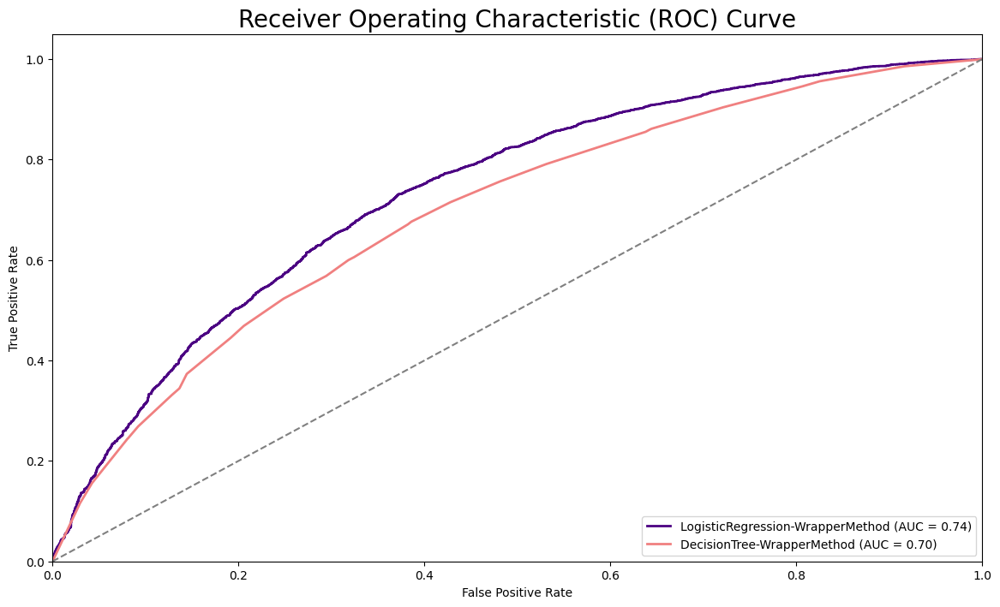

In [79]:
lr_rfe_proba = logreg_filter.predict_proba(Xtest_imputed[filterFeats_lr])
dtree_rfe_proba = tree_filter.predict_proba(Xtest_imputed[filterFeats_tree])

# compute the AUROC score
fpr_lr_rfe, tpr_lr_rfe, threshold = roc_curve(ytest, lr_rfe_proba[:,1])
roc_auc_lr_rfe = auc(fpr_lr_rfe, tpr_lr_rfe)

fpr_dtree_rfe, tpr_dtree_rfe, threshold = roc_curve(ytest, dtree_rfe_proba[:,1])
roc_auc_dtree_rfe = auc(fpr_dtree_rfe, tpr_dtree_rfe)

# plot the ROC curve
plt.figure(figsize=(14, 8))
plt.plot(fpr_lr_rfe, tpr_lr_rfe, color='indigo', lw=2, label=f'LogisticRegression-WrapperMethod (AUC = {roc_auc_lr_rfe:.2f})')
plt.plot(fpr_dtree_rfe, tpr_dtree_rfe, color='lightcoral', lw=2, label=f'DecisionTree-WrapperMethod (AUC = {roc_auc_dtree_rfe:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=20)
plt.legend(loc='lower right')
plt.show()

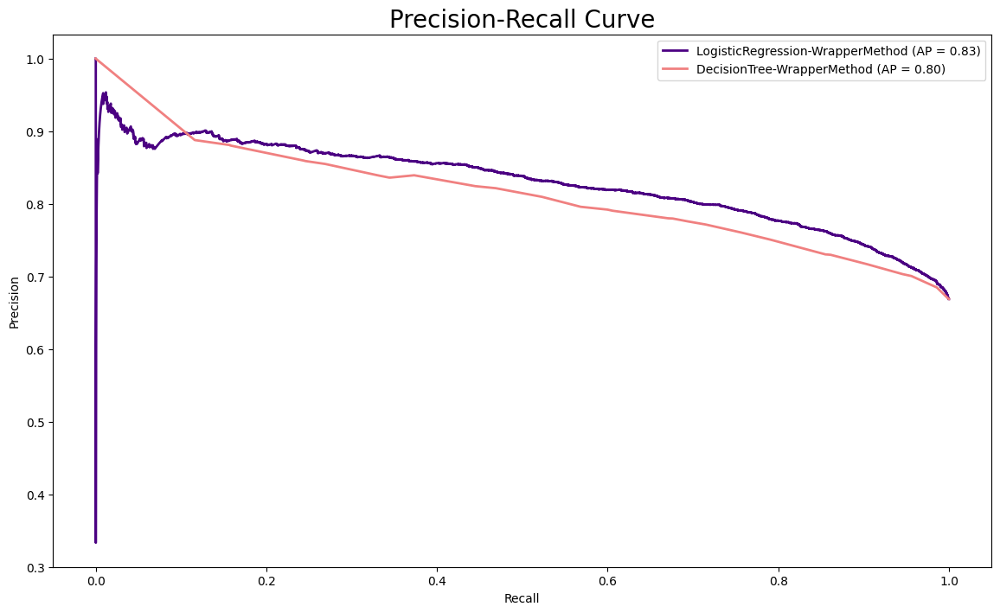

In [80]:
# precision-recall curve
precision_lr_rfe, recall_lr_rfe, thresholds_lr = precision_recall_curve(ytest, lr_rfe_proba[:,1])
precision_dtree_rfe, recall_dtree_rfe, thresholds_dtree = precision_recall_curve(ytest, dtree_rfe_proba[:,1])


# compute average precision 
ap_lr_rfe = average_precision_score(ytest, lr_rfe_proba[:, 1])
ap_dtree_rfe = average_precision_score(ytest, dtree_rfe_proba[:, 1])

# plot the Precision-Recall curve
plt.figure(figsize=(14, 8))
plt.plot(recall_lr_rfe, precision_lr_rfe, color='indigo', lw=2, label=f'LogisticRegression-WrapperMethod (AP = {ap_lr_rfe:.2f})')
plt.plot(recall_dtree_rfe, precision_dtree_rfe, color='lightcoral', lw=2, label=f'DecisionTree-WrapperMethod (AP = {ap_dtree_rfe:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve', fontsize=20)
plt.legend(loc='best')
plt.show()

#### 3.4.2 Stepwise Feature Selection (Forward Selection)

In [81]:
# get the total number of variables
totalVar = len(Xtrain_imputed.columns)

# list of feature sequence to be studied
numFeats = np.arange(start=5,stop=totalVar,step=5)

##### Classifier 1 | Logistic Regression

In [82]:
# define a RFE_estimator and base estimator 
sfs_estimator = LogisticRegression(solver='saga', max_iter=100000, n_jobs=-1, random_state=122)
base_estimator = LogisticRegression(solver='saga', max_iter=100000, n_jobs=-1, random_state=122)

scores = []
feature_set = []

for num in numFeats:
    featureSet = helper.sequentialFeatureSelection(X,y,sfs_estimator,num_feats=num,direction='forward',verbose=False)
    feature_set.append(featureSet)
    base_estimator.fit(X[featureSet],y)
    ypred = base_estimator.predict_proba(X[featureSet])
    auroc = roc_auc_score(y,ypred[:, 1])
    scores.append(auroc)

,Number of Features,Selected Features,AUC Scores
0,5,"[sbp_min, bicarbonate_max.1, bun_min, sodium_m...",0.66826
1,10,"[admission_age, sbp_min, bicarbonate_max.1, bu...",0.697929
2,15,"[admission_age, sbp_min, dbp_mean, temperature...",0.698989
3,20,"[admission_age, sbp_min, dbp_mean, mbp_min, te...",0.701234
4,25,"[admission_age, heart_rate_mean, sbp_min, sbp_...",0.716858
5,30,"[admission_age, heart_rate_min, heart_rate_max...",0.718393
6,35,"[admission_age, heart_rate_min, heart_rate_max...",0.719079
7,40,"[admission_age, heart_rate_min, heart_rate_max...",0.720071
8,45,"[admission_age, heart_rate_min, heart_rate_max...",0.724249
9,50,"[admission_age, heart_rate_min, heart_rate_max...",0.724536


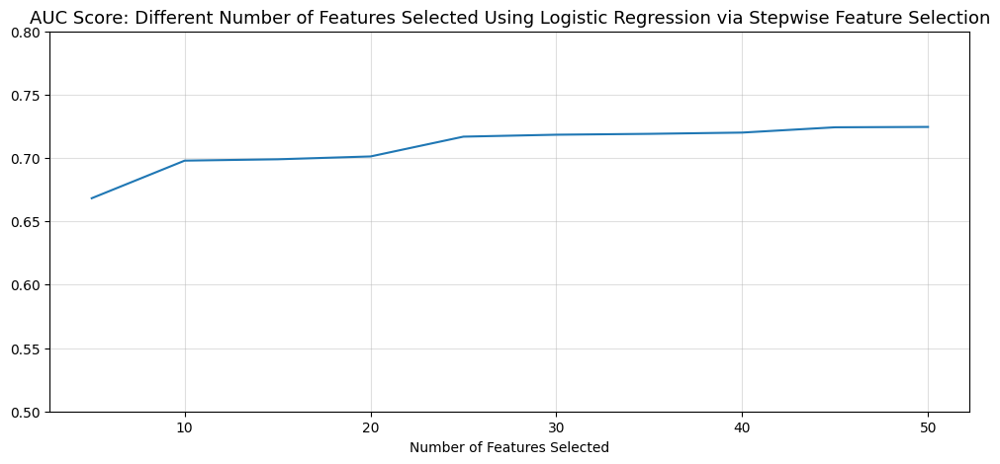

In [83]:
# visualize the AUROC score for various number of features selected
sfs_score_lr = pd.DataFrame([numFeats,feature_set,scores]).T
sfs_score_lr.columns = ['Number of Features', 'Selected Features', 'AUC Scores']
display(sfs_score_lr)
print()

# plot a line chart
plt.figure(figsize=(12,5))
plt.plot(sfs_score_lr['Number of Features'], sfs_score_lr['AUC Scores'])
plt.xlabel('Number of Features Selected')
plt.grid(alpha=0.4)
plt.ylim(0.5,0.8)
plt.title('AUC Score: Different Number of Features Selected Using Logistic Regression via Stepwise Feature Selection',fontsize=13)
plt.show()

In [84]:
# features selected for the subsequent modelling
sfsFeats_lr = sfs_score_lr['Selected Features'][2]
print(sfsFeats_lr)

['admission_age' 'sbp_min' 'dbp_mean' 'temperature_mean'
 'bicarbonate_max.1' 'bun_min' 'sodium_max.1' 'pt_max' 'ptt_min'
 'gcs_eyes' 'gcs_unable' 'gender_F' 'gender_M' 'race_ASIAN'
 'race_HISPANIC/LATINO']


Best Hyperparameters from Grid Search :  {'C': 15}
Best Weighted F1 Score:  0.6974123885090882

Classification report for training data:
              precision    recall  f1-score   support

      No AKI       0.47      0.68      0.55     13488
         AKI       0.79      0.61      0.69     27248

    accuracy                           0.64     40736
   macro avg       0.63      0.65      0.62     40736
weighted avg       0.68      0.64      0.65     40736

Classification report for test data:
              precision    recall  f1-score   support

      No AKI       0.47      0.69      0.56      3372
         AKI       0.80      0.61      0.69      6812

    accuracy                           0.64     10184
   macro avg       0.63      0.65      0.62     10184
weighted avg       0.69      0.64      0.65     10184



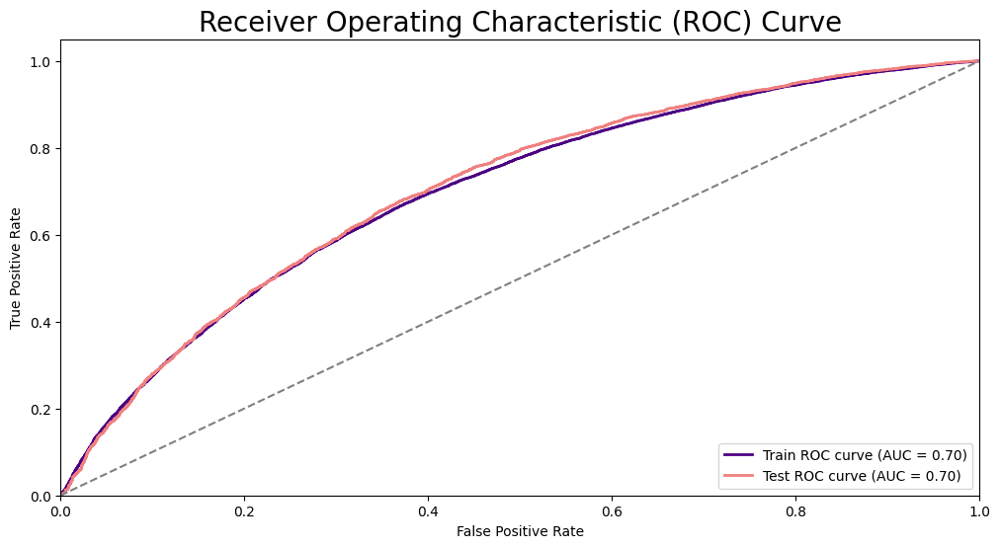

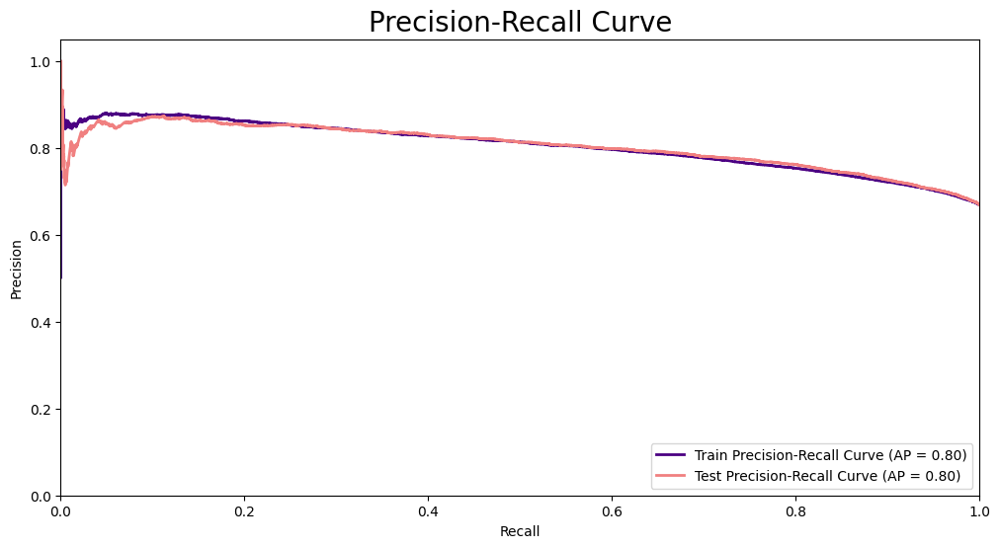

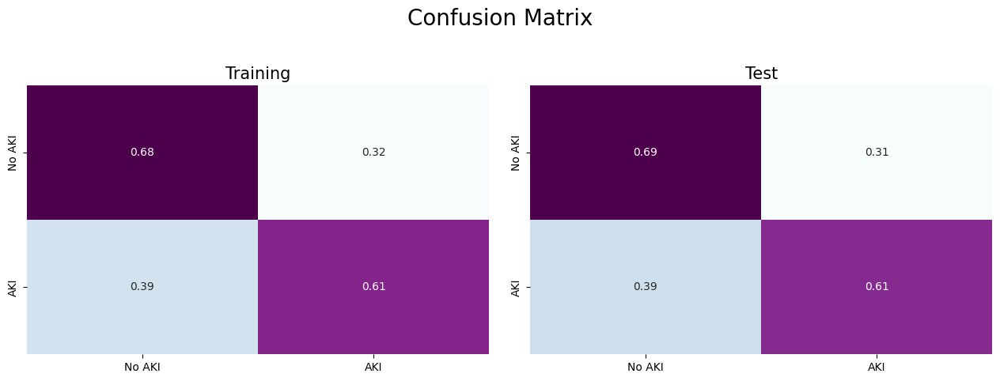

In [87]:
# fit a model with the selected features and perform hyperparameter tuning
# define the base model for tuning
logreg = LogisticRegression(penalty='l2',              # add l2 regularization - also default parameter
                            class_weight='balanced',   # uses the values of y to automatically adjust weights inversely proportional to class frequencies (assigns higher weights to the minority class; lower weights to the majority class)
                            solver='saga', 
                            max_iter=100000, 
                            random_state=122)

# define the search grid
param_grid = {
    'C': [1,5,10,15]
}

# hyperparameter tuning via grid search approach
logreg_sfs = helper.hyperparameterTuning(logreg, param_grid, sfsFeats_lr, Xtrain_imputed, ytrain)

# model performance
helper.modelPerformance(logreg_sfs, Xtrain_imputed[sfsFeats_lr], Xtest_imputed[sfsFeats_lr], ytrain, ytest)

##### Classifier 2 | Decision Tree

In [88]:
# define the RFE_estimator and base_estimator
sfs_estimator = DecisionTreeClassifier(random_state=122)
base_estimator = DecisionTreeClassifier(max_depth=10, random_state=122)

scores = []
feature_set = []

for num in numFeats:
    featureSet = helper.sequentialFeatureSelection(X,y,sfs_estimator,num_feats=num,direction='forward',verbose=False)
    feature_set.append(featureSet)
    base_estimator.fit(X[featureSet],y)
    ypred = base_estimator.predict_proba(X[featureSet])
    auroc = roc_auc_score(y,ypred[:, 1])
    scores.append(auroc)

,Number of Features,Selected Features,AUC Scores
0,5,"[potassium_max.1, gcs_verbal, gcs_unable, race...",0.701961
1,10,"[potassium_min.1, potassium_max.1, gcs_min, gc...",0.768344
2,15,"[sbp_max, bun_min, potassium_min.1, potassium_...",0.835494
3,20,"[sbp_min, sbp_max, spo2_min, bun_min, chloride...",0.880429
4,25,"[sbp_min, sbp_max, resp_rate_min, temperature_...",0.884535
5,30,"[sbp_min, sbp_max, dbp_min, mbp_max, resp_rate...",0.913116
6,35,"[sbp_min, sbp_max, sbp_mean, dbp_min, dbp_max,...",0.912689
7,40,"[heart_rate_max, heart_rate_mean, sbp_min, sbp...",0.92649
8,45,"[heart_rate_max, heart_rate_mean, sbp_min, sbp...",0.924144
9,50,"[admission_age, heart_rate_min, heart_rate_max...",0.92089


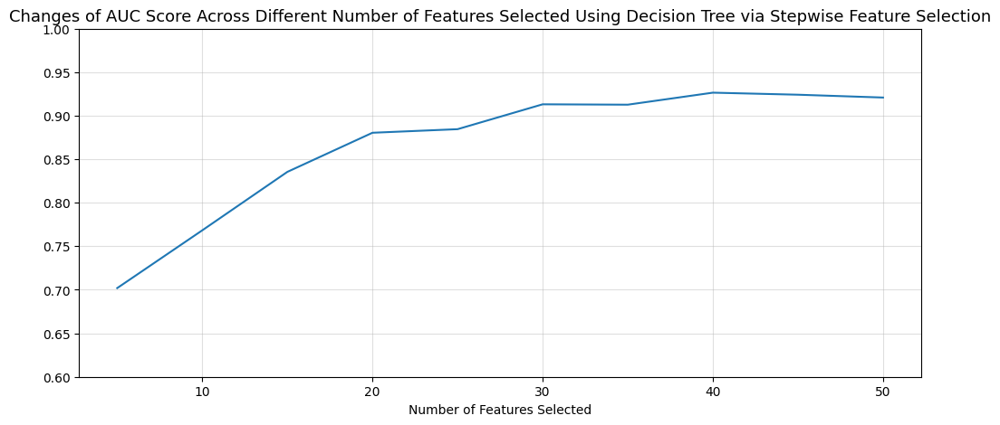

In [89]:
# visualize the AUROC score for various number of features selected
sfs_score_tree = pd.DataFrame([numFeats,feature_set,scores]).T
sfs_score_tree.columns = ['Number of Features', 'Selected Features', 'AUC Scores']
display(sfs_score_tree)
print()

# plot a line chart
plt.figure(figsize=(12,5))
plt.plot(sfs_score_tree['Number of Features'], sfs_score_tree['AUC Scores'])
plt.xlabel('Number of Features Selected')
plt.grid(alpha=0.4)
plt.ylim(0.6,1)
plt.title('Changes of AUC Score Across Different Number of Features Selected Using Decision Tree via Stepwise Feature Selection',fontsize=13)
plt.show()

In [90]:
# features used for the subsequent modelling
sfsFeats_tree = sfs_score_tree['Selected Features'][5]
print(sfsFeats_tree)

['sbp_min' 'sbp_max' 'dbp_min' 'mbp_max' 'resp_rate_min' 'temperature_max'
 'spo2_min' 'platelets_min' 'aniongap_max' 'bicarbonate_min.1' 'bun_min'
 'bun_max' 'chloride_min.1' 'chloride_max.1' 'glucose_min.2'
 'potassium_min.1' 'potassium_max.1' 'ptt_max' 'gcs_min' 'gcs_motor'
 'gcs_verbal' 'gcs_eyes' 'gcs_unable' 'gender_F' 'gender_M' 'race_ASIAN'
 'race_BLACK' 'race_HISPANIC/LATINO' 'race_OTHER' 'race_UNKNOWN']


Best Hyperparameters from Grid Search :  {'max_depth': 5}
Best Weighted F1 Score:  0.6886773215737038

Classification report for training data:
              precision    recall  f1-score   support

      No AKI       0.48      0.62      0.54     13488
         AKI       0.78      0.67      0.72     27248

    accuracy                           0.66     40736
   macro avg       0.63      0.65      0.63     40736
weighted avg       0.68      0.66      0.66     40736

Classification report for test data:
              precision    recall  f1-score   support

      No AKI       0.47      0.61      0.54      3372
         AKI       0.78      0.66      0.72      6812

    accuracy                           0.65     10184
   macro avg       0.63      0.64      0.63     10184
weighted avg       0.68      0.65      0.66     10184



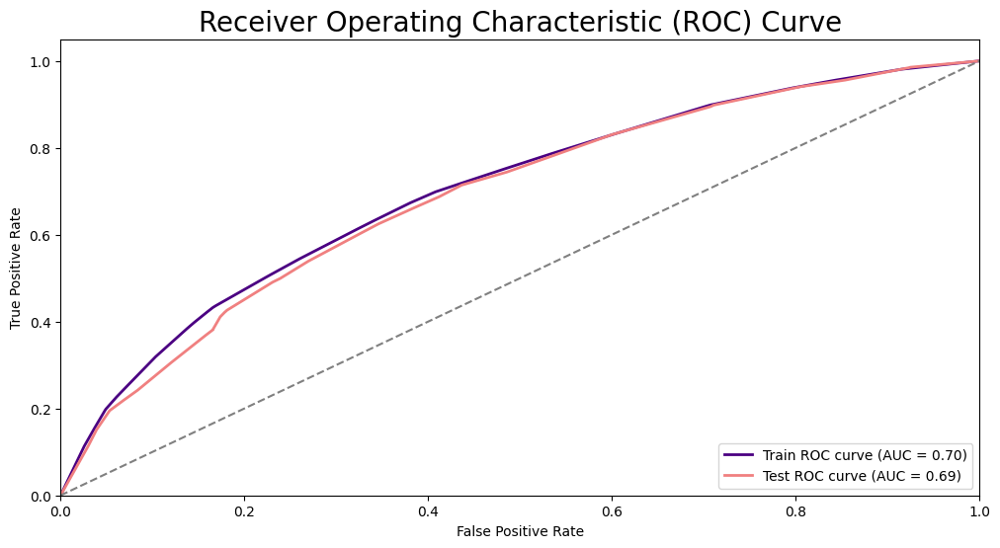

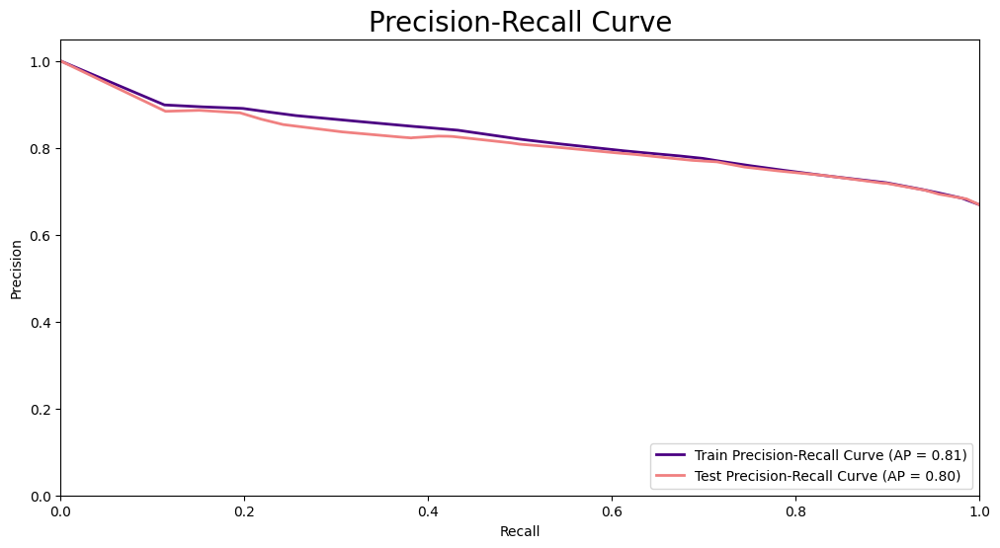

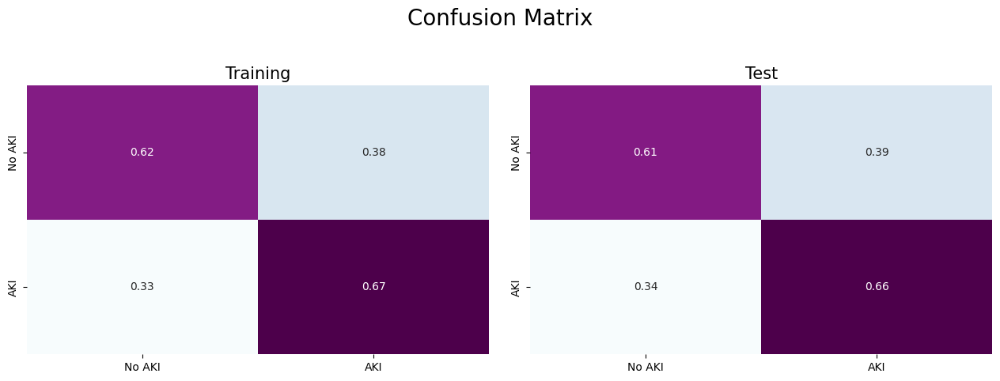

In [92]:
# fit a model with the selected features and perform hyperparameter tuning
# define the base model for tuning
tree = DecisionTreeClassifier(class_weight='balanced',random_state=122)

# define the hyperparameter grid
param_grid = {
    'max_depth': [5,10,15]
}

# hyperparameter tuning via grid search
tree_sfs = helper.hyperparameterTuning(tree, param_grid, sfsFeats_tree, Xtrain_imputed, ytrain)

# model performance
helper.modelPerformance(tree_sfs, Xtrain_imputed[sfsFeats_tree], Xtest_imputed[sfsFeats_tree], ytrain, ytest)

#### 3.4.3 Genetic Algoritm

##### Classifier 1 | Logistic Regression

In [93]:
# define a RFE_estimator and base estimator 
gene_estimator = LogisticRegression(solver='saga', max_iter=100000, n_jobs=-1, random_state=122)

geneFeats_lr = helper.gaFeatureSelection(gene_estimator, X, y, population_size=20, generations=20)

gen	nevals	fitness	fitness_std	fitness_max	fitness_min
0  	20    	0.69625	0.00975422 	0.709112   	0.666342   
1  	40    	0.704753	0.00394378 	0.712381   	0.697388   
2  	40    	0.704897	0.00265311 	0.709112   	0.699124   
3  	40    	0.707289	0.00252239 	0.711492   	0.701123   
4  	40    	0.707669	0.00234377 	0.711132   	0.70287    
5  	40    	0.705339	0.00571077 	0.711132   	0.687636   
6  	40    	0.707018	0.00519742 	0.71206    	0.693369   
7  	40    	0.709004	0.00397547 	0.713629   	0.697609   
8  	40    	0.70598 	0.00659188 	0.713629   	0.69073    
9  	40    	0.706731	0.00675847 	0.712613   	0.689611   
10 	40    	0.709747	0.00296181 	0.712613   	0.703165   
11 	40    	0.709561	0.00473547 	0.712821   	0.694939   
12 	40    	0.706405	0.00979272 	0.714923   	0.683725   
13 	40    	0.709772	0.007517   	0.714923   	0.683725   
14 	40    	0.706651	0.00952323 	0.712821   	0.68406    
15 	40    	0.706431	0.00874444 	0.714379   	0.685428   
16 	40    	0.704749	0.00846857 	0.712613   	0.6854

In [94]:
# features selected for subsequent modelling
print('There are {} features selected via logistic regression with a genetic algorithm.'.format(len(geneFeats_lr)))
print('These features are',', '.join(geneFeats_lr))

There are 34 features selected via logistic regression with a genetic algorithm.
These features are admission_age, heart_rate_max, heart_rate_mean, sbp_min, sbp_max, dbp_max, dbp_mean, mbp_min, mbp_max, mbp_mean, resp_rate_max, resp_rate_mean, temperature_max, spo2_min, hematocrit_min.1, hematocrit_max.1, hemoglobin_min.1, hemoglobin_max.1, platelets_min, aniongap_min, bicarbonate_max.1, bun_min, chloride_max.1, glucose_min.2, sodium_min.1, potassium_min.1, potassium_max.1, pt_max, gcs_min, gcs_motor, gcs_verbal, gcs_unable, race_BLACK, race_HISPANIC/LATINO


Best Hyperparameters from Grid Search :  {'C': 5}
Best Weighted F1 Score:  0.720112248869323

Classification report for training data:
              precision    recall  f1-score   support

      No AKI       0.48      0.67      0.56     13488
         AKI       0.80      0.64      0.71     27248

    accuracy                           0.65     40736
   macro avg       0.64      0.66      0.64     40736
weighted avg       0.69      0.65      0.66     40736

Classification report for test data:
              precision    recall  f1-score   support

      No AKI       0.49      0.69      0.57      3372
         AKI       0.81      0.65      0.72      6812

    accuracy                           0.66     10184
   macro avg       0.65      0.67      0.65     10184
weighted avg       0.70      0.66      0.67     10184



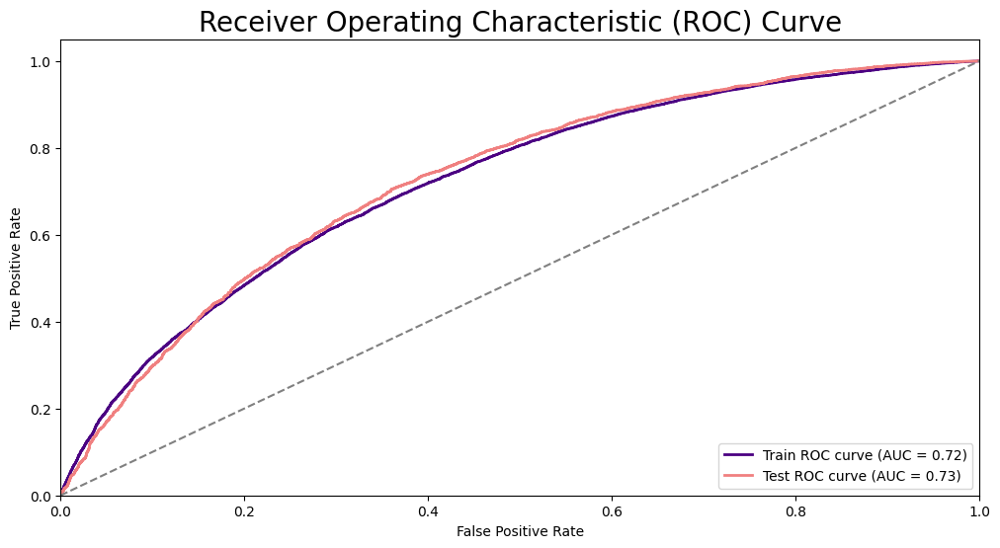

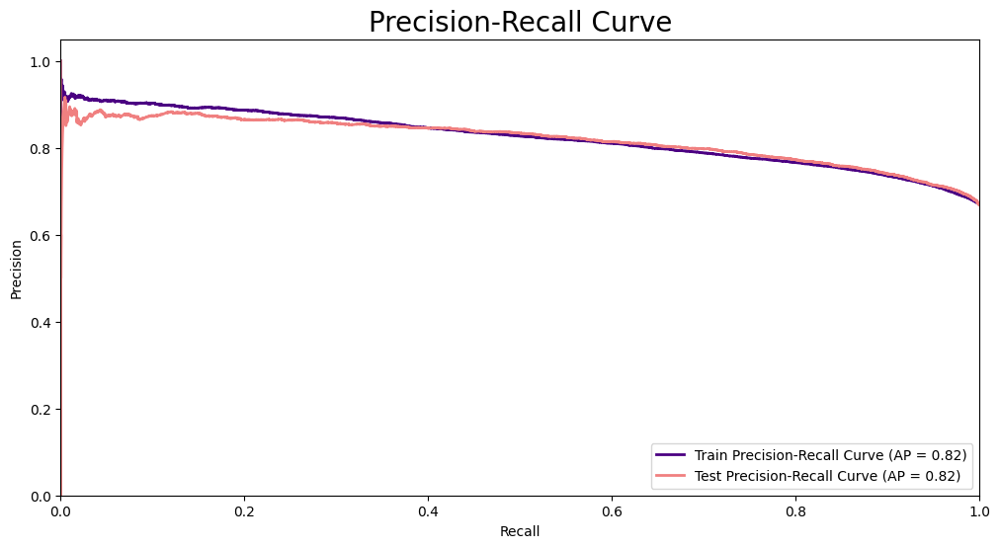

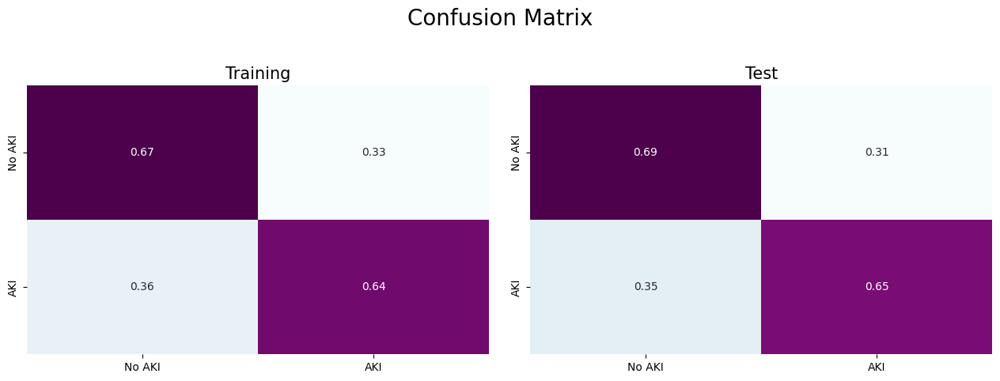

In [95]:
# fit a model with the selected features and perform hyperparameter tuning
# define the base model for tuning
logreg = LogisticRegression(penalty='l2',              # add l2 regularization - also default parameter
                            class_weight='balanced',   # uses the values of y to automatically adjust weights inversely proportional to class frequencies (assigns higher weights to the minority class; lower weights to the majority class)
                            solver='saga', 
                            max_iter=100000, 
                            random_state=122)

# define the search grid
param_grid = {
    'C': [1,5,10,15]
}

# hyperparameter tuning via grid search approach
logreg_gene = helper.hyperparameterTuning(logreg, param_grid, geneFeats_lr, Xtrain_imputed, ytrain)

# model performance
helper.modelPerformance(logreg_gene, Xtrain_imputed[geneFeats_lr], Xtest_imputed[geneFeats_lr], ytrain, ytest)

### 3.5 Feature Selection Method 3 | Embedded Method

In the embedded method, the search for optimum feature subset and model construction is combined in a single step. Briefly, in the embedded method, feature selection is integrated into the classifier algorithm. As the classifier undergoes training, it adjusts the internal parameters and assigns the appropriate weights/importance given for each feature to optimize the classification accuracy. Tree-based algorithms such as decision tree, random forest, and gradient boosting) and model using regularization technique for feature selection (LASSO) are examples of embedded method (Pudjihartonoet al., 2022). A random forest and logistic regression with L1 regularization models were trained in this project. The feature importance and the coefficients of each independent variable assigned by these models were calculated and shown in the following section.

Reference: Pudjihartono N, Fadason T, Kempa-Liehr AW, O’Sullivan JM. A Review of Feature Selection Methods for Machine Learning-Based Disease Risk Prediction. Frontiers in Bioinformatics. 2022;2. doi:10.3389/fbinf.2022.927312

##### Classifier 1 | Random Forest

In [97]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold

stratifiedCV = StratifiedKFold(n_splits=5)

# define a Random Forest Classifier
forest = RandomForestClassifier(class_weight='balanced', n_jobs=-1, random_state=122)

# define the hyperparameter grid for search
param_grid = {
    'n_estimators':[100,150,200,250,300],
    'max_depth':[5,7,10]
             }

grid_search = GridSearchCV(forest,
                           param_grid,
                           cv=stratifiedCV, 
                           scoring='roc_auc', 
                           n_jobs=-1)           

# fit the data into the grid search space
grid_search.fit(Xtrain_imputed, ytrain)

# print the best parameters and the corresponding ROC_AUC score
print('Best Hyperparameters from Grid Search : ', grid_search.best_params_)
print('Best AUROC Score: ', grid_search.best_score_)
print()

# get the best model
forest_tuned = grid_search.best_estimator_

Best Hyperparameters from Grid Search :  {'max_depth': 10, 'n_estimators': 250}
Best AUROC Score:  0.7372758877680774



Classification report for training data:
              precision    recall  f1-score   support

      No AKI       0.63      0.76      0.69     13488
         AKI       0.87      0.78      0.82     27248

    accuracy                           0.78     40736
   macro avg       0.75      0.77      0.76     40736
weighted avg       0.79      0.78      0.78     40736

Classification report for test data:
              precision    recall  f1-score   support

      No AKI       0.53      0.61      0.57      3372
         AKI       0.79      0.74      0.76      6812

    accuracy                           0.69     10184
   macro avg       0.66      0.67      0.66     10184
weighted avg       0.71      0.69      0.70     10184



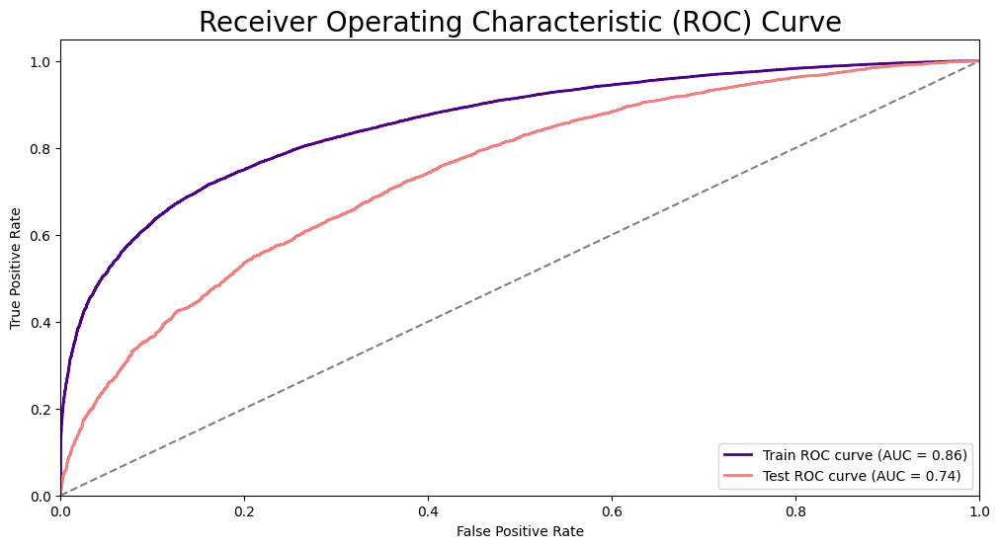

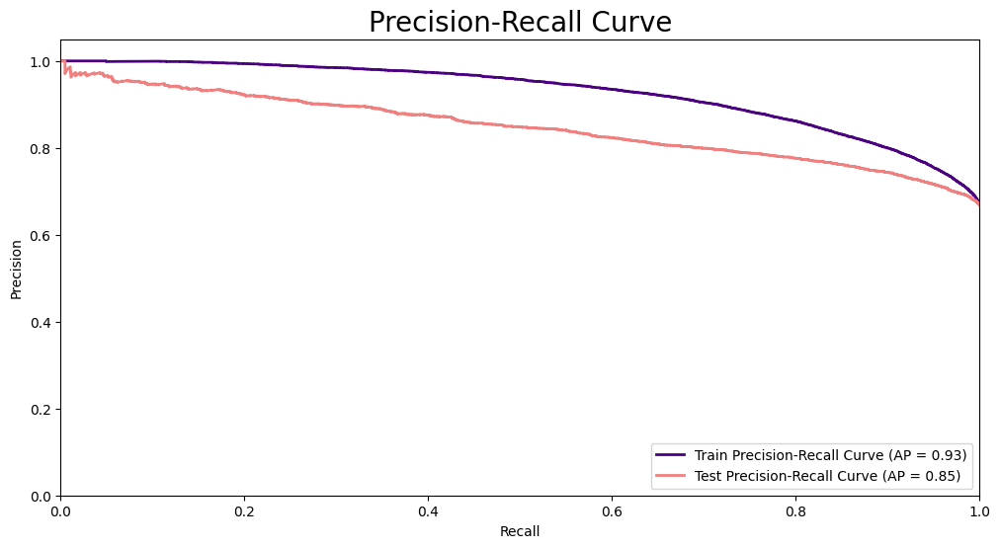

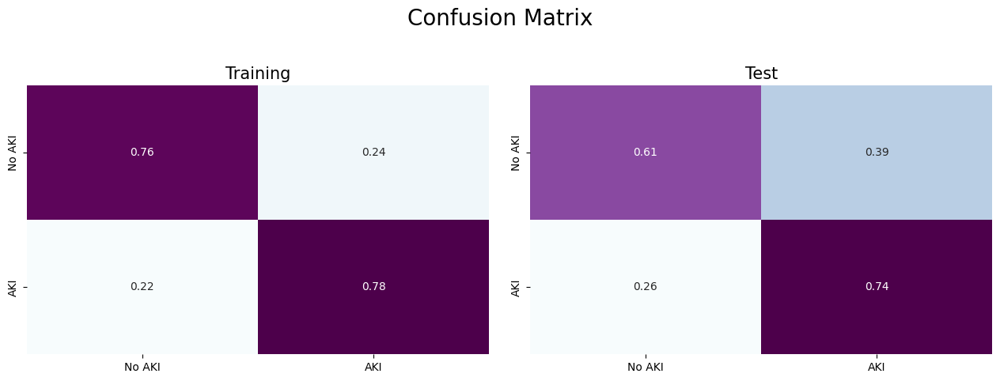

In [98]:
# evaluate the model performance
helper.modelPerformance(forest_tuned, Xtrain_imputed, Xtest_imputed, ytrain, ytest)

In [99]:
# check the feature importances
scores = forest_tuned.feature_importances_
imp_feat_forest = pd.Series(scores, index=Xtrain_imputed.columns).sort_values(ascending=True)

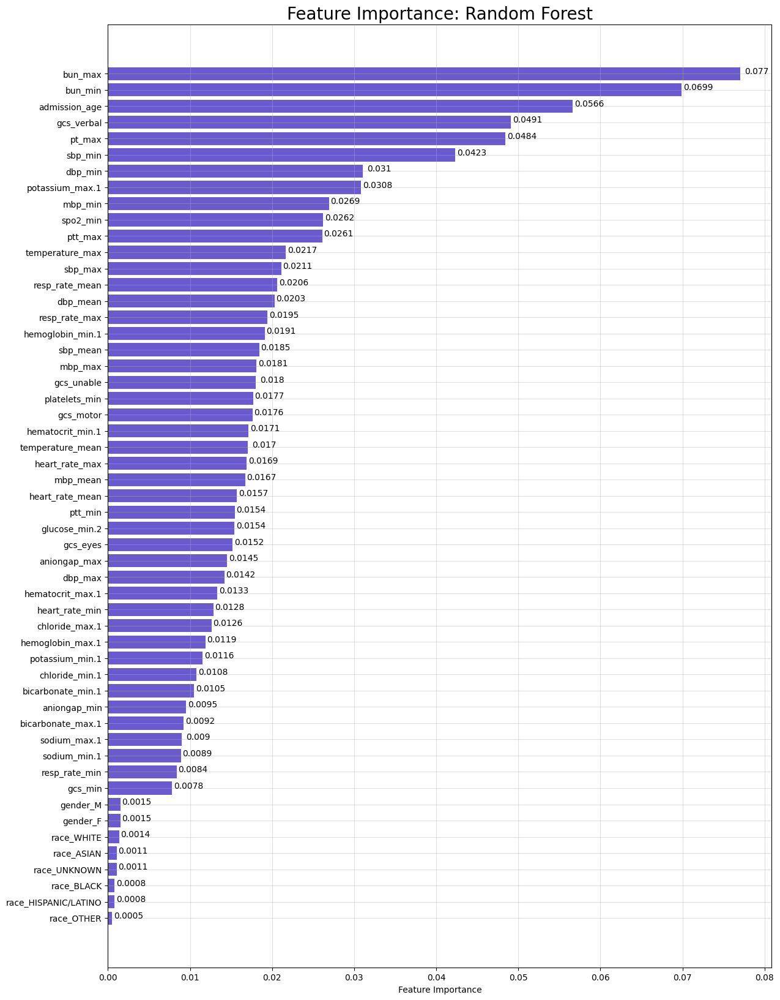

In [100]:
# plot the feature importance
plt.figure(figsize=(14,20))
plt.barh(y=imp_feat_forest.index, width=imp_feat_forest.values, color='slateblue')
plt.xlabel('Feature Importance')

for index, values in enumerate(imp_feat_forest):
    plt.text(values+0.002, index, str(round(values,4)), ha='center')

plt.grid(alpha=0.4)
plt.title('Feature Importance: Random Forest', fontsize=20)
plt.show()

In [101]:
# performance summary by key metrics 
rf_embedded = helper.eval_metrics(forest_tuned, Xtest_imputed, ytest, 'RandomForest-EmbeddedMethod')

##### Classifier 2 | Logistic Regression (L1 Penalty - LASSO)

In [103]:
# fit a model with the selected features and perform hyperparameter tuning
# define the base model for tuning
logreg_lasso = LogisticRegression(penalty='l1',              # use l1 regularization 
                                  class_weight='balanced',   
                                  solver='saga', 
                                  max_iter=100000, 
                                  random_state=122)

# define the search grid
param_grid = {
    'C': [0.01,0.1,1,10]
}

grid_search_lasso = GridSearchCV(logreg_lasso,
                                 param_grid,
                                 cv=stratifiedCV, 
                                 scoring='roc_auc', 
                                 n_jobs=-1)           

# fit the data into the grid search space
grid_search_lasso.fit(Xtrain_imputed, ytrain)

# print the best parameters and the corresponding ROC_AUC score
print('Best Hyperparameters from Grid Search : ', grid_search_lasso.best_params_)
print('Best AUROC Score: ', grid_search_lasso.best_score_)
print()

# get the best model
lasso_tuned = grid_search_lasso.best_estimator_

Best Hyperparameters from Grid Search :  {'C': 10}
Best AUROC Score:  0.7272860180048502



Classification report for training data:
              precision    recall  f1-score   support

      No AKI       0.49      0.68      0.57     13488
         AKI       0.81      0.65      0.72     27248

    accuracy                           0.66     40736
   macro avg       0.65      0.67      0.65     40736
weighted avg       0.70      0.66      0.67     40736

Classification report for test data:
              precision    recall  f1-score   support

      No AKI       0.50      0.69      0.58      3372
         AKI       0.81      0.66      0.73      6812

    accuracy                           0.67     10184
   macro avg       0.66      0.67      0.65     10184
weighted avg       0.71      0.67      0.68     10184



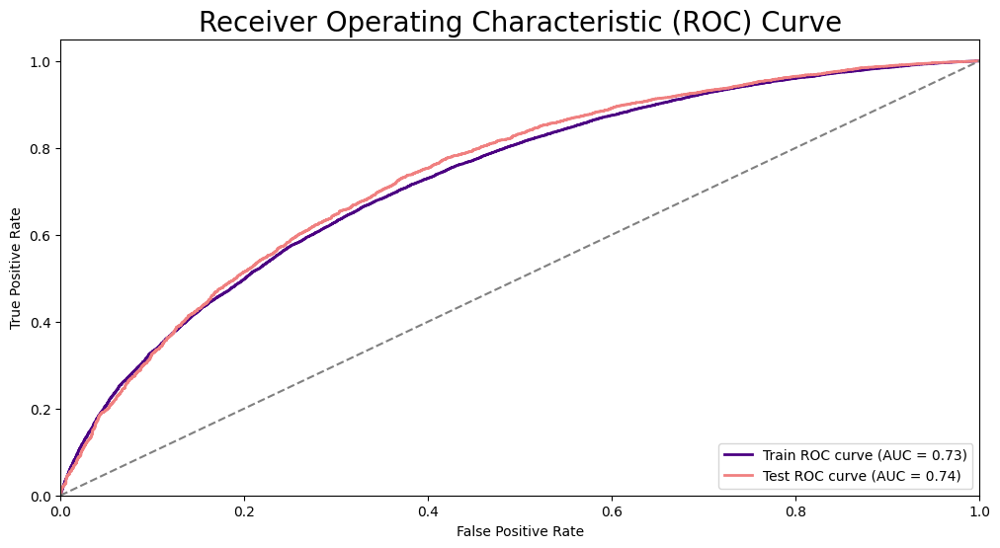

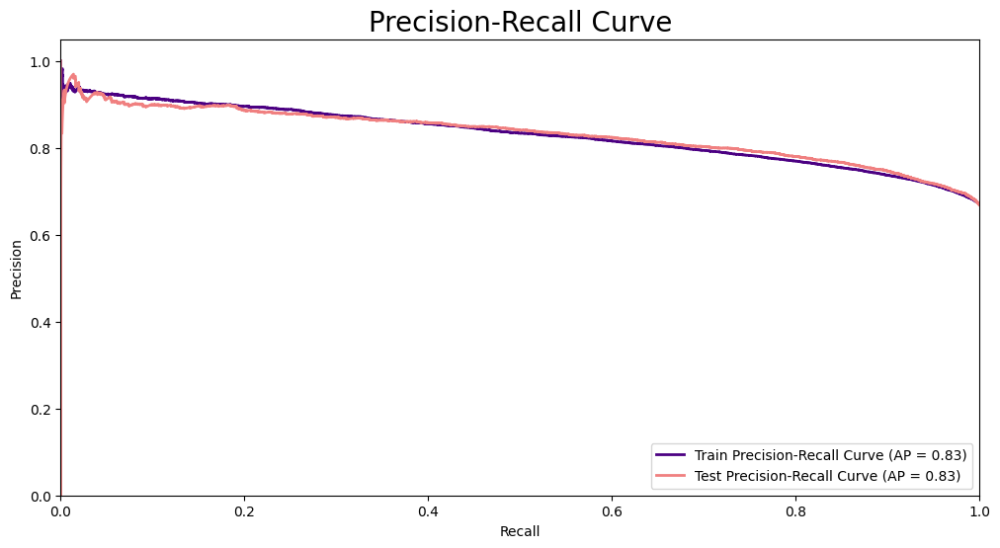

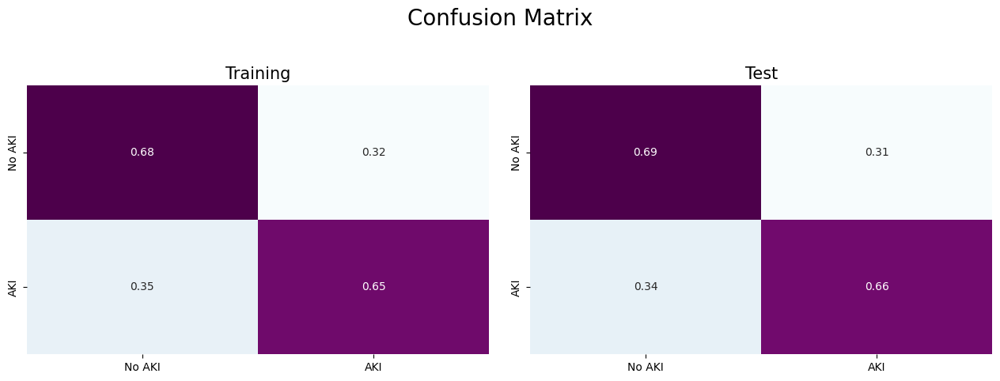

In [104]:
# evaluate the model performance
helper.modelPerformance(lasso_tuned, Xtrain_imputed, Xtest_imputed, ytrain, ytest)

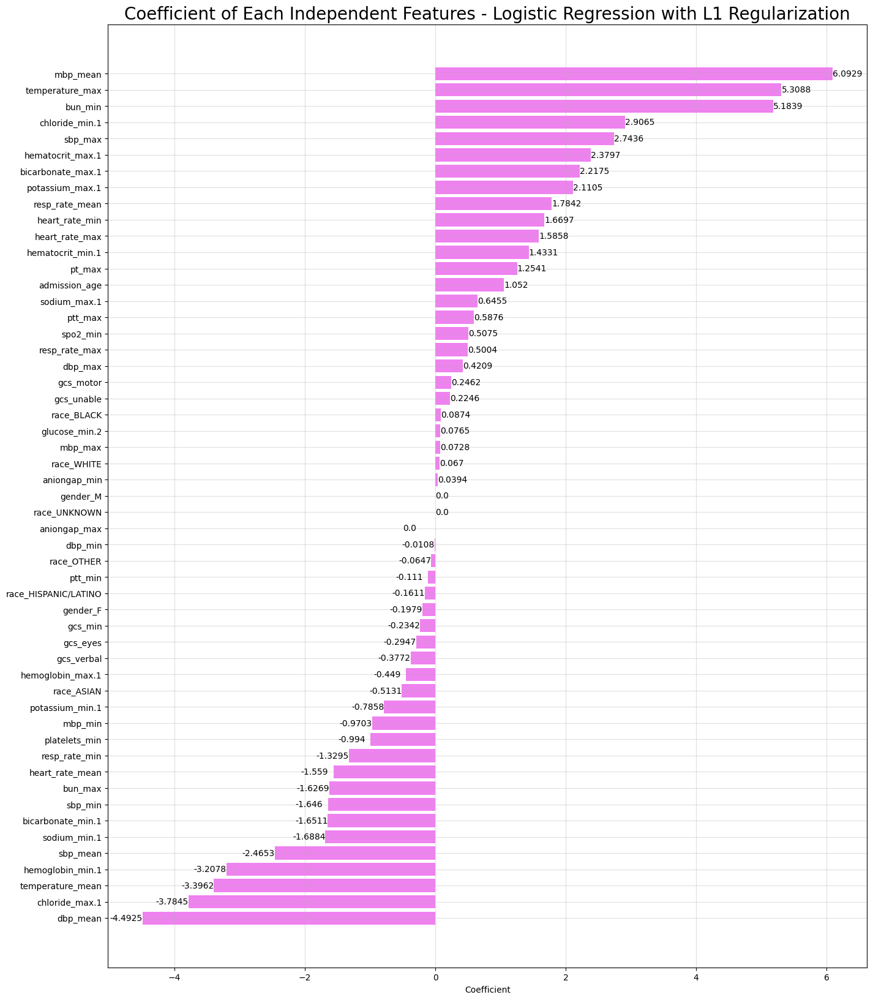

In [105]:
coef = lasso_tuned.coef_
lasso_coef = pd.Series(coef.flatten(), index=lasso_tuned.feature_names_in_).sort_values(ascending=True)


plt.figure(figsize=(16,20))
plt.barh(y=lasso_coef.index, width=lasso_coef.values, color='violet')
plt.xlabel('Coefficient')

for index, value in enumerate(lasso_coef):
    x = value if value > 0 else value - 0.5  # Adjust the offset as needed
    plt.text(x, index, str(round(value,4)), va='center')


plt.grid(alpha=0.4)
plt.title('Coefficient of Each Independent Features - Logistic Regression with L1 Regularization', fontsize=20)
plt.show()

In [106]:
# performance summary by key metrics 
lasso_embedded = helper.eval_metrics(lasso_tuned, Xtest_imputed, ytest, 'LogisticRegression-LASSO')

### 3.6 Models Performance Summary

In [107]:
# summary result for filter method feature selection
allResult = pd.concat([base_logreg, lasso_embedded, lr_filter, dtree_filter, extratree_filter, rf_filter, gradboost_filter, ab_filter, lr_rfe, dtree_rfe, rf_embedded], axis=0)
allResult
# allResult.to_csv('Result.csv')

,AUROC,Average_Precision,Precision,Recall,F1 score,False Positive Rate
LogisticRegression,0.738922,0.831936,0.655938,0.674767,0.653652,0.308422
LogisticRegression-LASSO,0.738882,0.831886,0.655331,0.674104,0.652978,0.309015
LogisticRegression-FilterMethod,0.735465,0.828037,0.654865,0.673587,0.652479,0.309609
DecisionTree-FilterMethod,0.696076,0.801800,0.630882,0.644378,0.631377,0.382266
ExtraTree-FilterMethod,0.725210,0.831534,0.643258,0.660746,0.639940,0.323547
RandomForest-FilterMethod,0.738328,0.842473,0.657469,0.669105,0.660609,0.384045
GradientBoosting-FilterMethod,0.744003,0.844829,0.703988,0.638069,0.645765,0.631673
AdaBoost-FilterMethod,0.711631,0.819874,0.661547,0.614330,0.618662,0.652432
LogisticRegression-WrapperMethodRFE,0.727097,0.819970,0.645184,0.663134,0.641193,0.315540
DecisionTree-WrapperMethodRFE,0.697572,0.807405,0.629232,0.641982,0.630153,0.391756


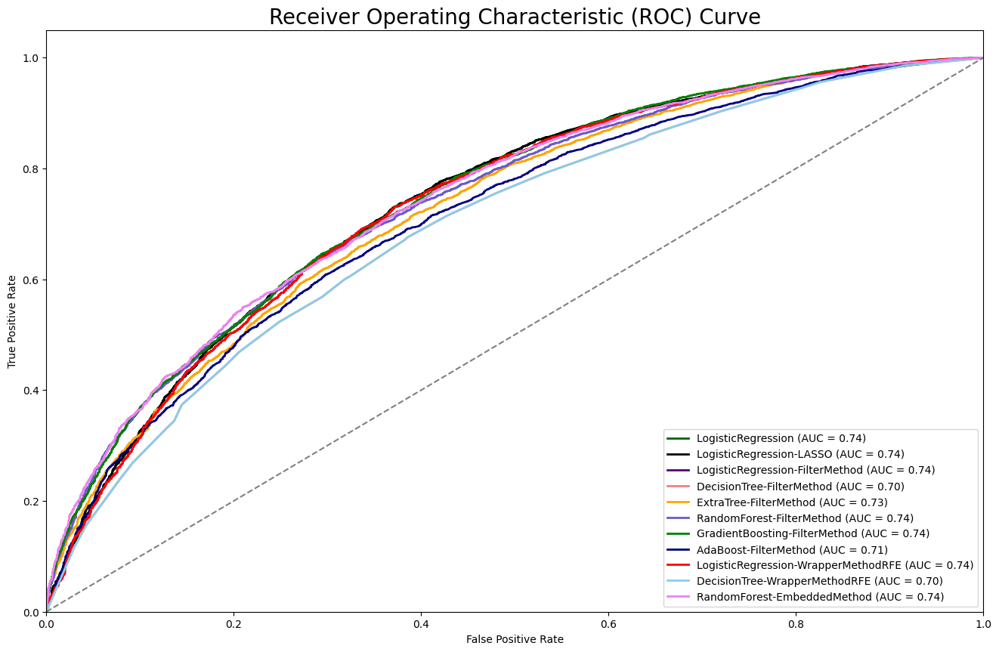

In [108]:
lr_base_proba = logreg_base.predict_proba(Xtest_imputed)
lasso_embedded_proba = lasso_tuned.predict_proba(Xtest_imputed)
lr_filter_proba = logreg_filter.predict_proba(Xtest_imputed[filterFeats_lr])
dtree_filter_proba = tree_filter.predict_proba(Xtest_imputed[filterFeats_tree])
extratree_filter_proba = etc_filter.predict_proba(Xtest_imputed[filterFeats_tree])
rf_filter_proba = forest_filter.predict_proba(Xtest_imputed[filterFeats_tree])
gradboost_filter_proba = gbc_filter.predict_proba(Xtest_imputed[filterFeats_tree])
adaboost_filter_proba = adaboost_filter.predict_proba(Xtest_imputed[filterFeats_tree])
lr_rfe_proba = logreg_filter.predict_proba(Xtest_imputed[filterFeats_lr])
dtree_rfe_proba = tree_filter.predict_proba(Xtest_imputed[filterFeats_tree])
rf_embedded_proba = forest_tuned.predict_proba(Xtest_imputed)


# plot the ROC curve
fpr_base, tpr_base, threshold = roc_curve(ytest, lr_base_proba[:,1])
roc_auc_base = auc(fpr_base, tpr_base)

fpr_lasso_emb, tpr_lasso_emb, threshold = roc_curve(ytest, lasso_embedded_proba[:,1])
roc_auc_lasso_emb = auc(fpr_lasso_emb, tpr_lasso_emb)

fpr_lr_filter, tpr_lr_filter, threshold = roc_curve(ytest, lr_filter_proba[:,1])
roc_auc_lr_filter = auc(fpr_lr_filter, tpr_lr_filter)

fpr_dtree_filter, tpr_dtree_filter, threshold = roc_curve(ytest, dtree_filter_proba[:,1])
roc_auc_dtree_filter = auc(fpr_dtree_filter, tpr_dtree_filter)

fpr_extree_filter, tpr_extree_filter, threshold = roc_curve(ytest, extratree_filter_proba[:,1])
roc_auc_extree_filter = auc(fpr_extree_filter, tpr_extree_filter)

fpr_rf_filter, tpr_rf_filter, threshold = roc_curve(ytest, rf_filter_proba[:,1])
roc_auc_rf_filter = auc(fpr_rf_filter, tpr_rf_filter)

fpr_gb_filter, tpr_gb_filter, threshold = roc_curve(ytest, gradboost_filter_proba[:,1])
roc_auc_gb_filter = auc(fpr_gb_filter, tpr_gb_filter)

fpr_ab_filter, tpr_ab_filter, threshold = roc_curve(ytest, adaboost_filter_proba[:,1])
roc_auc_ab_filter = auc(fpr_ab_filter, tpr_ab_filter)

fpr_lr_rfe, tpr_lr_rfe, threshold = roc_curve(ytest, lr_rfe_proba[:,1])
roc_auc_lr_rfe = auc(fpr_lr_rfe, tpr_lr_rfe)

fpr_dtree_rfe, tpr_dtree_rfe, threshold = roc_curve(ytest, dtree_rfe_proba[:,1])
roc_auc_dtree_rfe = auc(fpr_dtree_rfe, tpr_dtree_rfe)

fpr_rf_emb, tpr_ef_emb, threshold = roc_curve(ytest, rf_embedded_proba[:,1])
roc_auc_rf_emb = auc(fpr_rf_emb, tpr_ef_emb)




plt.figure(figsize=(16, 10))
plt.plot(fpr_base, tpr_base, color='darkgreen', lw=2, label=f'LogisticRegression (AUC = {roc_auc_base:.2f})')
plt.plot(fpr_lasso_emb, tpr_lasso_emb, color='black', lw=2, label=f'LogisticRegression-LASSO (AUC = {roc_auc_lasso_emb:.2f})')
plt.plot(fpr_lr_filter, tpr_lr_filter, color='indigo', lw=2, label=f'LogisticRegression-FilterMethod (AUC = {roc_auc_lr_filter:.2f})')
plt.plot(fpr_dtree_filter, tpr_dtree_filter, color='lightcoral', lw=2, label=f'DecisionTree-FilterMethod (AUC = {roc_auc_dtree_filter:.2f})')
plt.plot(fpr_extree_filter, tpr_extree_filter, color='orange', lw=2, label=f'ExtraTree-FilterMethod (AUC = {roc_auc_extree_filter:.2f})')
plt.plot(fpr_rf_filter, tpr_rf_filter, color='slateblue', lw=2, label=f'RandomForest-FilterMethod (AUC = {roc_auc_rf_filter:.2f})')
plt.plot(fpr_gb_filter, tpr_gb_filter, color='green', lw=2, label=f'GradientBoosting-FilterMethod (AUC = {roc_auc_gb_filter:.2f})')
plt.plot(fpr_ab_filter, tpr_ab_filter, color='navy', lw=2, label=f'AdaBoost-FilterMethod (AUC = {roc_auc_ab_filter:.2f})')
plt.plot(fpr_lr_rfe, tpr_lr_rfe, color='red', lw=2, label=f'LogisticRegression-WrapperMethodRFE (AUC = {roc_auc_lr_rfe:.2f})')
plt.plot(fpr_dtree_rfe, tpr_dtree_rfe, color='skyblue', lw=2, label=f'DecisionTree-WrapperMethodRFE (AUC = {roc_auc_dtree_rfe:.2f})')
plt.plot(fpr_rf_emb, tpr_ef_emb, color='violet', lw=2, label=f'RandomForest-EmbeddedMethod (AUC = {roc_auc_rf_emb:.2f})')


plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=20)
plt.legend(loc='lower right')
plt.show()

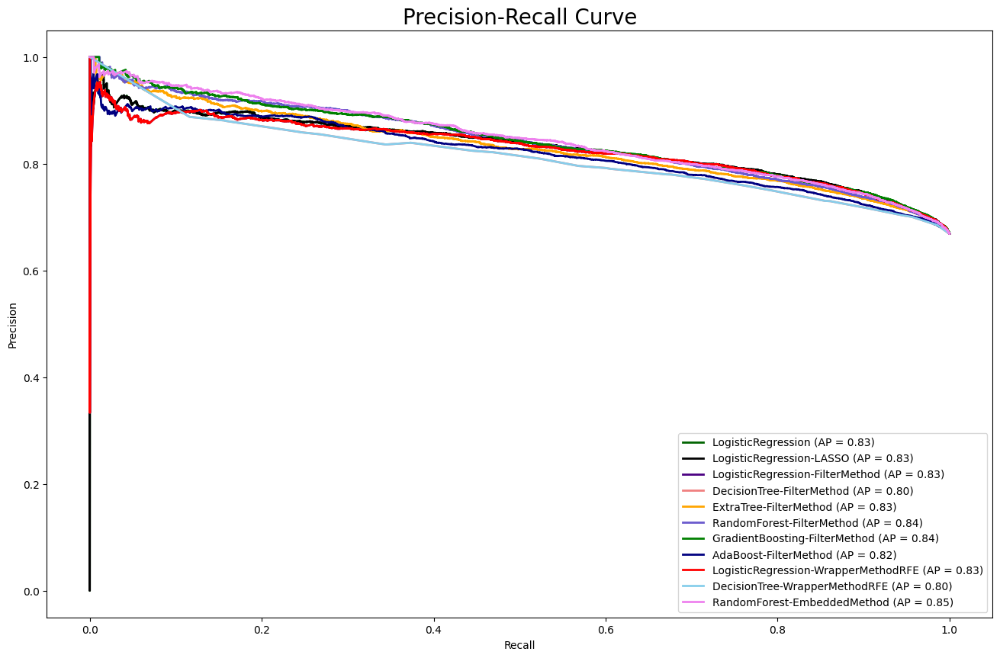

In [109]:
# precision-recall curve
precision_lr_base, recall_lr_base, thresholds_lr_base = precision_recall_curve(ytest, lr_base_proba[:,1])
precision_lasso_emb, recall_lasso_emb, thresholds_lasso_emb = precision_recall_curve(ytest, lasso_embedded_proba[:,1])
precision_lr_filter, recall_lr_filter, thresholds_lr = precision_recall_curve(ytest, lr_filter_proba[:,1])
precision_dtree_filter, recall_dtree_filter, thresholds_dtree = precision_recall_curve(ytest, dtree_filter_proba[:,1])
precision_extree_filter, recall_extree_filter, thresholds_extree = precision_recall_curve(ytest, extratree_filter_proba[:,1])
precision_rf_filter, recall_rf_filter, thresholds_rf = precision_recall_curve(ytest, rf_filter_proba[:,1])
precision_gb_filter, recall_gb_filter, thresholds_gb = precision_recall_curve(ytest, gradboost_filter_proba[:,1])
precision_ab_filter, recall_ab_filter, thresholds_ab = precision_recall_curve(ytest, adaboost_filter_proba[:,1])
precision_lr_rfe, recall_lr_rfe, thresholds_lr = precision_recall_curve(ytest, lr_rfe_proba[:,1])
precision_dtree_rfe, recall_dtree_rfe, thresholds_dtree = precision_recall_curve(ytest, dtree_rfe_proba[:,1])
precision_rf_emb, recall_rf_emb, thresholds_rf_emb = precision_recall_curve(ytest, rf_embedded_proba[:,1])

# compute average precision 
ap_lr_base = average_precision_score(ytest, lr_base_proba[:, 1])
ap_lasso_emb = average_precision_score(ytest, lasso_embedded_proba[:, 1])
ap_lr_filter = average_precision_score(ytest, lr_filter_proba[:, 1])
ap_dtree_filter = average_precision_score(ytest, dtree_filter_proba[:, 1])
ap_extree_filter = average_precision_score(ytest, extratree_filter_proba[:, 1])
ap_rf_filter = average_precision_score(ytest, rf_filter_proba[:, 1])
ap_gb_filter = average_precision_score(ytest, gradboost_filter_proba[:, 1])
ap_ab_filter = average_precision_score(ytest, adaboost_filter_proba[:, 1])
ap_lr_rfe = average_precision_score(ytest, lr_rfe_proba[:, 1])
ap_dtree_rfe = average_precision_score(ytest, dtree_rfe_proba[:, 1])
ap_fr_emb = average_precision_score(ytest, rf_embedded_proba[:, 1])

plt.figure(figsize=(16,10))
plt.plot(recall_lr_base, precision_lr_base, color='darkgreen', lw=2, label=f'LogisticRegression (AP = {ap_lr_base:.2f})')
plt.plot(recall_lasso_emb, precision_lasso_emb, color='black', lw=2, label=f'LogisticRegression-LASSO (AP = {ap_lasso_emb:.2f})')
plt.plot(recall_lr_filter, precision_lr_filter, color='indigo', lw=2, label=f'LogisticRegression-FilterMethod (AP = {ap_lr_filter:.2f})')
plt.plot(recall_dtree_filter, precision_dtree_filter, color='lightcoral', lw=2, label=f'DecisionTree-FilterMethod (AP = {ap_dtree_filter:.2f})')
plt.plot(recall_extree_filter, precision_extree_filter, color='orange', lw=2, label=f'ExtraTree-FilterMethod (AP = {ap_extree_filter:.2f})')
plt.plot(recall_rf_filter, precision_rf_filter, color='slateblue', lw=2, label=f'RandomForest-FilterMethod (AP = {ap_rf_filter:.2f})')
plt.plot(recall_gb_filter, precision_gb_filter, color='green', lw=2, label=f'GradientBoosting-FilterMethod (AP = {ap_gb_filter:.2f})')
plt.plot(recall_ab_filter, precision_ab_filter, color='navy', lw=2, label=f'AdaBoost-FilterMethod (AP = {ap_ab_filter:.2f})')
plt.plot(recall_lr_rfe, precision_lr_rfe, color='red', lw=2, label=f'LogisticRegression-WrapperMethodRFE (AP = {ap_lr_rfe:.2f})')
plt.plot(recall_dtree_rfe, precision_dtree_rfe, color='skyblue', lw=2, label=f'DecisionTree-WrapperMethodRFE (AP = {ap_dtree_rfe:.2f})')
plt.plot(recall_rf_emb, precision_rf_emb, color='violet', lw=2, label=f'RandomForest-EmbeddedMethod (AP = {ap_fr_emb:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve', fontsize=20)
plt.legend(loc='best')
plt.show()